# Lending Club Case Study

## Problem Statement

For a largest online loan marketplace, which specialises in lending various types of loans to urban customers at lower interest rate through a fast online interface, we need to do analysis to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of a loan default.  


The data provided contains information about past loan applicants and whether they ‘defaulted’ or not. Considering it, the analysis is done to identify patterns which indicate if a person is likely to default, which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. 

The company can utilise this knowledge for its portfolio and risk assessment which will thereby help them to minimize the following two risks assosciated with its decision while providing loan to applicants:

- If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company
- If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company


#### Importing libraries

In [1]:
#importing the libraries required to do the analysis
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings(action="ignore") # for removal of warning messages

#### Loading the dataset

In [2]:
#reading the dataset and viewing the first few rows of the dataset to get an overview of how the dataset looks like
loan_data = pd.read_csv('loan.csv')
loan_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


### Data Sanity Checks

In [3]:
#examining the number of rows and columns present in the dataset. 
#39717 rows & 111 columns are present in the dataset.
loan_data.shape


(39717, 111)

In [4]:
#Indexing for columns that have null values within the dataset
loan_data[loan_data.columns[loan_data.isnull().any()]]

,emp_title,emp_length,desc,title,mths_since_last_delinq,mths_since_last_record,revol_util,last_pymnt_d,next_pymnt_d,last_credit_pull_d,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,NaN,10+ years,Borrower added on 12/22/11 > I need to upgra...,Computer,NaN,NaN,83.70%,Jan-15,NaN,May-16,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,Ryder,< 1 year,Borrower added on 12/22/11 > I plan to use t...,bike,NaN,NaN,9.40%,Apr-13,NaN,Sep-13,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,NaN,10+ years,NaN,real estate business,NaN,NaN,98.50%,Jun-14,NaN,May-16,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,AIR RESOURCES BOARD,10+ years,Borrower added on 12/21/11 > to pay for prop...,personel,35.0,NaN,21%,Jan-15,NaN,Apr-16,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,University Medical Group,1 year,Borrower added on 12/21/11 > I plan on combi...,Personal,38.0,NaN,53.90%,May-16,Jun-16,May-16,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,FiSite Research,4 years,Our current gutter system on our home is old a...,Home Improvement,0.0,0.0,13.10%,Jul-10,NaN,Jun-10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39713,"Squarewave Solutions, Ltd.",3 years,The rate of interest and fees incurred by carr...,Retiring credit card debt,5.0,0.0,26.90%,Jul-10,NaN,Jul-10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39714,NaN,< 1 year,NaN,MBA Loan Consolidation,0.0,0.0,19.40%,Apr-08,NaN,Jun-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39715,NaN,< 1 year,NaN,JAL Loan,0.0,0.0,0.70%,Jan-08,NaN,Jun-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
loan_data.isna().sum().sort_values(ascending=False)

verification_status_joint    39717
annual_inc_joint             39717
mo_sin_old_rev_tl_op         39717
mo_sin_old_il_acct           39717
bc_util                      39717
                             ...  
delinq_amnt                      0
policy_code                      0
earliest_cr_line                 0
delinq_2yrs                      0
id                               0
Length: 111, dtype: int64

<b>Key Observation</b>

From the above result, it is found that for some of the columns, all the values are null. We will drop the columns having all NA values, as they wont help at all in our analysis.

In [6]:
#Dropping the columns that have all the values as NA. There are aroung 57 columns now left, out of the 111 earlier.
loan_data = loan_data.dropna(axis = 1, how = 'all')
loan_data.shape

(39717, 57)

In [7]:
# Re-checking again if there are any columns where the NA count is high
loan_data.isna().sum().sort_values(ascending=False)

next_pymnt_d                  38577
mths_since_last_record        36931
mths_since_last_delinq        25682
desc                          12940
emp_title                      2459
emp_length                     1075
pub_rec_bankruptcies            697
last_pymnt_d                     71
chargeoff_within_12_mths         56
collections_12_mths_ex_med       56
revol_util                       50
tax_liens                        39
title                            11
last_credit_pull_d                2
home_ownership                    0
int_rate                          0
out_prncp_inv                     0
total_pymnt                       0
total_pymnt_inv                   0
total_rec_prncp                   0
total_rec_int                     0
total_rec_late_fee                0
recoveries                        0
collection_recovery_fee           0
term                              0
last_pymnt_amnt                   0
initial_list_status               0
funded_amnt_inv             

### Missing Value Imputation

<b>Dropping the columns where the percentage of NA values is quite high, as they won't help much in our analysis. Moreover, for the columns where the percentage of NA values is not that high, we will carry out impute operation</b>

In [8]:
#Dropping the columns where the percentage of NA values was quite high
loan_data.drop(['next_pymnt_d', 'mths_since_last_record', 'mths_since_last_delinq','desc'], axis=1, inplace=True)

#Rechecking again on the NA values left now
loan_data.isna().sum().sort_values(ascending=False)

emp_title                     2459
emp_length                    1075
pub_rec_bankruptcies           697
last_pymnt_d                    71
collections_12_mths_ex_med      56
chargeoff_within_12_mths        56
revol_util                      50
tax_liens                       39
title                           11
last_credit_pull_d               2
total_rec_prncp                  0
out_prncp                        0
initial_list_status              0
out_prncp_inv                    0
total_acc                        0
total_pymnt                      0
total_pymnt_inv                  0
collection_recovery_fee          0
total_rec_int                    0
total_rec_late_fee               0
recoveries                       0
pub_rec                          0
last_pymnt_amnt                  0
policy_code                      0
application_type                 0
acc_now_delinq                   0
delinq_amnt                      0
revol_bal                        0
id                  

In [9]:
#Rechecking the number of Rows and columns, after doing the necessary cleaning
loan_data.shape

(39717, 53)

In [10]:
#Inspecting the emp length column values
loan_data['emp_length'].value_counts()

10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: emp_length, dtype: int64

In [11]:
#Imputing the missing values in emp_length column with the mode
loan_data['emp_length'].fillna(loan_data['emp_length'].mode()[0], inplace=True)

In [12]:
#Rechecking if there is still any NA value for emp_length
loan_data.isna().sum().sort_values(ascending=False)

emp_title                     2459
pub_rec_bankruptcies           697
last_pymnt_d                    71
chargeoff_within_12_mths        56
collections_12_mths_ex_med      56
revol_util                      50
tax_liens                       39
title                           11
last_credit_pull_d               2
total_rec_prncp                  0
total_acc                        0
initial_list_status              0
out_prncp                        0
out_prncp_inv                    0
total_pymnt                      0
total_pymnt_inv                  0
collection_recovery_fee          0
total_rec_int                    0
total_rec_late_fee               0
recoveries                       0
pub_rec                          0
last_pymnt_amnt                  0
policy_code                      0
application_type                 0
acc_now_delinq                   0
delinq_amnt                      0
revol_bal                        0
id                               0
open_acc            

From above operation, we were able to fill all the NA values for <b>'emp_length'</b>

In [13]:
#Inspecting the emp title column values

loan_data.emp_title.value_counts()

US Army                              134
Bank of America                      109
IBM                                   66
AT&T                                  59
Kaiser Permanente                     56
                                    ... 
Community College of Philadelphia      1
AMEC                                   1
lee county sheriff                     1
Bacon County Board of Education        1
Evergreen Center                       1
Name: emp_title, Length: 28820, dtype: int64

<b> Key Observation</b>

From the above result, it was noticed that several values are in different cases and are repeated. For eg, US Army is represented in different manner like U.S. Army, US ARMY, us army.

This column may not help much in analysing the patterns of defaulters, hence we will drop it from our analysis

In [14]:
#dropping the missing values in emp_title column, which represents the firm where the applicant works
loan_data = loan_data.dropna(subset=['emp_title'])

In [15]:
#Rechecking if there is still any NA value for emp_title
loan_data.isna().sum().sort_values(ascending=False)

pub_rec_bankruptcies          654
last_pymnt_d                   64
chargeoff_within_12_mths       47
collections_12_mths_ex_med     47
revol_util                     46
tax_liens                      32
title                           9
total_rec_prncp                 0
revol_bal                       0
total_acc                       0
initial_list_status             0
out_prncp                       0
out_prncp_inv                   0
total_pymnt                     0
total_pymnt_inv                 0
recoveries                      0
total_rec_int                   0
total_rec_late_fee              0
open_acc                        0
collection_recovery_fee         0
last_pymnt_amnt                 0
last_credit_pull_d              0
policy_code                     0
application_type                0
acc_now_delinq                  0
delinq_amnt                     0
pub_rec                         0
id                              0
member_id                       0
home_ownership

In [16]:
#Inspecting the values of pub_rec_bankruptcies column
loan_data['pub_rec_bankruptcies'].value_counts()

0.0    35090
1.0     1507
2.0        7
Name: pub_rec_bankruptcies, dtype: int64

In [17]:
#Imputing the missing values in pub_rec_bankruptcies column with the median
loan_data['pub_rec_bankruptcies'].fillna(loan_data['pub_rec_bankruptcies'].median(), inplace=True)

In [18]:
#Rechecking if there is still any NA value for pub_rec_bankruptcies
loan_data.isna().sum().sort_values(ascending=False)

last_pymnt_d                  64
chargeoff_within_12_mths      47
collections_12_mths_ex_med    47
revol_util                    46
tax_liens                     32
title                          9
total_rec_int                  0
revol_bal                      0
total_acc                      0
initial_list_status            0
out_prncp                      0
out_prncp_inv                  0
total_pymnt                    0
total_pymnt_inv                0
total_rec_prncp                0
recoveries                     0
total_rec_late_fee             0
open_acc                       0
collection_recovery_fee        0
last_pymnt_amnt                0
last_credit_pull_d             0
policy_code                    0
application_type               0
acc_now_delinq                 0
delinq_amnt                    0
pub_rec_bankruptcies           0
pub_rec                        0
id                             0
member_id                      0
home_ownership                 0
loan_amnt 

In [19]:
#Inspecting the values of pub_rec_bankruptcies column
loan_data['last_pymnt_d'].value_counts()

May-16    1176
Mar-13     970
Dec-14     878
May-13     858
Feb-13     819
          ... 
Nov-08      10
Apr-08      10
Mar-08       5
Jan-08       2
Feb-08       1
Name: last_pymnt_d, Length: 101, dtype: int64

In [20]:
#Imputing the missing values in last_pymnt_d column with the mode
loan_data['last_pymnt_d'].fillna(loan_data['last_pymnt_d'].mode()[0], inplace=True)

In [21]:
#Rechecking if there is still any NA value for last_pymnt_d
loan_data.isna().sum().sort_values(ascending=False)

chargeoff_within_12_mths      47
collections_12_mths_ex_med    47
revol_util                    46
tax_liens                     32
title                          9
total_rec_int                  0
revol_bal                      0
total_acc                      0
initial_list_status            0
out_prncp                      0
out_prncp_inv                  0
total_pymnt                    0
total_pymnt_inv                0
total_rec_prncp                0
recoveries                     0
total_rec_late_fee             0
open_acc                       0
collection_recovery_fee        0
last_pymnt_d                   0
last_pymnt_amnt                0
last_credit_pull_d             0
policy_code                    0
application_type               0
acc_now_delinq                 0
delinq_amnt                    0
pub_rec_bankruptcies           0
pub_rec                        0
id                             0
member_id                      0
home_ownership                 0
loan_amnt 

In [22]:
#Inspecting the values of chargeoff_within_12_mths column
loan_data['chargeoff_within_12_mths'].value_counts()

0.0    37211
Name: chargeoff_within_12_mths, dtype: int64

In [23]:
#Imputing the missing values in chargeoff_within_12_mths column with 0.0, as most of the entries have that value
loan_data['chargeoff_within_12_mths'].fillna(0.0, inplace=True)

In [24]:
#Inspecting the values of collections_12_mths_ex_med column
loan_data['collections_12_mths_ex_med'].value_counts()

0.0    37211
Name: collections_12_mths_ex_med, dtype: int64

In [25]:
#Imputing the missing values in collections_12_mths_ex_med column with 0.0, as most of the entries have that value
loan_data['collections_12_mths_ex_med'].fillna(0.0, inplace=True)

In [26]:
#Inspecting the values of revol_util column
loan_data['revol_util'].value_counts()

0%        885
0.20%      60
63%        58
64.80%     55
66.60%     55
         ... 
25.74%      1
0.83%       1
47.36%      1
24.65%      1
7.28%       1
Name: revol_util, Length: 1082, dtype: int64

It is noticed above that the values of the column <b>'revol_util'</b> are having '%' character added which might be influencing the data type. The values in it capture the percentage values. We will get rid of this character to impute the missing values with the median value

In [27]:
#removing the last character
loan_data['revol_util']=loan_data['revol_util'].str.rstrip('%')

In [28]:
#checking the values again
loan_data['revol_util'].value_counts()

0        885
0.20      60
63        58
64.80     55
66.60     55
        ... 
25.74      1
0.83       1
47.36      1
24.65      1
7.28       1
Name: revol_util, Length: 1082, dtype: int64

In [29]:
#changing the data type as float and imputing the missing values with the median value
loan_data['revol_util']=loan_data['revol_util'].astype(float)
loan_data['revol_util'].fillna(loan_data['revol_util'].median(), inplace=True)

In [30]:
#Inspecting the values of tax_liens column
loan_data['tax_liens'].value_counts()

0.0    37226
Name: tax_liens, dtype: int64

In [31]:
#Imputing the missing values in tax_liens column with 0.0, as most of the entries have that value
loan_data['tax_liens'].fillna(0.0, inplace=True)

Checking the status of missing values in the data set, after performing several impute operations above. We notice that only for Title column the values are missing. Lets inspect that

In [32]:
loan_data.isna().sum().sort_values(ascending=False)

title                         9
id                            0
total_rec_late_fee            0
revol_bal                     0
revol_util                    0
total_acc                     0
initial_list_status           0
out_prncp                     0
out_prncp_inv                 0
total_pymnt                   0
total_pymnt_inv               0
total_rec_prncp               0
total_rec_int                 0
recoveries                    0
open_acc                      0
collection_recovery_fee       0
last_pymnt_d                  0
last_pymnt_amnt               0
last_credit_pull_d            0
collections_12_mths_ex_med    0
policy_code                   0
application_type              0
acc_now_delinq                0
chargeoff_within_12_mths      0
delinq_amnt                   0
pub_rec_bankruptcies          0
pub_rec                       0
inq_last_6mths                0
member_id                     0
home_ownership                0
loan_amnt                     0
funded_a

In [33]:
#Inspecting the values of title column
loan_data['title'].value_counts()

Debt Consolidation           2090
Debt Consolidation Loan      1653
Personal Loan                 633
Consolidation                 501
debt consolidation            474
                             ... 
Give Me The Money               1
Boat of my dreams               1
Ryan's Consolidation Loan       1
Highlander                      1
Retiring credit card debt       1
Name: title, Length: 18417, dtype: int64

From above output, it was noticed that the values are not standardised and some of them are repeated in different manner which essentialy represent the same thing. For eg: Debt consolidation is also represented as Debt Consolidation, Debt Consolidation Loan.

For now, lets impute the missing value in this column with the mode value of the column which is 'Debt Consolidation' itself.

In [34]:
#Imputing the missing values in last_pymnt_d column with the mode
loan_data['title'].fillna(loan_data['title'].mode()[0], inplace=True)

In [35]:
#Final inspetion to see if there are still any missing values present in the dataset
loan_data.isna().sum().sort_values(ascending=False)

id                            0
open_acc                      0
revol_bal                     0
revol_util                    0
total_acc                     0
initial_list_status           0
out_prncp                     0
out_prncp_inv                 0
total_pymnt                   0
total_pymnt_inv               0
total_rec_prncp               0
total_rec_int                 0
total_rec_late_fee            0
recoveries                    0
collection_recovery_fee       0
last_pymnt_d                  0
last_pymnt_amnt               0
last_credit_pull_d            0
collections_12_mths_ex_med    0
policy_code                   0
application_type              0
acc_now_delinq                0
chargeoff_within_12_mths      0
delinq_amnt                   0
pub_rec_bankruptcies          0
pub_rec                       0
inq_last_6mths                0
member_id                     0
earliest_cr_line              0
loan_amnt                     0
funded_amnt                   0
funded_a

In [36]:
#Checking the data types of all the columns to identify any data type mismatch
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37258 entries, 1 to 39716
Data columns (total 53 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          37258 non-null  int64  
 1   member_id                   37258 non-null  int64  
 2   loan_amnt                   37258 non-null  int64  
 3   funded_amnt                 37258 non-null  int64  
 4   funded_amnt_inv             37258 non-null  float64
 5   term                        37258 non-null  object 
 6   int_rate                    37258 non-null  object 
 7   installment                 37258 non-null  float64
 8   grade                       37258 non-null  object 
 9   sub_grade                   37258 non-null  object 
 10  emp_title                   37258 non-null  object 
 11  emp_length                  37258 non-null  object 
 12  home_ownership              37258 non-null  object 
 13  annual_inc                  372

It is seen now that all the missing values are dealt with in the data set now. Lets now inspect the data types for the columns and do necessary standardisation where the same values are represented in different ways.

***The Glossary of the 52 column names mentioned above is as follows:***

- id :        A unique LC assigned ID for the loan listing.
- member_id :        A unique LC assigned Id for the borrower member.
- loan_amnt :        The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.
- funded_amnt :        The total amount committed to that loan at that point in time.
- funded_amnt_inv :        The total amount committed by investors for that loan at that point in time.
- term :        The number of payments on the loan. Values are in months and can be either 36 or 60.
- int_rate :        Interest Rate on the loan
- installment :        The monthly payment owed by the borrower if the loan originates.
- grade :        LC assigned loan grade
- sub_grade :        LC assigned loan grade
- emp_title :        The job title supplied by the Borrower when applying for the loan.*
- emp_length :        Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.
- home_ownership :        The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.
- annual_inc :        The self-reported annual income provided by the borrower during registration.
- verification_status :        Indicates if income was verified by LC, not verified, or if the income source was verified
- issue_d :        The month which the loan was funded
- loan_status :        Current status of the loan
- pymnt_plan :        Indicates if a payment plan has been put in place for the loan
- url :        URL for the LC page with listing data.
- purpose :        A category provided by the borrower for the loan request.
- title :        The loan title provided by the borrower
- zip_code :        The first 3 numbers of the zip code provided by the borrower in the loan application.
- addr_state :        The state provided by the borrower in the loan application
- dti :        A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.
- delinq_2yrs :        The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years
- earliest_cr_line :        The month the borrower's earliest reported credit line was opened
- inq_last_6mths :        The number of inquiries in past 6 months (excluding auto and mortgage inquiries)
- open_acc :        The number of open credit lines in the borrower's credit file.
- pub_rec :        Number of derogatory public records
- revol_bal :        Total credit revolving balance
- revol_util :        Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
- total_acc :        The total number of credit lines currently in the borrower's credit file
- initial_list_status :        The initial listing status of the loan. Possible values are – W, F
- out_prncp :        Remaining outstanding principal for total amount funded
- out_prncp_inv :        Remaining outstanding principal for portion of total amount funded by investors
- total_pymnt :        Payments received to date for total amount funded
- total_pymnt_inv :        Payments received to date for portion of total amount funded by investors
- total_rec_prncp :        Principal received to date
- total_rec_int :        Interest received to date
- total_rec_late_fee :        Late fees received to date
- recoveries :        post charge off gross recovery
- collection_recovery_fee :        post charge off collection fee
- last_pymnt_d :        Last month payment was received
- last_pymnt_amnt :        The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.
- last_credit_pull_d :        The most recent month LC pulled credit for this loan
- collections_12_mths_ex_med :        Number of collections in 12 months excluding medical collections
- policy_code :        publicly available policy_code=1 & new products not publicly available policy_code = 2
- application_type :        Indicates whether the loan is an individual application or a joint application with two co-borrowers
- acc_now_delinq :        The number of accounts on which the borrower is now delinquent.
- chargeoff_within_12_mths :        Number of charge-offs within 12 months
- delinq_amnt :        The past-due amount owed for the accounts on which the borrower is now delinquent.
- pub_rec_bankruptcies :        Number of public record bankruptcies
- tax_liens :        Number of tax liens

From the above result it was seen that 'int_rate' (which captures the interest rate of loan) has the data type as object, which ideally should be of float type. We will convert its data type to float.


In [37]:
#inspecting the values in int_rate
loan_data['int_rate'].head()

1    15.27%
3    13.49%
4    12.69%
5     7.90%
6    15.96%
Name: int_rate, dtype: object

In [38]:
#removing the last character and converting the data type to float
loan_data['int_rate']=loan_data['int_rate'].str.rstrip('%')
loan_data['int_rate']=loan_data['int_rate'].astype(float)

In [39]:
loan_data['int_rate'].head()

1    15.27
3    13.49
4    12.69
5     7.90
6    15.96
Name: int_rate, dtype: float64

After reffering the glossary of current columns in the data set, it is evident that the column 'url' can be dropped as it won't help much in our further analysis

In [40]:
loan_data = loan_data.drop('url', axis=1)

In [41]:
#Checking the number of unique values column-wise in the data set
loan_data.nunique()

id                            37258
member_id                     37258
loan_amnt                       875
funded_amnt                    1032
funded_amnt_inv                7816
term                              2
int_rate                        368
installment                   14800
grade                             7
sub_grade                        35
emp_title                     28820
emp_length                       11
home_ownership                    5
annual_inc                     5001
verification_status               3
issue_d                          55
loan_status                       3
pymnt_plan                        1
purpose                          14
title                         18417
zip_code                        818
addr_state                       50
dti                            2857
delinq_2yrs                      11
earliest_cr_line                510
inq_last_6mths                    9
open_acc                         40
pub_rec                     

From above, it is observed that there are several columns where only 1 value is present for all the row entries. So for both the applicants who default and who don't, the value is the same. Such columns won't help much in our analysis and hence these columns can be dropped as well 

In [42]:
#Dropping columns where there is only one value present in the entire dataset. There are around 9 such columns 

cols_to_be_dropped = ['tax_liens', 'delinq_amnt', 'chargeoff_within_12_mths', 'acc_now_delinq', 'application_type', 'policy_code', 'collections_12_mths_ex_med', 'initial_list_status', 'pymnt_plan']
loan_data = loan_data.drop(cols_to_be_dropped, axis=1)


In [43]:
#Rechecking if the required columns are dropped or not
loan_data.nunique()

id                         37258
member_id                  37258
loan_amnt                    875
funded_amnt                 1032
funded_amnt_inv             7816
term                           2
int_rate                     368
installment                14800
grade                          7
sub_grade                     35
emp_title                  28820
emp_length                    11
home_ownership                 5
annual_inc                  5001
verification_status            3
issue_d                       55
loan_status                    3
purpose                       14
title                      18417
zip_code                     818
addr_state                    50
dti                         2857
delinq_2yrs                   11
earliest_cr_line             510
inq_last_6mths                 9
open_acc                      40
pub_rec                        5
revol_bal                  21034
revol_util                  1082
total_acc                     80
out_prncp 

<b> Segmentation of columns into Categorical, continuous and Identity based columns. This will help us later on in univariate and bi-variate analysis</b>

In [44]:
#Segmenting column names of interest into categorical, continuous and id columns as per the nature of data that they hold

catg_cols = ['term', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'verification_status', 'addr_state', 'pub_rec_bankruptcies']
contn_cols = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 'installment', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_amnt']
id_cols=['id', 'member_id', 'title']

In [45]:
loan_data['title'].value_counts()

Debt Consolidation           2099
Debt Consolidation Loan      1653
Personal Loan                 633
Consolidation                 501
debt consolidation            474
                             ... 
Give Me The Money               1
Boat of my dreams               1
Ryan's Consolidation Loan       1
Highlander                      1
Retiring credit card debt       1
Name: title, Length: 18417, dtype: int64

<b>Standardizing repeated values</b>

In [46]:
#Replacing multiple variants of debt consolidation values with a single value
debt_consolidation_variations = ['Debt Consolidation Loan', 'Consolidation', 'debt consolidation', 'Debt Consolidation', 'Debt consolidation']
loan_data['title']=loan_data['title'].apply(lambda x: 'Debt Consolidation' if x in debt_consolidation_variations else x )


In [47]:
loan_data['title'].value_counts()

Debt Consolidation                        5046
Personal Loan                              633
Credit Card Consolidation                  341
Home Improvement                           338
Credit Card Loan                           297
                                          ... 
troy's Home Loan                             1
Finally buying my dream Jeep Wrangler        1
car and home repairs                         1
used lexus loan                              1
Retiring credit card debt                    1
Name: title, Length: 18413, dtype: int64

## Univariate analysis

Plotting histogram for loan Status column to understand how many entries are there for each categories. From the below histogram it is seen that the entries for applicants who had fully paid the loan is high. The 'Charged off' represents the entries where the applicants had defaulted and the 'Current' represent the ones for which payment is in progress 

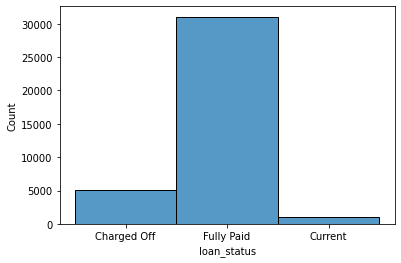

In [48]:
#Plotting histogram
sns.histplot(loan_data['loan_status'])
plt.show()

Segmenting the main data based on categorical variable <b>'loan status'</b> to better understand the data

In [49]:
# Seggregating the cleaned data into the Charged off & Fully Paid Categories for subsequent analysis

charged_off_data = loan_data[loan_data['loan_status']=='Charged Off']
fully_paid_data = loan_data[loan_data['loan_status']=='Fully Paid']

#### Understanding the distribution of Categorical columns for both Charged off applicants

Checking the distribution of Purpose for which the loan was taken for both the Charged off (defaultors) & Fully Paid Categories

Histogram of term


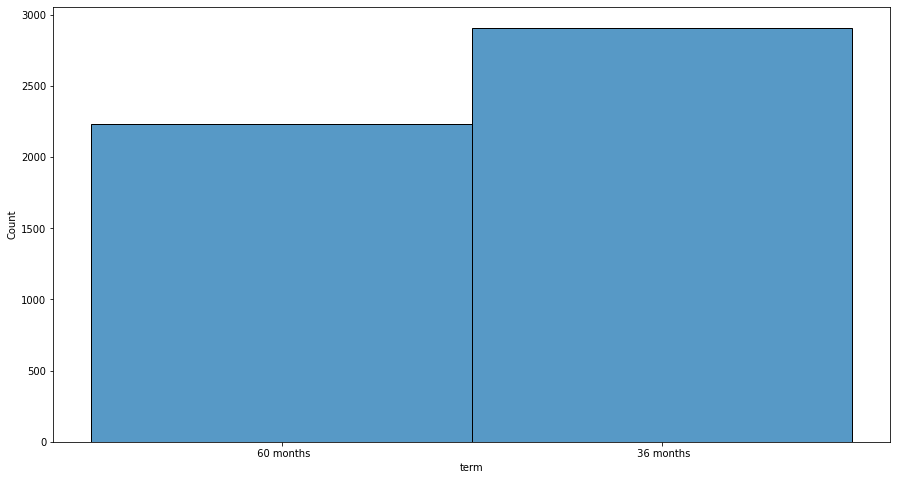

Histogram of grade


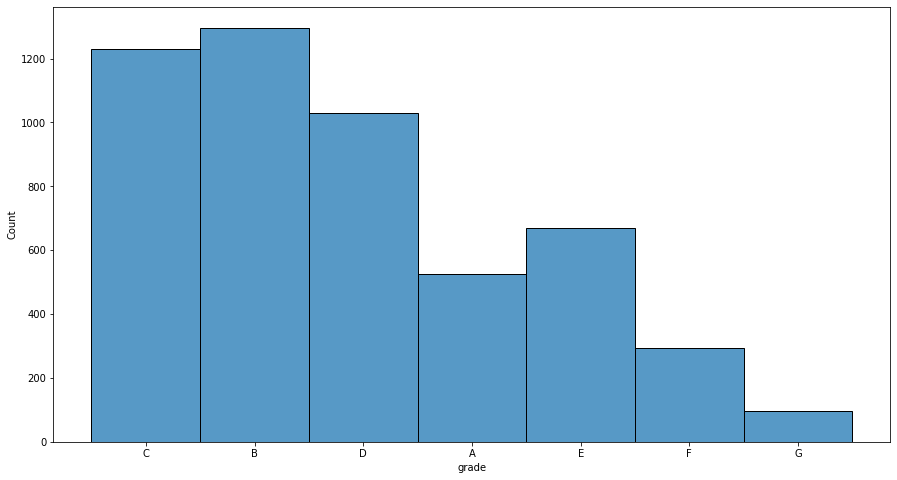

Histogram of sub_grade


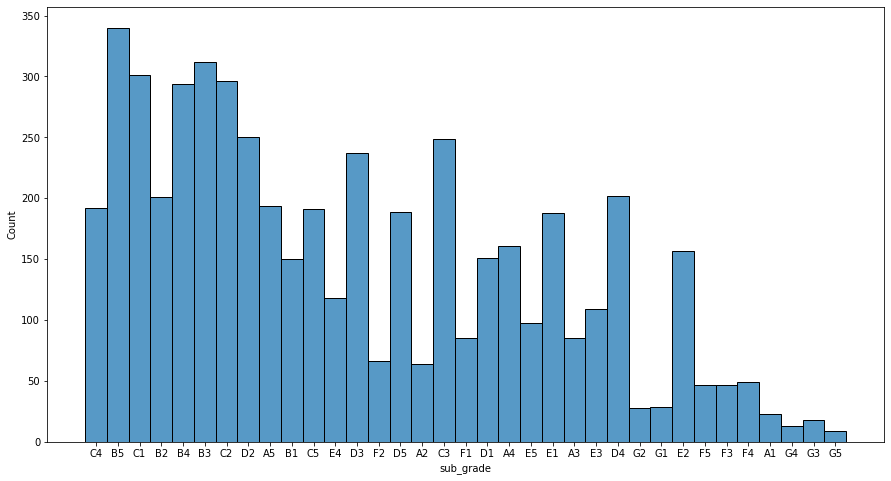

Histogram of emp_length


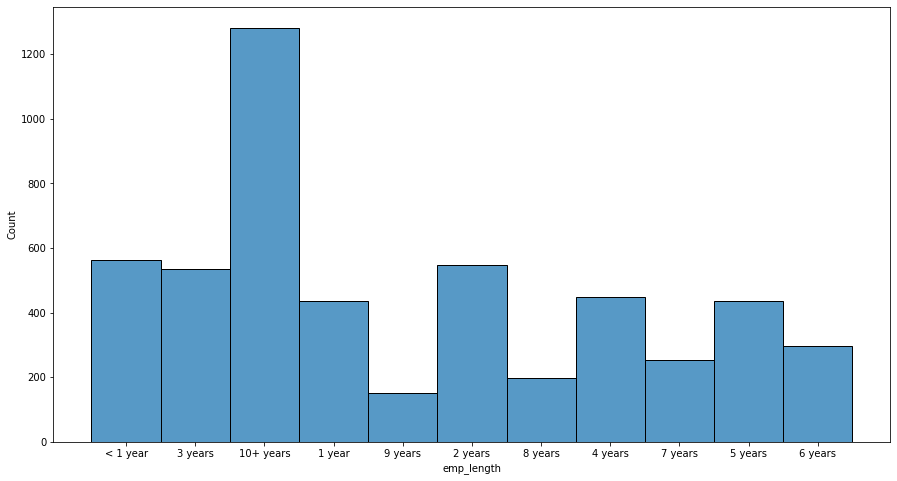

Histogram of home_ownership


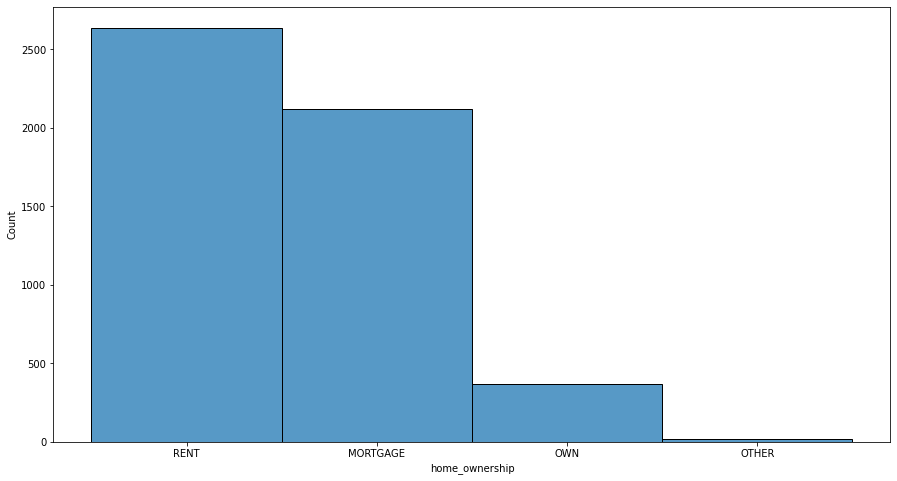

Histogram of verification_status


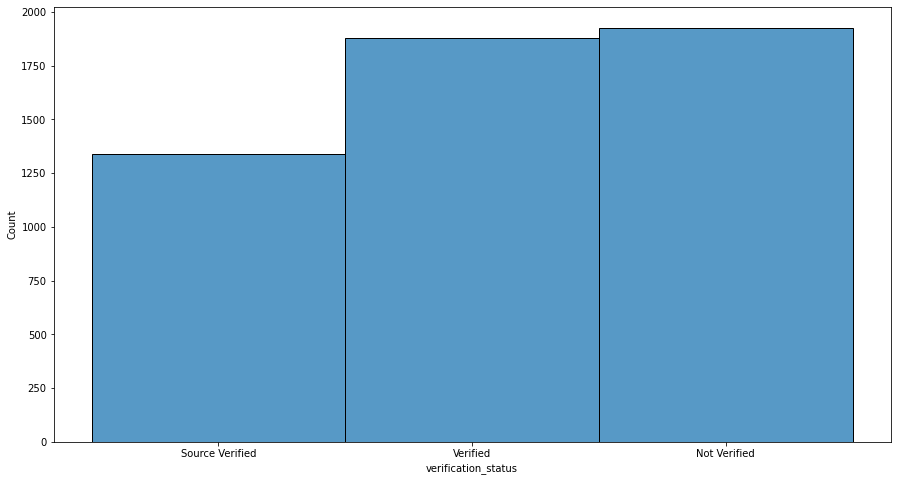

Histogram of addr_state


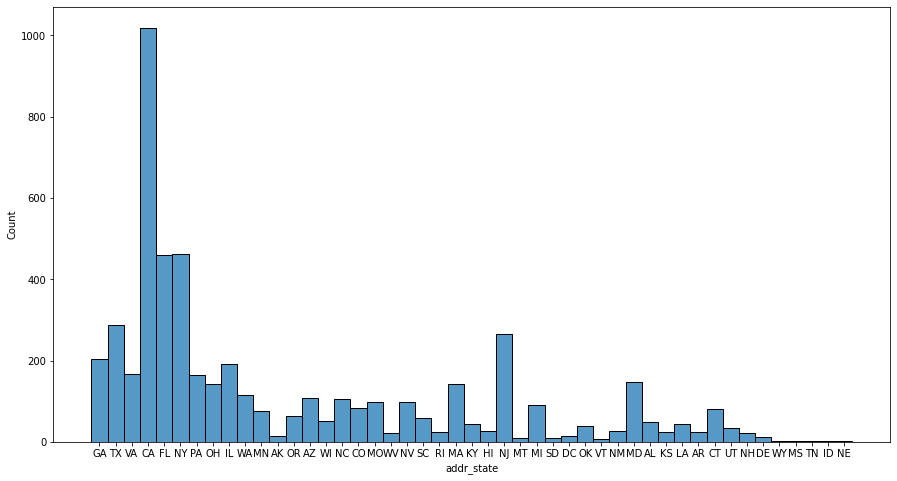

Histogram of pub_rec_bankruptcies


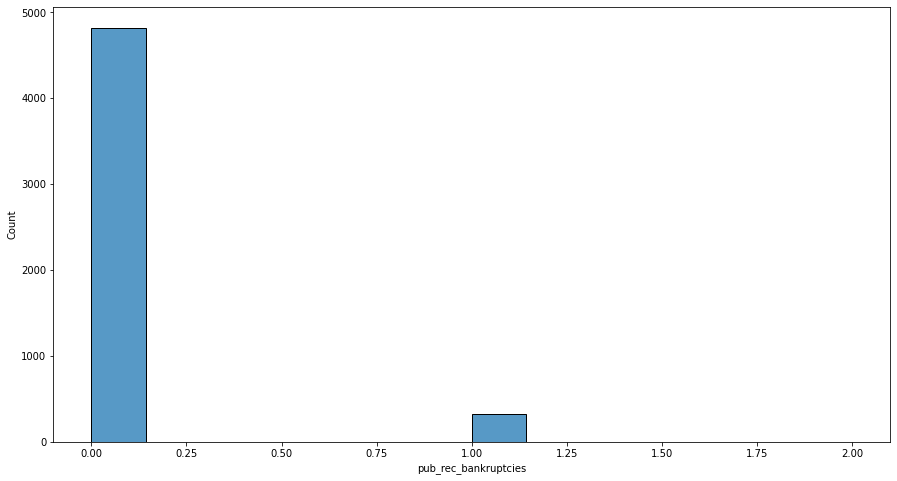

In [50]:
for i in catg_cols:
    print("Histogram of "+i)
    plt.figure(figsize = (15,8))
    sns.histplot(charged_off_data[i])
    plt.show()

#### Understanding the distribution of Categorical columns for Fully Paid Categories

Histogram of term


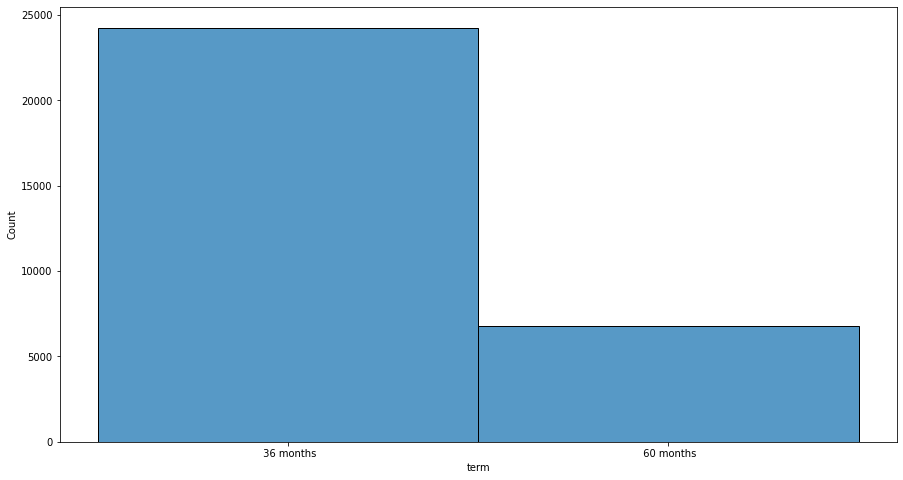

Histogram of grade


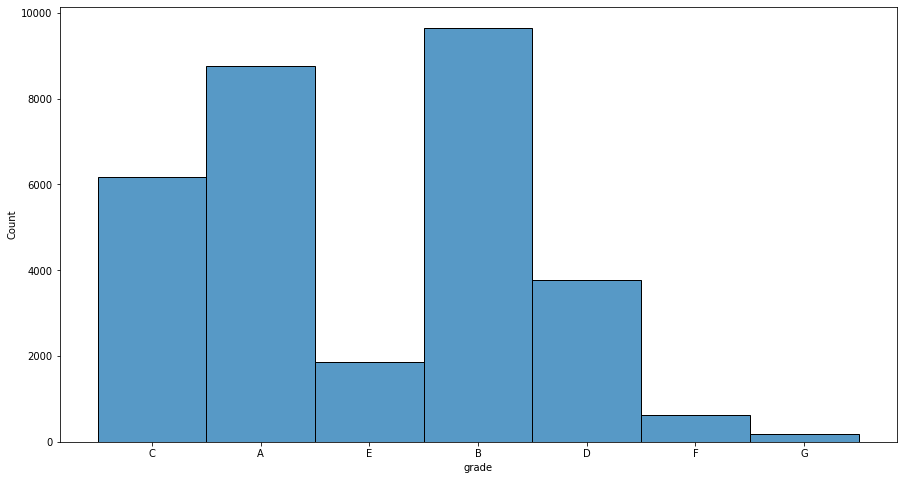

Histogram of sub_grade


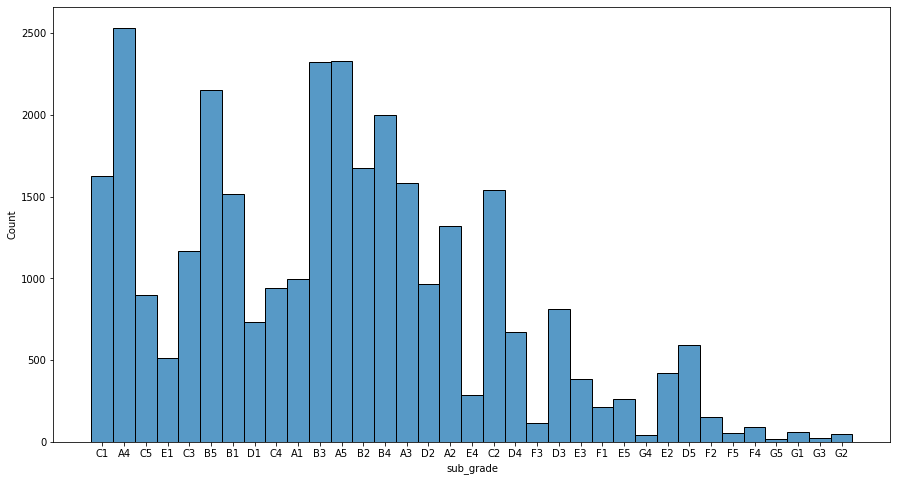

Histogram of emp_length


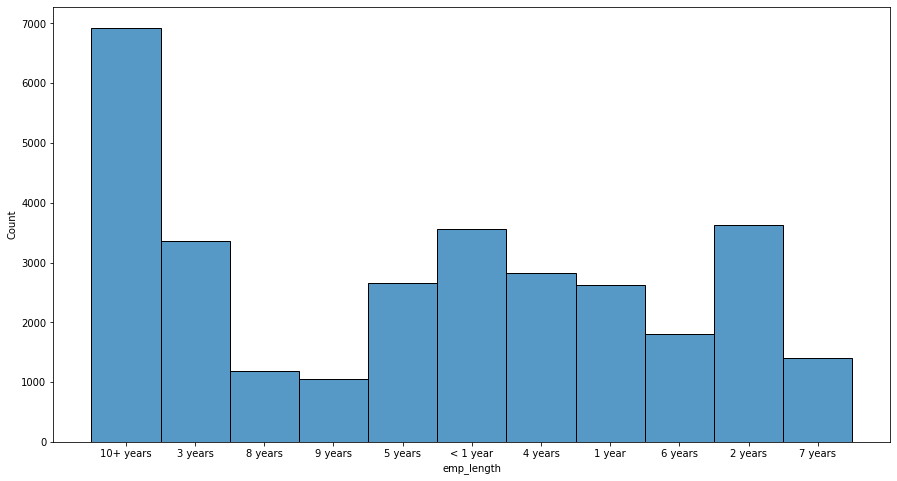

Histogram of home_ownership


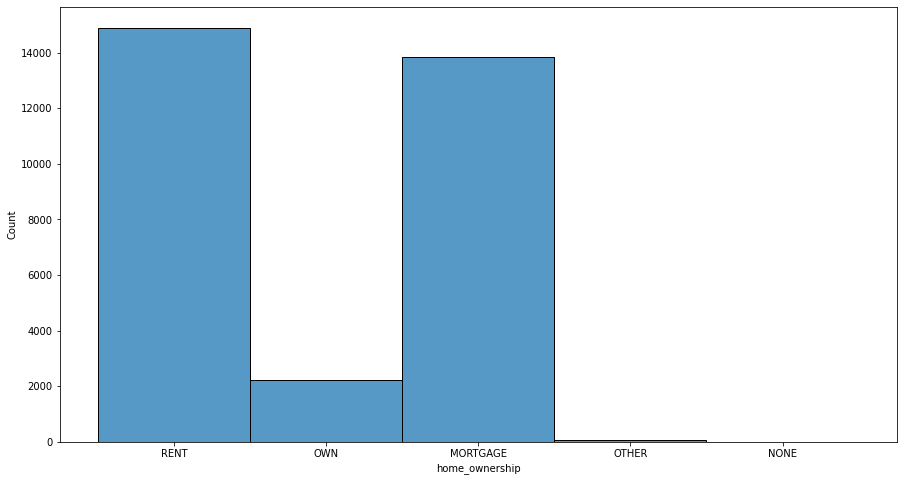

Histogram of verification_status


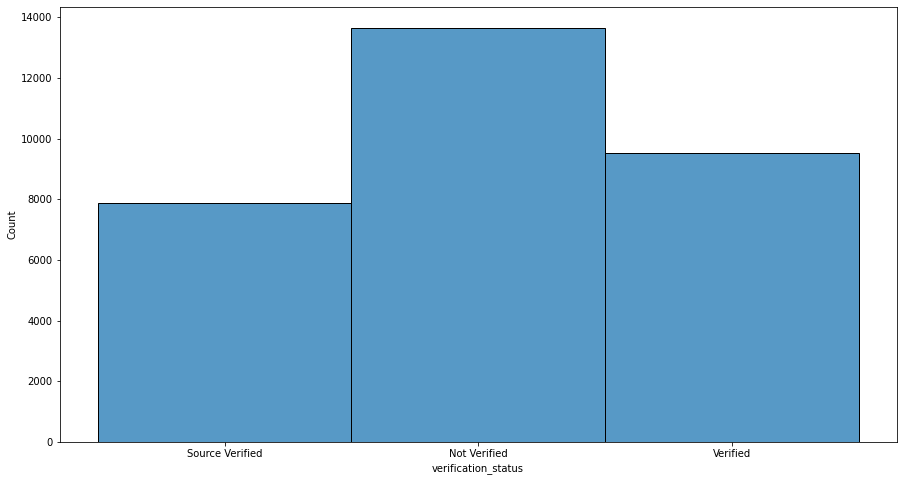

Histogram of addr_state


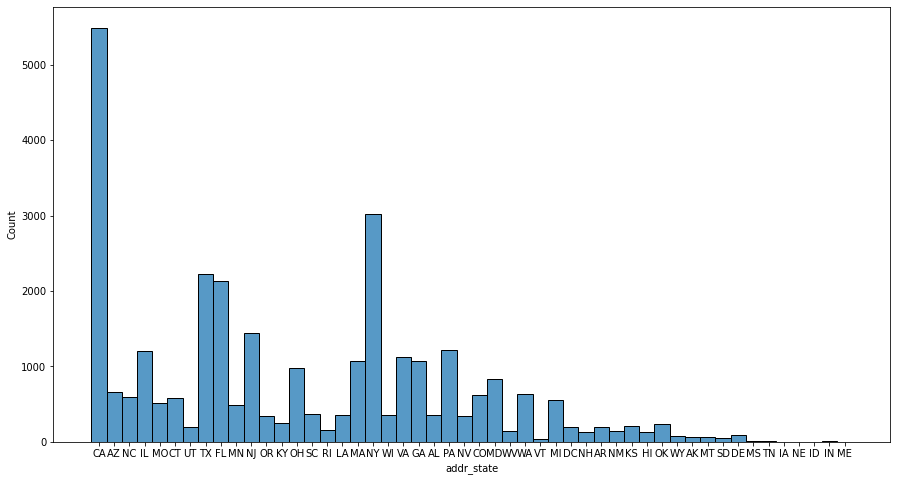

Histogram of pub_rec_bankruptcies


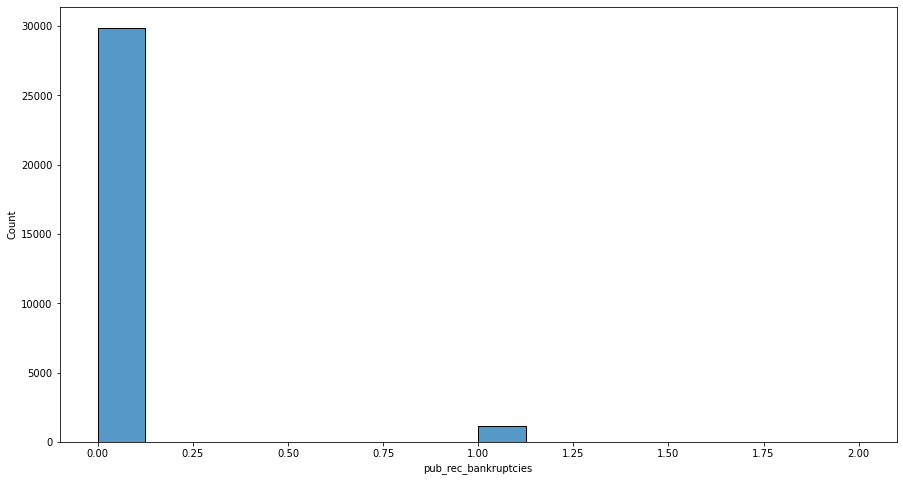

In [51]:
for i in catg_cols:
    print("Histogram of "+i)
    plt.figure(figsize = (15,8))
    sns.histplot(fully_paid_data[i])
    plt.show()

<b>Key Observations from above</b>

<b> For Charged off/ Defaultor Applicants:</b>

    1. The term of Loan is mostly 36 months
    2. The Grade of Loan taken by the applicants are majorly B, C & D
    3. Most of them had the employment history of 10+ years
    4. Majority of them live on Rent or have Mortgage
    5. The income verification status was not verified for most of them.
    
 <b> For Fully Paid Applicants:</b>
 
    1. The term of Loan is mostly 36 months
    2. The Grade of Loan taken by the applicants are majorly B, A & C
    3. Most of them had the employment history of 10+ years
    4. Majority of them live on Rent or have Mortgage
    5. The income verification status was not verified for most of them.

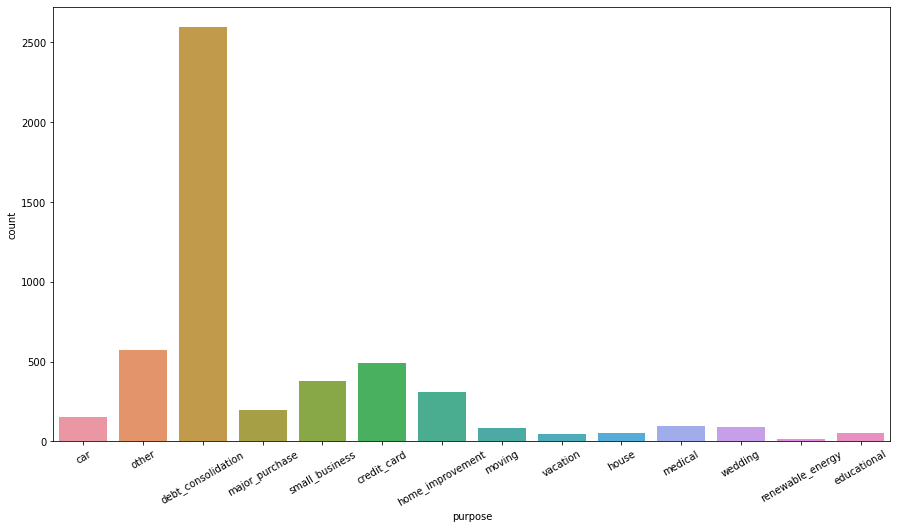

In [52]:
plt.figure(figsize = (15,8))
ax = sns.countplot(charged_off_data['purpose'])
ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
plt.show()

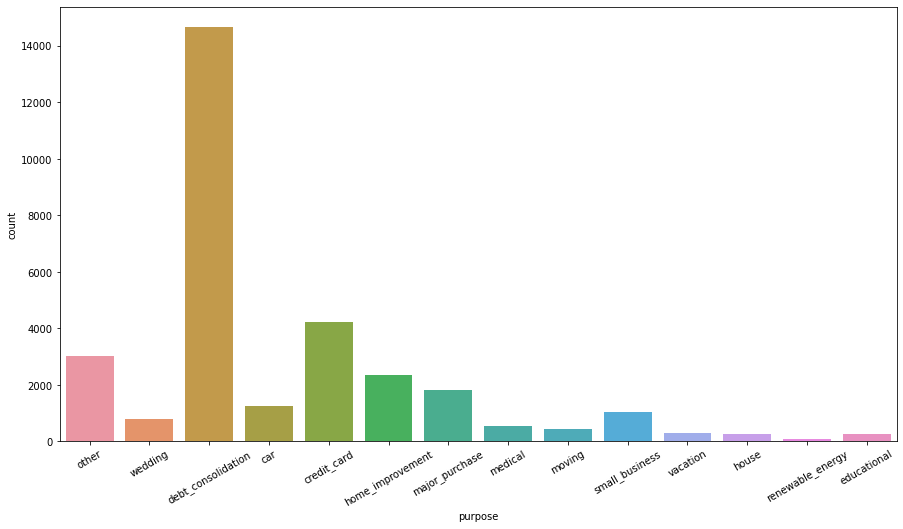

In [53]:
plt.figure(figsize = (15,8))
ax = sns.countplot(fully_paid_data['purpose'])
ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
plt.show()

<b> Outlier Detection and Removal</b>

Plotting box plots to identify if there are any outliers present in the continous columns of interest for the applicants that had defaulted. Accordingly, we will remove the outliers to avoid any incorrect results

Boxplot of loan_amnt


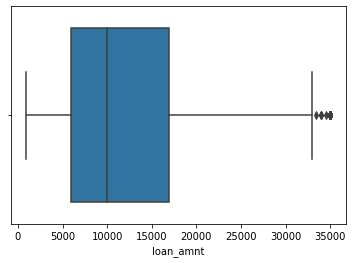

Boxplot of funded_amnt


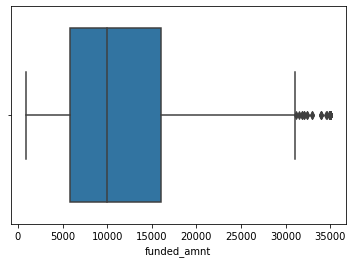

Boxplot of funded_amnt_inv


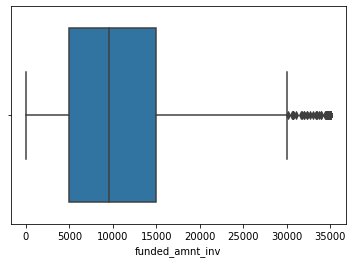

Boxplot of int_rate


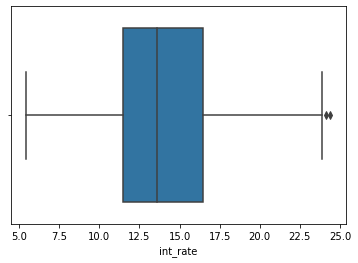

Boxplot of installment


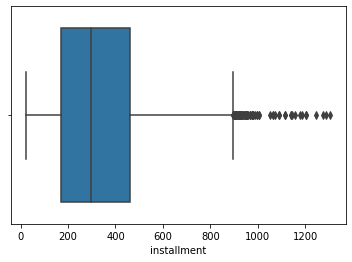

Boxplot of annual_inc


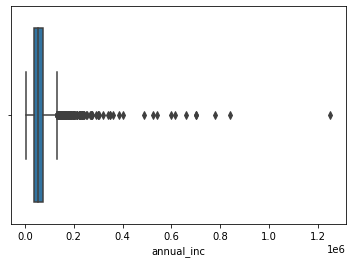

Boxplot of dti


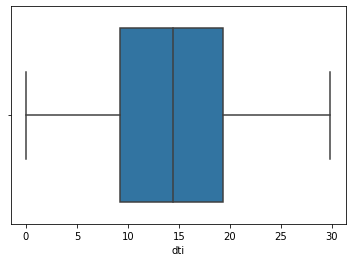

Boxplot of delinq_2yrs


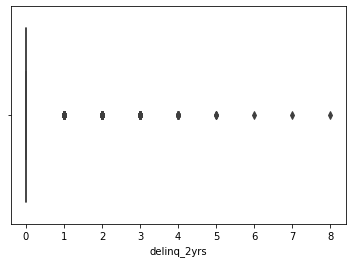

Boxplot of inq_last_6mths


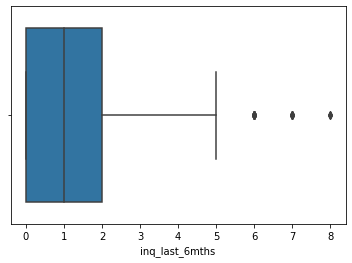

Boxplot of open_acc


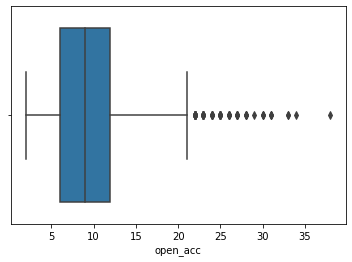

Boxplot of pub_rec


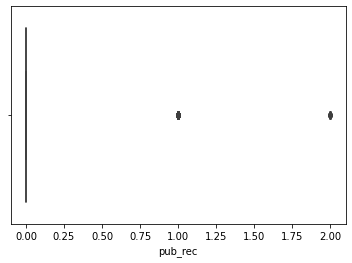

Boxplot of revol_bal


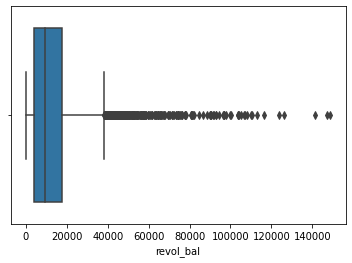

Boxplot of revol_util


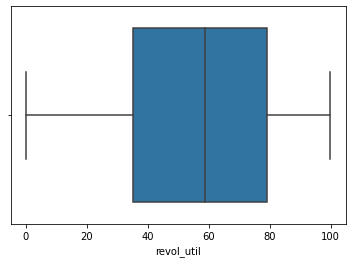

Boxplot of total_acc


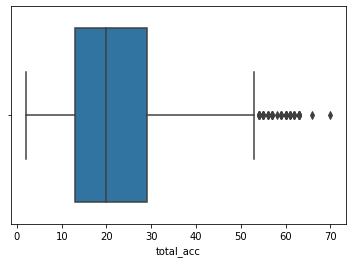

Boxplot of out_prncp


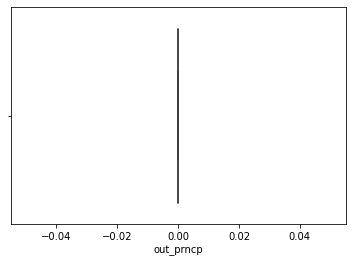

Boxplot of out_prncp_inv


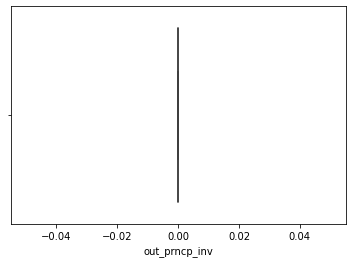

Boxplot of total_pymnt


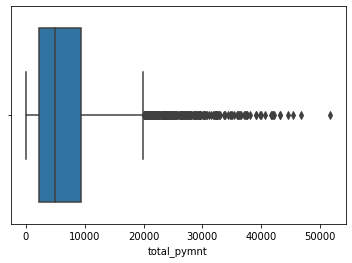

Boxplot of total_pymnt_inv


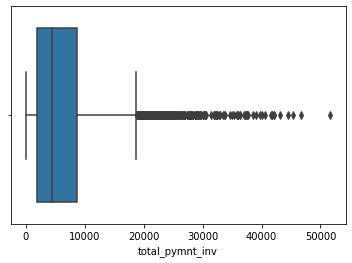

Boxplot of total_rec_prncp


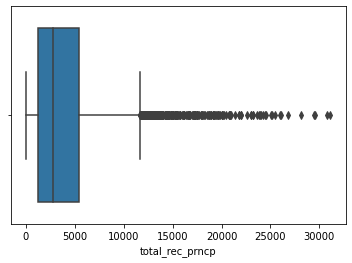

Boxplot of total_rec_int


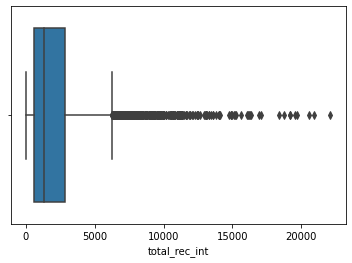

Boxplot of total_rec_late_fee


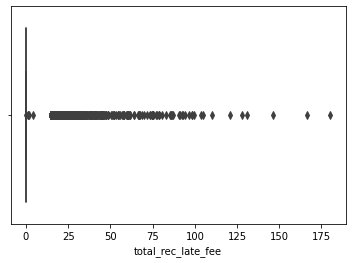

Boxplot of recoveries


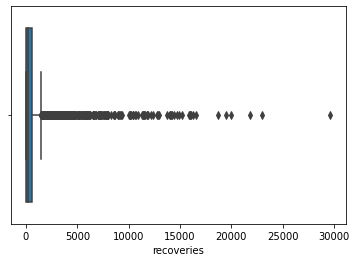

Boxplot of collection_recovery_fee


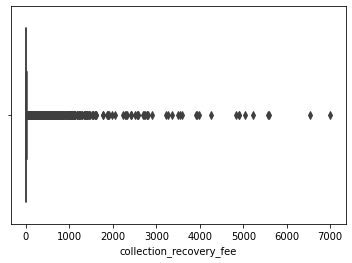

Boxplot of last_pymnt_amnt


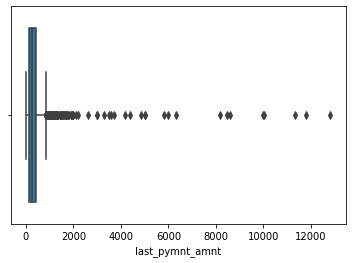

In [54]:
for i in contn_cols:
    print("Boxplot of "+i)
    sns.boxplot(charged_off_data[i])
    plt.show()

Boxplot of loan_amnt


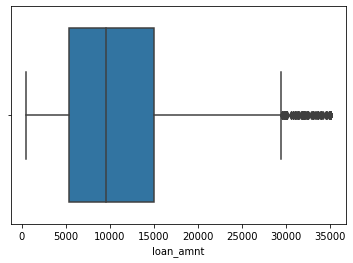

Boxplot of funded_amnt


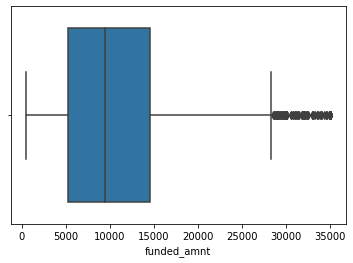

Boxplot of funded_amnt_inv


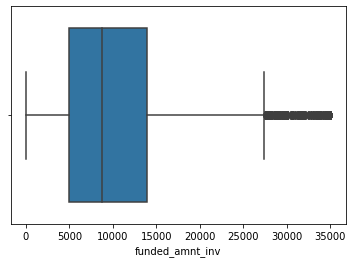

Boxplot of int_rate


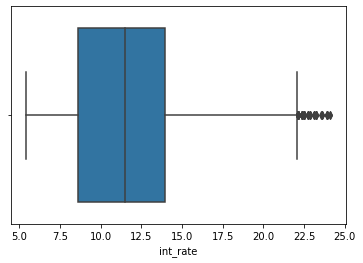

Boxplot of installment


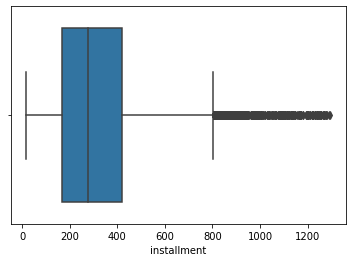

Boxplot of annual_inc


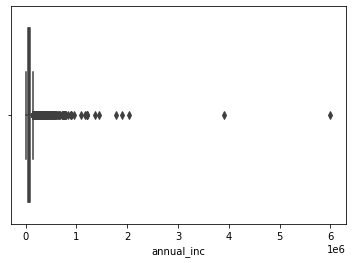

Boxplot of dti


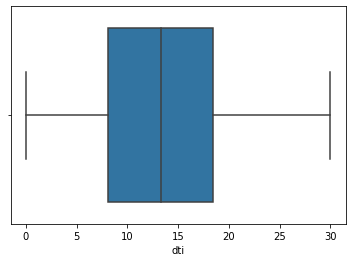

Boxplot of delinq_2yrs


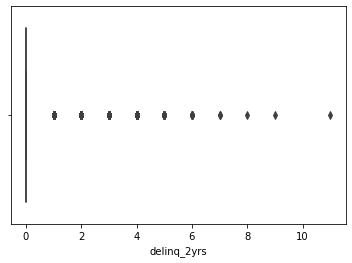

Boxplot of inq_last_6mths


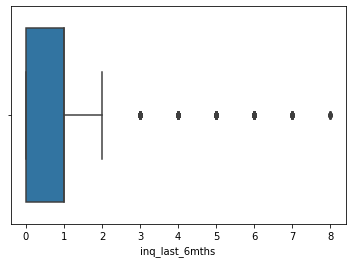

Boxplot of open_acc


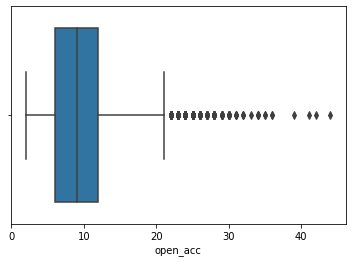

Boxplot of pub_rec


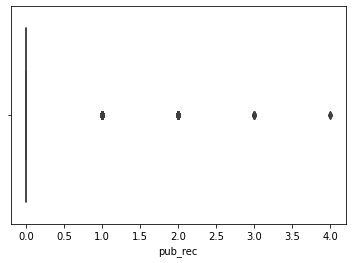

Boxplot of revol_bal


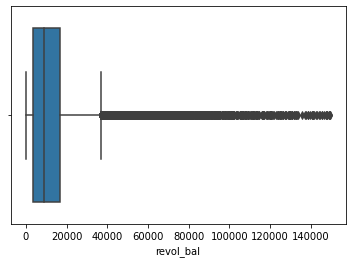

Boxplot of revol_util


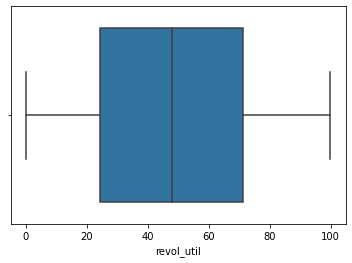

Boxplot of total_acc


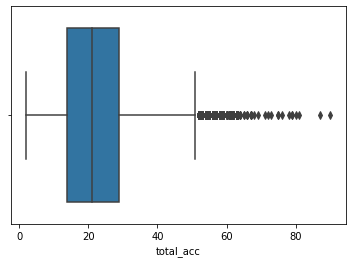

Boxplot of out_prncp


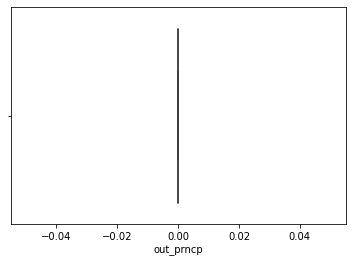

Boxplot of out_prncp_inv


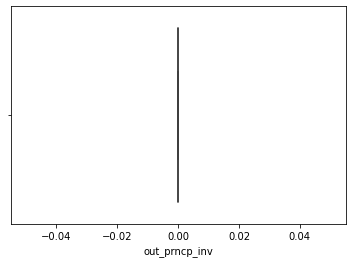

Boxplot of total_pymnt


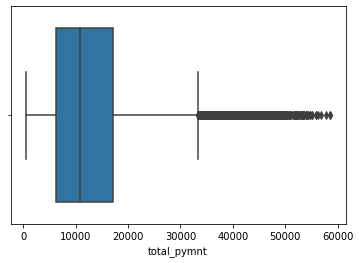

Boxplot of total_pymnt_inv


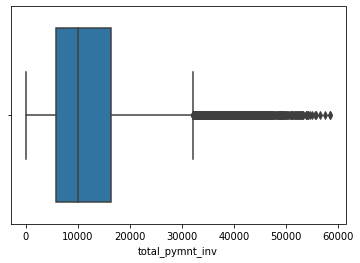

Boxplot of total_rec_prncp


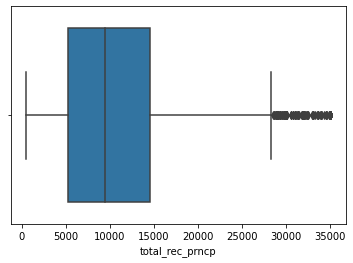

Boxplot of total_rec_int


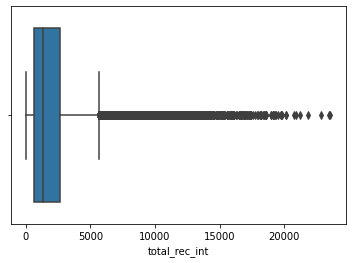

Boxplot of total_rec_late_fee


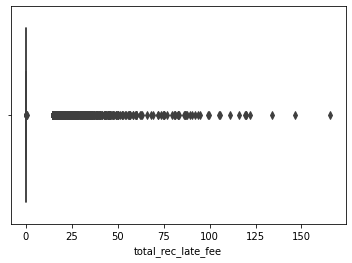

Boxplot of recoveries


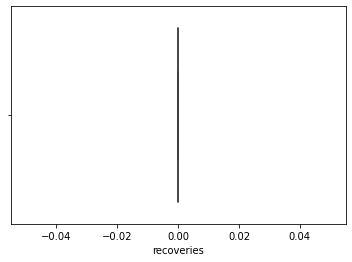

Boxplot of collection_recovery_fee


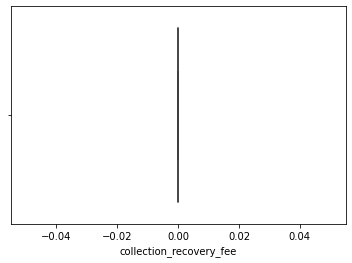

Boxplot of last_pymnt_amnt


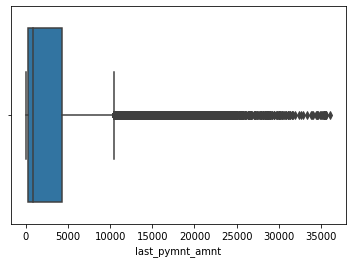

In [55]:
for i in contn_cols:
    print("Boxplot of "+i)
    sns.boxplot(fully_paid_data[i])
    plt.show()

### Key Observations from above:
<b>It was noticed that there were couple of outliers present for most of the continuous columns of interest. We will remove them in order to avoid any incorrect results in subsequent analysis</b>

In [56]:
charged_off_data.loc[:,contn_cols].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5143 entries, 1 to 39688
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   loan_amnt                5143 non-null   int64  
 1   funded_amnt              5143 non-null   int64  
 2   funded_amnt_inv          5143 non-null   float64
 3   int_rate                 5143 non-null   float64
 4   installment              5143 non-null   float64
 5   annual_inc               5143 non-null   float64
 6   dti                      5143 non-null   float64
 7   delinq_2yrs              5143 non-null   int64  
 8   inq_last_6mths           5143 non-null   int64  
 9   open_acc                 5143 non-null   int64  
 10  pub_rec                  5143 non-null   int64  
 11  revol_bal                5143 non-null   int64  
 12  revol_util               5143 non-null   float64
 13  total_acc                5143 non-null   int64  
 14  out_prncp              

In [57]:
#No of entries before outlier removal for charged off
charged_off_data.shape

(5143, 43)

In [58]:
#No of entries before outlier removal for Fully paid 
fully_paid_data.shape

(31048, 43)

In [59]:

def remove_outliers(df, col_list):
    for col in col_list:
        q1 = df[col].quantile(0.25) # getting the 25th quantile value
        q3 = df[col].quantile(0.75) #getting the 75th quantile value
        iqr=q3-q1 # calculating the inter quartile range
        fence_low  = q1-1.5*iqr #getting the lower whisker value
        fence_high = q3+1.5*iqr #getting the upper whisker values
        df_out = df.loc[(df[col] >=fence_low) & (df[col] <=fence_high)] # retaining the values that lie within the lower & upper whiskers
    return df_out
#passing the continuous columns list for outliers removal

charged_off_data = remove_outliers(charged_off_data, contn_cols)
fully_paid_data = remove_outliers(fully_paid_data, contn_cols)   

<b>Number of entries after removal of outliers </b>

In [60]:
charged_off_data.shape

(4926, 43)

In [61]:
fully_paid_data.shape

(28491, 43)

<b> Calculating a Derived Metric for monthly income for a better understanding</b>

In [62]:
charged_off_data['monthly_inc']=charged_off_data['annual_inc']/12
fully_paid_data['monthly_inc']=fully_paid_data['annual_inc']/12

In [63]:
contn_cols.append('monthly_inc')

<b>Checking the statistical info of the continuous variables in both of the Charged off & Fully Paid applicants and to understand differences between the measures of central tendencies and spread</b>

In [64]:
#checking for defaultors
charged_off_data[contn_cols].describe()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,...,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,monthly_inc
count,4926.000000,4926.000000,4926.000000,4926.000000,4926.000000,4.926000e+03,4926.000000,4926.000000,4926.000000,4926.000000,...,4926.0,4926.000000,4926.000000,4926.000000,4926.000000,4926.000000,4926.000000,4926.000000,4926.000000,4926.000000
mean,11688.180065,11333.338408,10495.242025,13.798128,322.173875,6.140542e+04,14.075361,0.168088,1.049939,9.236703,...,0.0,6551.755376,6119.583668,3808.666108,2104.012663,3.743652,635.332913,79.366512,269.969383,5117.118041
std,7590.568619,7230.383412,7169.551425,3.597864,197.235461,4.650906e+04,6.549812,0.539378,1.136002,4.520186,...,0.0,6153.256240,6065.223623,3703.585054,2373.388813,11.494736,1579.808644,341.317461,197.883014,3875.754931
min,900.000000,900.000000,0.000000,5.420000,22.790000,4.080000e+03,0.000000,0.000000,0.000000,2.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,340.000000
25%,5600.000000,5500.000000,5000.000000,11.360000,168.450000,3.780000e+04,9.242500,0.000000,0.000000,6.000000,...,0.0,2157.500000,1830.070000,1186.460000,551.730000,0.000000,8.882500,0.000000,107.542500,3150.000000
50%,10000.000000,10000.000000,9000.000000,13.550000,287.330000,5.280000e+04,14.350000,0.000000,1.000000,9.000000,...,0.0,4748.560000,4220.695000,2667.655000,1275.005000,0.000000,172.965000,2.501700,228.560000,4400.000000
75%,16000.000000,15343.750000,14975.000000,16.327500,434.462500,7.300000e+04,19.300000,0.000000,2.000000,12.000000,...,0.0,8884.542500,8308.085000,5155.497500,2703.952500,0.000000,570.460000,8.881275,384.127500,6083.333333
max,35000.000000,35000.000000,35000.000000,24.400000,1243.850000,1.250000e+06,29.850000,8.000000,8.000000,38.000000,...,0.0,44517.490000,44517.490000,31115.810000,20610.170000,180.200000,29623.350000,6543.040000,855.730000,104166.666667


In [65]:
#checking for fully paid applicants
fully_paid_data[contn_cols].describe()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,...,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,monthly_inc
count,28491.000000,28491.000000,28491.000000,28491.000000,28491.000000,2.849100e+04,28491.000000,28491.000000,28491.000000,28491.000000,...,28491.0,28491.000000,28491.000000,28491.000000,28491.000000,28491.000000,28491.0,28491.0,28491.000000,28491.000000
mean,9911.770384,9696.666491,9226.856624,11.418772,296.941447,6.769973e+04,13.187594,0.144818,0.829139,9.239935,...,0.0,11657.540589,11082.201417,9696.660761,1959.989661,0.890281,0.0,0.0,2057.748928,5641.644294
std,6310.683089,6090.657777,6044.949652,3.481437,188.357227,6.660330e+04,6.663761,0.493001,1.041711,4.361305,...,0.0,7840.893641,7757.158533,6090.652234,2130.886445,5.744581,0.0,0.0,2589.172193,5550.274898
min,500.000000,500.000000,0.000000,5.420000,16.080000,4.000000e+03,0.000000,0.000000,0.000000,2.000000,...,0.0,526.332241,0.000000,500.000000,6.220000,0.000000,0.0,0.0,0.000000,333.333333
25%,5000.000000,5000.000000,4939.294797,8.490000,160.480000,4.001400e+04,8.040000,0.000000,0.000000,6.000000,...,0.0,5933.780099,5556.125000,5000.000000,649.860000,0.000000,0.0,0.0,237.955000,3334.500000
50%,8500.000000,8400.000000,8000.000000,11.360000,257.920000,5.799600e+04,13.230000,0.000000,0.000000,9.000000,...,0.0,9878.440235,9303.820000,8400.000000,1257.310000,0.000000,0.0,0.0,678.760000,4833.000000
75%,13000.000000,12500.000000,12000.000000,13.800000,385.140000,8.000000e+04,18.450000,0.000000,1.000000,12.000000,...,0.0,15300.082970,14605.930000,12500.000000,2467.005000,0.000000,0.0,0.0,3182.900000,6666.666667
max,35000.000000,35000.000000,35000.000000,23.910000,1288.100000,6.000000e+06,29.990000,11.000000,8.000000,44.000000,...,0.0,58563.679930,58563.680000,35000.000000,23563.680000,165.690000,0.0,0.0,10417.980000,500000.000000


In [66]:
# Checking the median value for Total Credit Revolving balance
charged_off_data['revol_bal'].median()

9197.0

In [67]:
# Checking the median value for Total Credit Revolving balance
fully_paid_data['revol_bal'].median()

8358.0

### Key Observations from above

- We noticed that there is a good difference between the average monthly income of the applicants that were charged off and the ones that had fully paid the loan amount.


- The mean installment along with the mean intrest rate for charged off applicants is fairly higher as compared to the applicants that had fully paid the loan amount.

- Even the mean dti ratio value, which is the ratio of calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income, is fairly high for the charged off applicants as compared to the applicants that had fully paid the loan amount. This can also be one of the reasons why the applicants would have found it difficult to pay off their loans.

- The median value for Total Credit Revolving balance is fairly high for applicants that had charged off as compared to the applicants that didn't defaulted.

## Bivariate Analysis

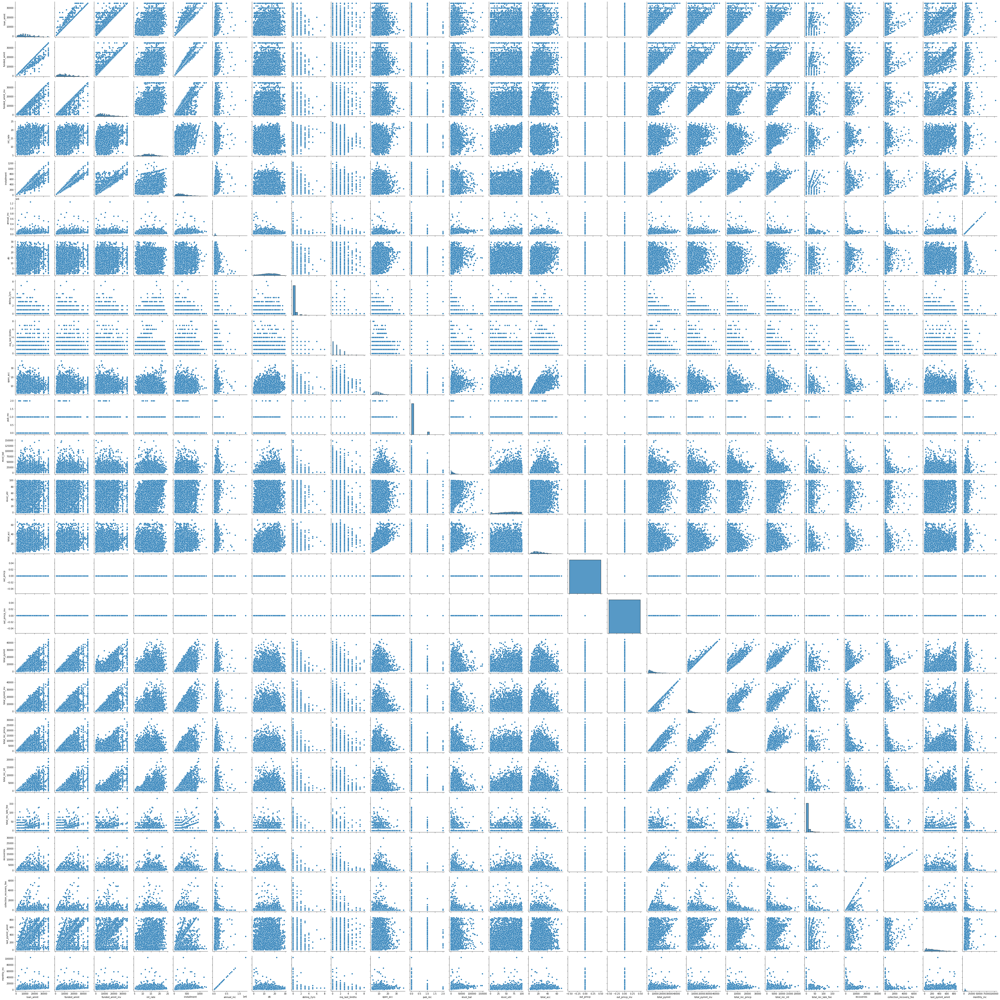

In [68]:
#plotting a pair plot to understand the correlation between continuous variables of interest
sns.pairplot(charged_off_data[contn_cols])

<AxesSubplot:>

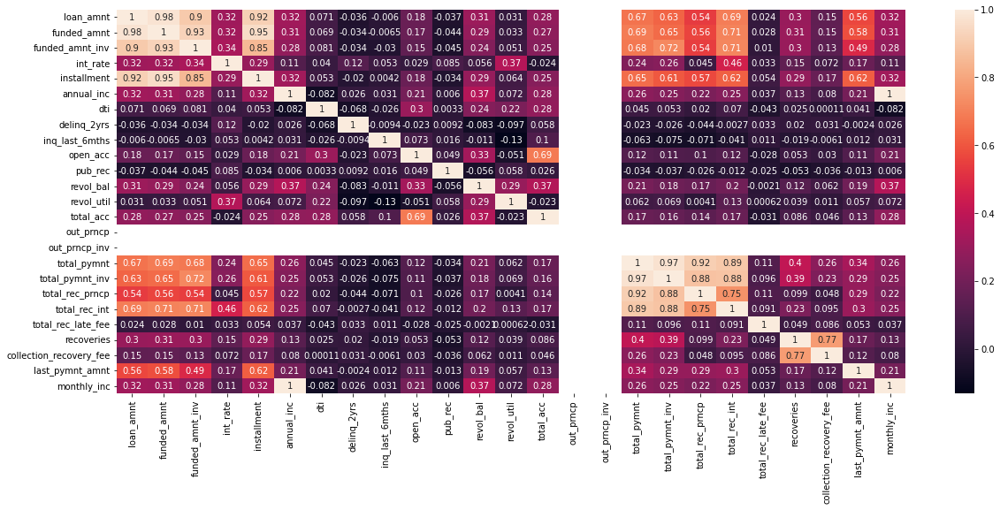

In [69]:
#plotting a heatmap to estimate the correlation coefficient between continuous variables of Charged off applicants
plt.figure(figsize=(20,8))
sns.heatmap(charged_off_data[contn_cols].corr(),annot=True)

<AxesSubplot:>

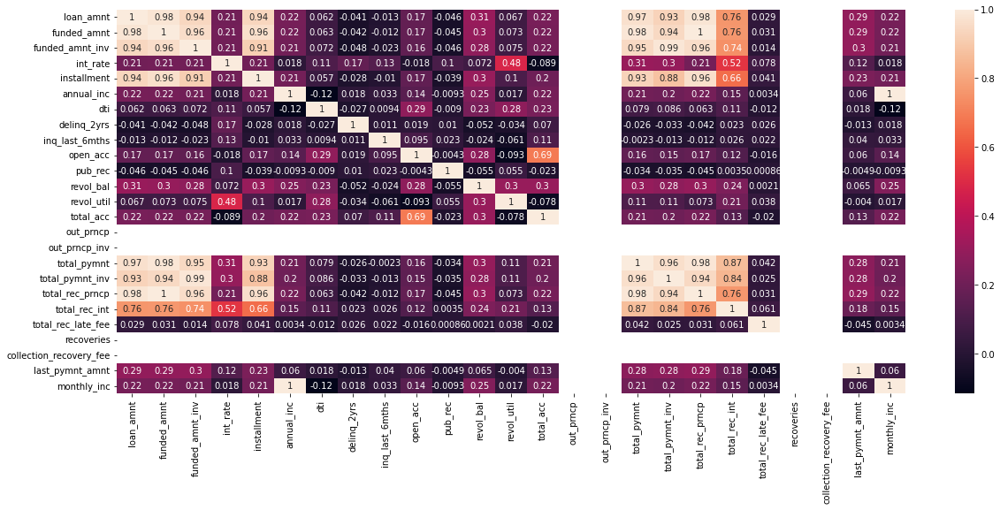

In [70]:
#plotting a heatmap to estimate the correlation coefficient between continuous variables of Charged off applicants
plt.figure(figsize=(20,8))
sns.heatmap(fully_paid_data[contn_cols].corr(),annot=True)

### Key Observations from above

1. Strong positive correlation is observed between the loan amount parameter and the funded amnt & funded amnt inv paramters.


2. Strong positive correlation is observed between total recurring principle which represnts the principal recieved to date and the funded & loan amount.


3. A weak negative correlation is observed between annual income and the dti ratio.

Boxplot of term & loan_amnt


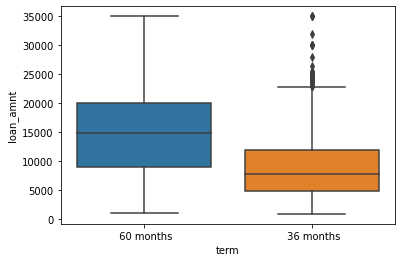

Boxplot of term & funded_amnt


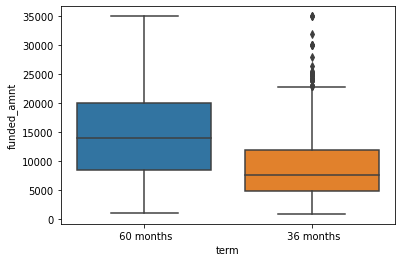

Boxplot of term & funded_amnt_inv


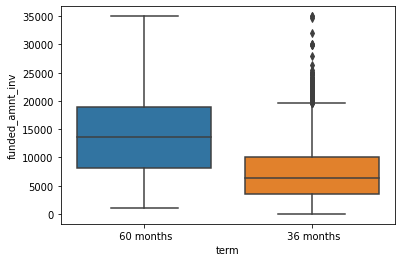

Boxplot of term & int_rate


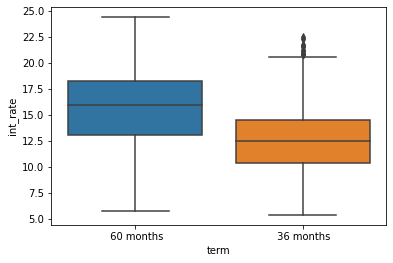

Boxplot of term & installment


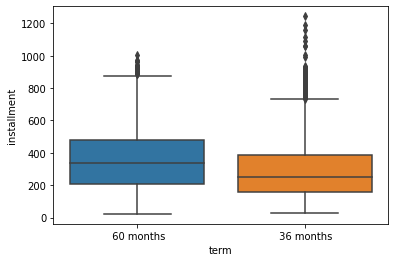

Boxplot of term & annual_inc


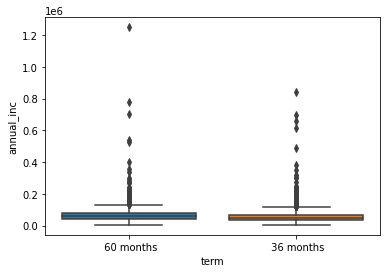

Boxplot of term & dti


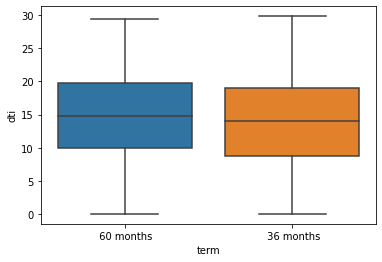

Boxplot of term & delinq_2yrs


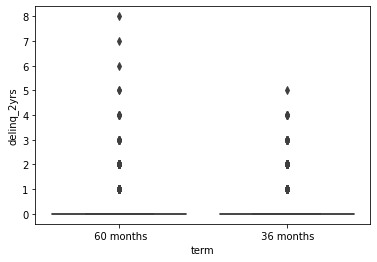

Boxplot of term & inq_last_6mths


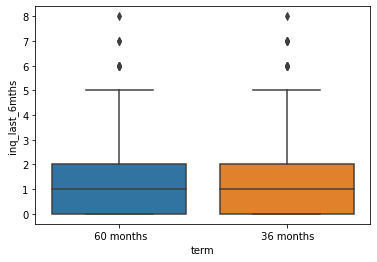

Boxplot of term & open_acc


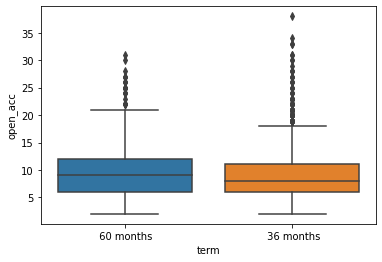

Boxplot of term & pub_rec


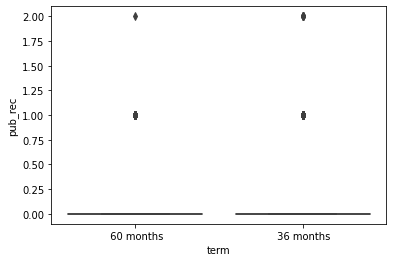

Boxplot of term & revol_bal


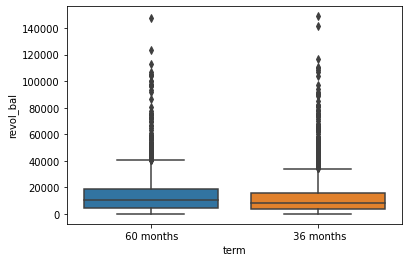

Boxplot of term & revol_util


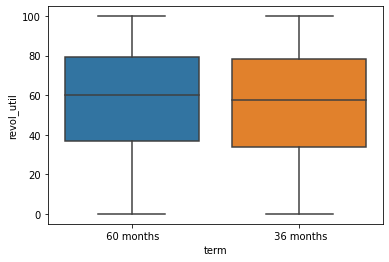

Boxplot of term & total_acc


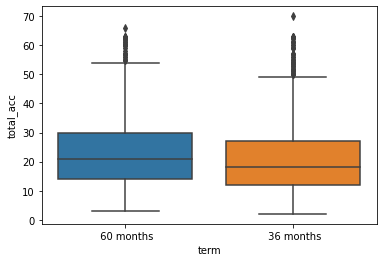

Boxplot of term & out_prncp


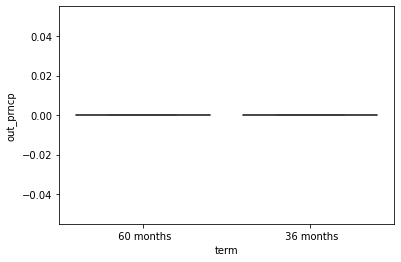

Boxplot of term & out_prncp_inv


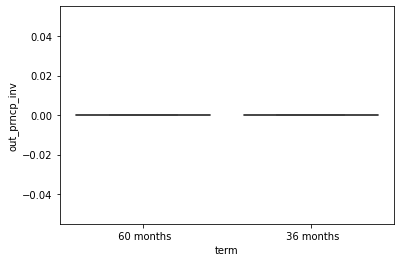

Boxplot of term & total_pymnt


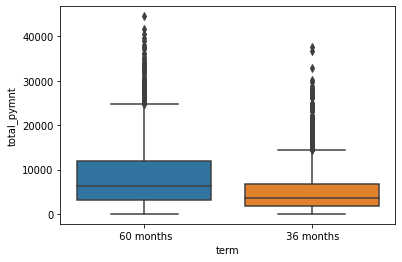

Boxplot of term & total_pymnt_inv


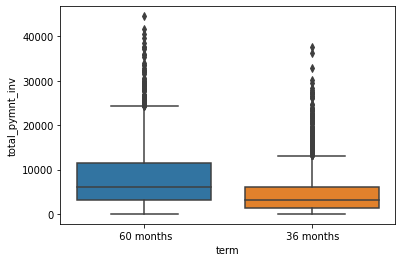

Boxplot of term & total_rec_prncp


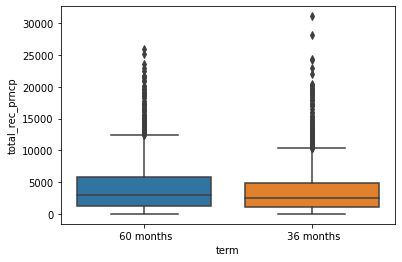

Boxplot of term & total_rec_int


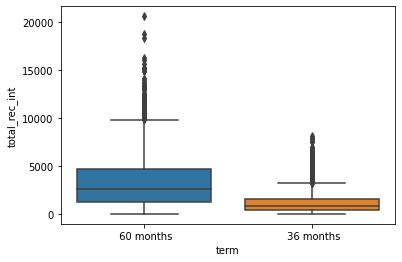

Boxplot of term & total_rec_late_fee


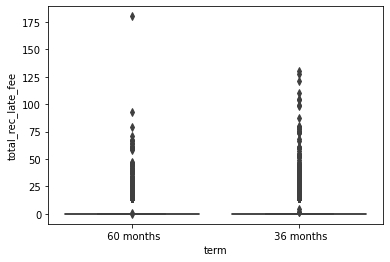

Boxplot of term & recoveries


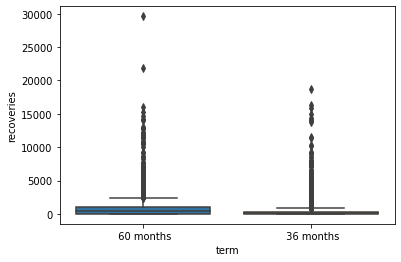

Boxplot of term & collection_recovery_fee


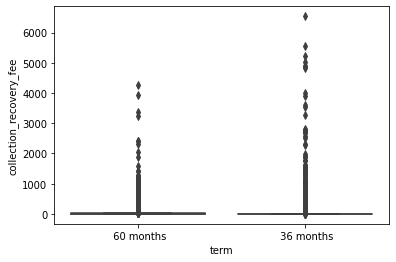

Boxplot of term & last_pymnt_amnt


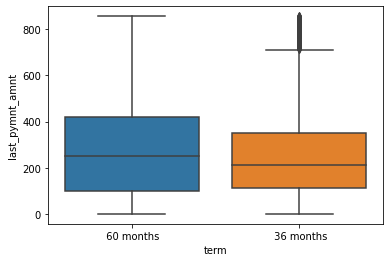

Boxplot of term & monthly_inc


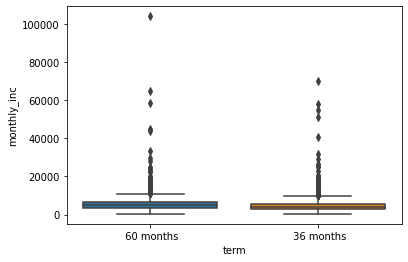

Boxplot of grade & loan_amnt


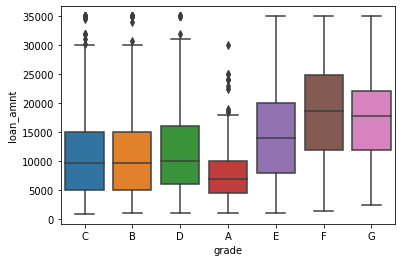

Boxplot of grade & funded_amnt


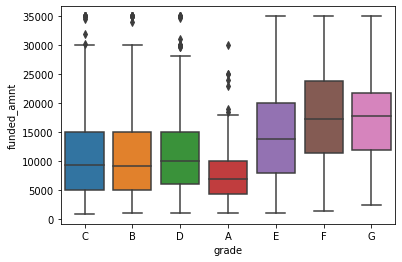

Boxplot of grade & funded_amnt_inv


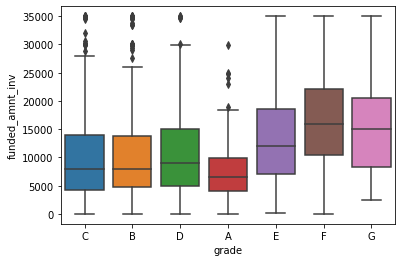

Boxplot of grade & int_rate


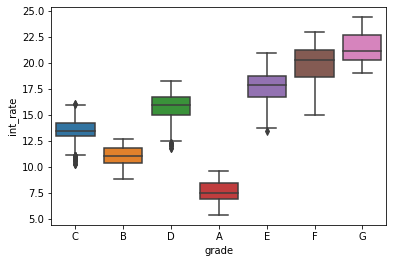

Boxplot of grade & installment


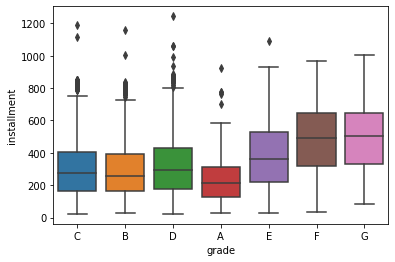

Boxplot of grade & annual_inc


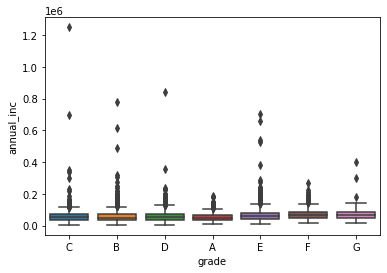

Boxplot of grade & dti


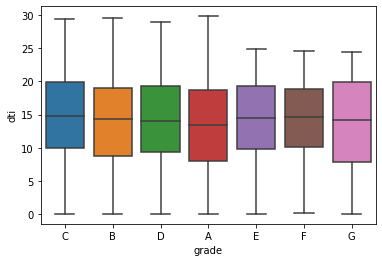

Boxplot of grade & delinq_2yrs


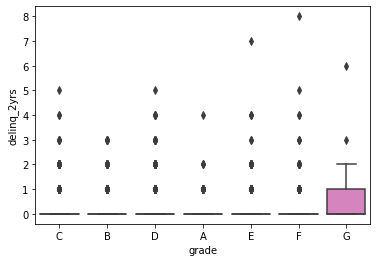

Boxplot of grade & inq_last_6mths


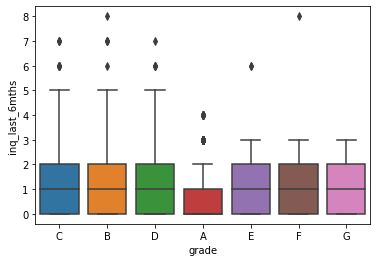

Boxplot of grade & open_acc


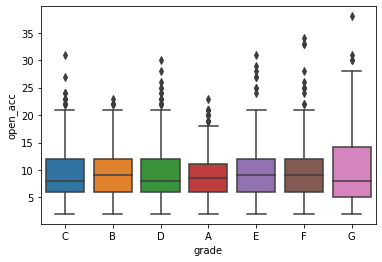

Boxplot of grade & pub_rec


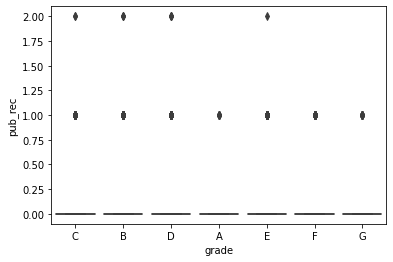

Boxplot of grade & revol_bal


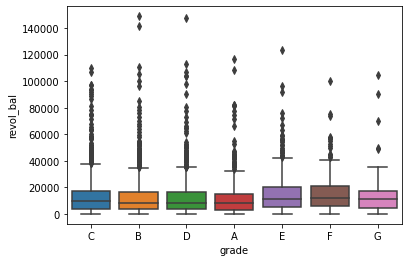

Boxplot of grade & revol_util


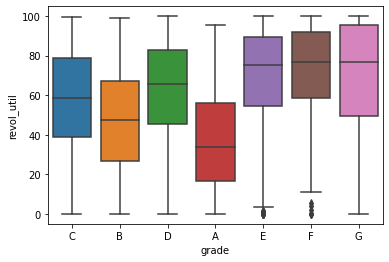

Boxplot of grade & total_acc


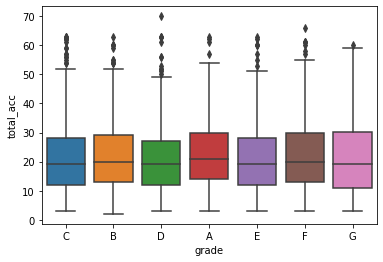

Boxplot of grade & out_prncp


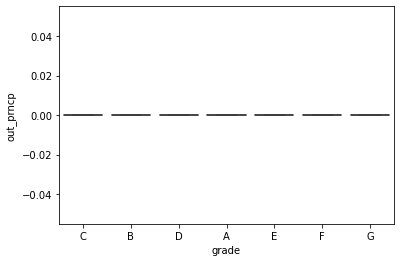

Boxplot of grade & out_prncp_inv


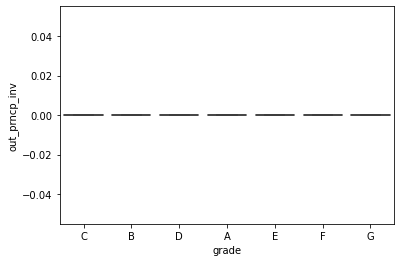

Boxplot of grade & total_pymnt


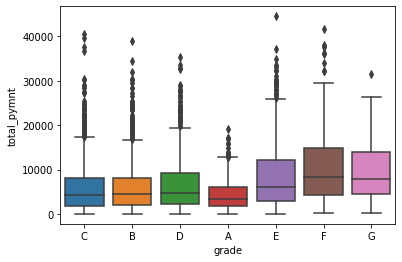

Boxplot of grade & total_pymnt_inv


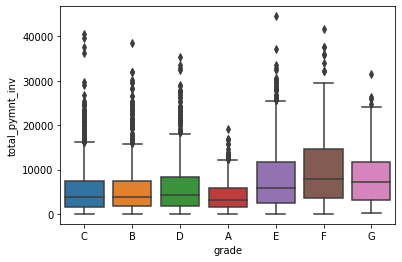

Boxplot of grade & total_rec_prncp


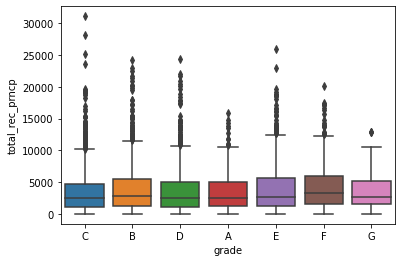

Boxplot of grade & total_rec_int


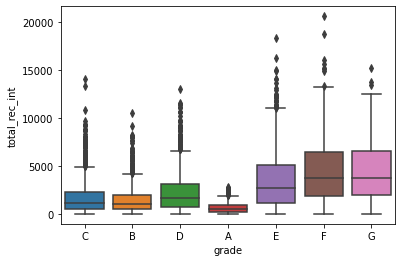

Boxplot of grade & total_rec_late_fee


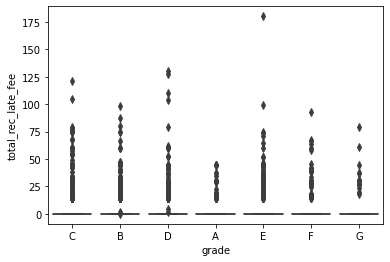

Boxplot of grade & recoveries


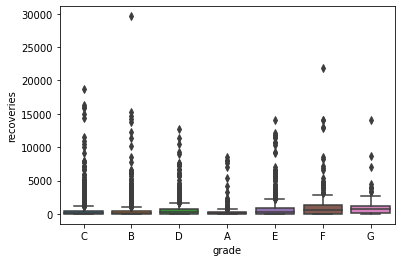

Boxplot of grade & collection_recovery_fee


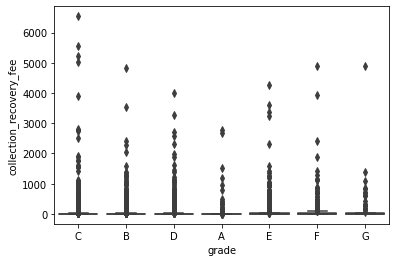

Boxplot of grade & last_pymnt_amnt


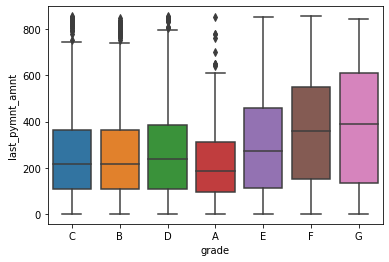

Boxplot of grade & monthly_inc


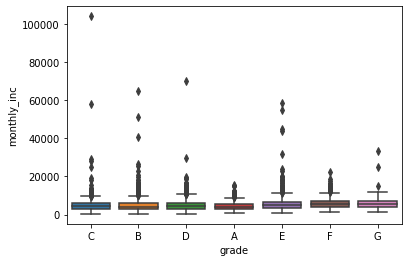

Boxplot of sub_grade & loan_amnt


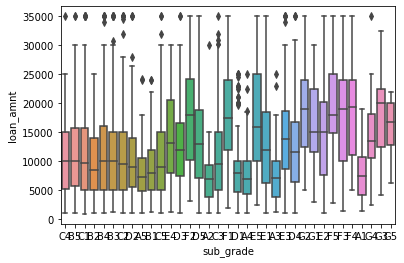

Boxplot of sub_grade & funded_amnt


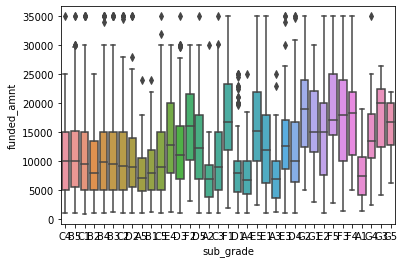

Boxplot of sub_grade & funded_amnt_inv


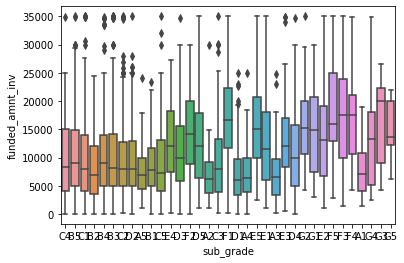

Boxplot of sub_grade & int_rate


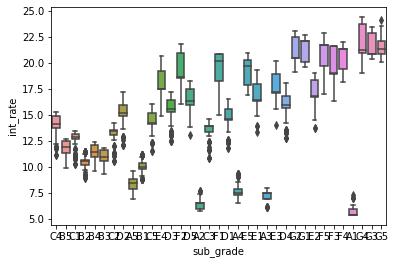

Boxplot of sub_grade & installment


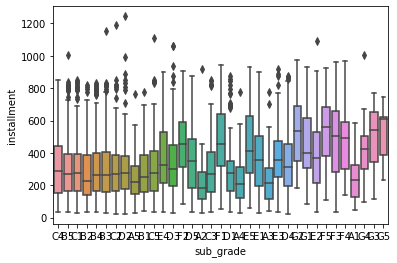

Boxplot of sub_grade & annual_inc


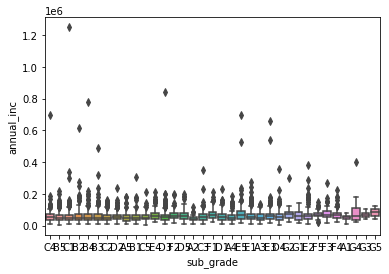

Boxplot of sub_grade & dti


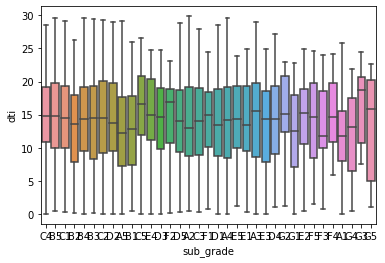

Boxplot of sub_grade & delinq_2yrs


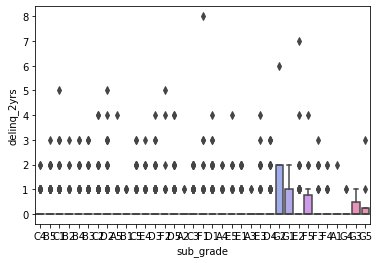

Boxplot of sub_grade & inq_last_6mths


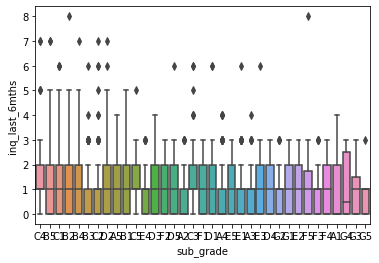

Boxplot of sub_grade & open_acc


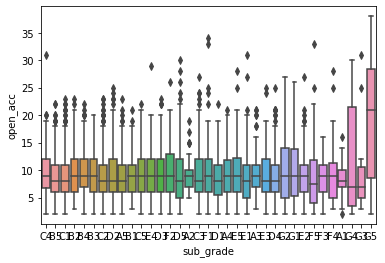

Boxplot of sub_grade & pub_rec


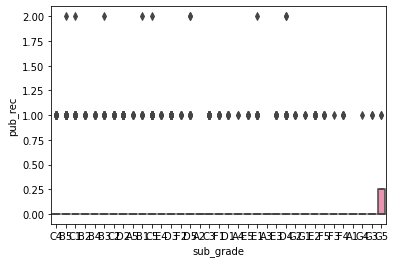

Boxplot of sub_grade & revol_bal


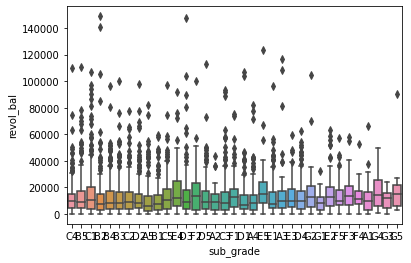

Boxplot of sub_grade & revol_util


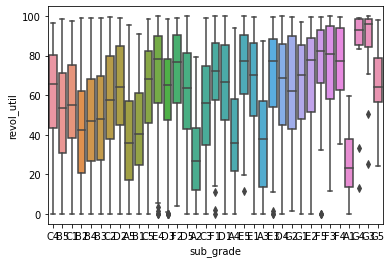

Boxplot of sub_grade & total_acc


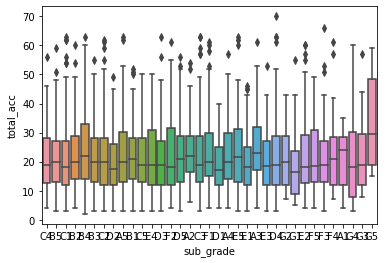

Boxplot of sub_grade & out_prncp


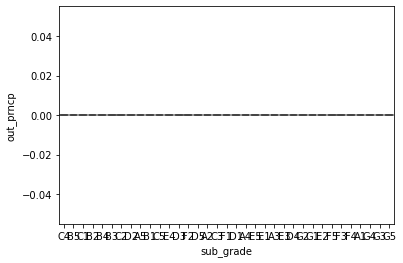

Boxplot of sub_grade & out_prncp_inv


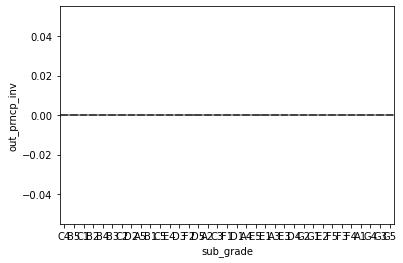

Boxplot of sub_grade & total_pymnt


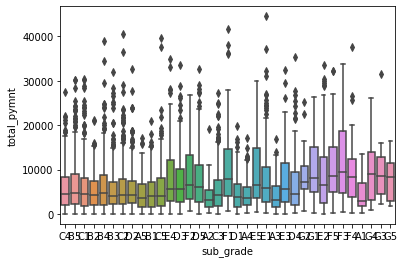

Boxplot of sub_grade & total_pymnt_inv


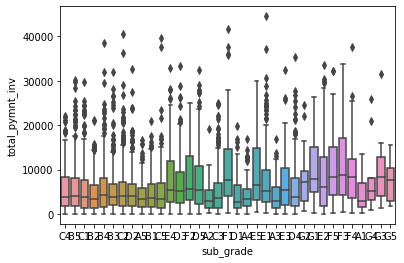

Boxplot of sub_grade & total_rec_prncp


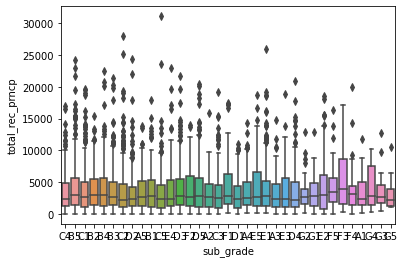

Boxplot of sub_grade & total_rec_int


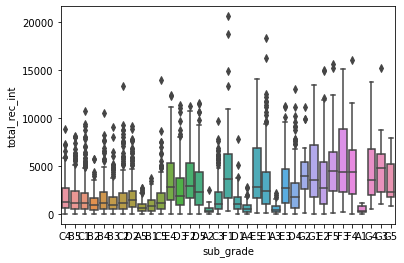

Boxplot of sub_grade & total_rec_late_fee


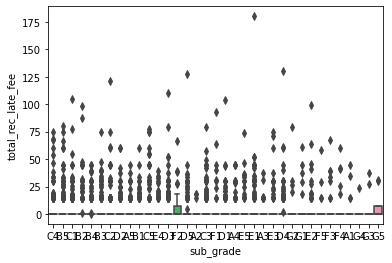

Boxplot of sub_grade & recoveries


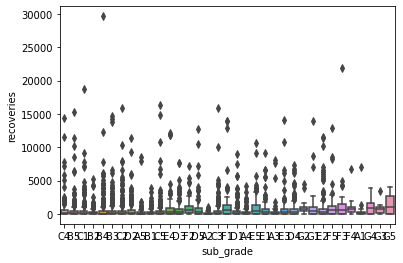

Boxplot of sub_grade & collection_recovery_fee


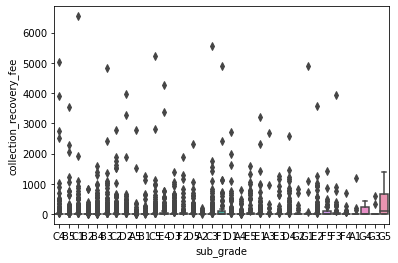

Boxplot of sub_grade & last_pymnt_amnt


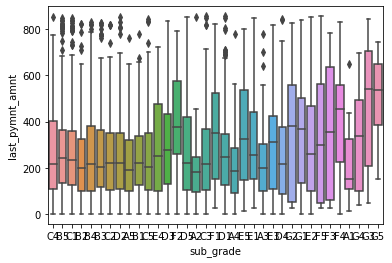

Boxplot of sub_grade & monthly_inc


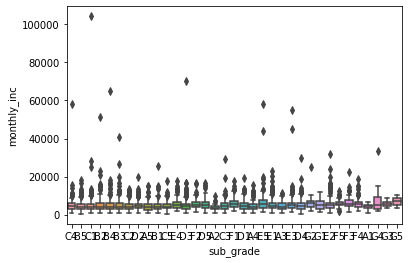

Boxplot of emp_length & loan_amnt


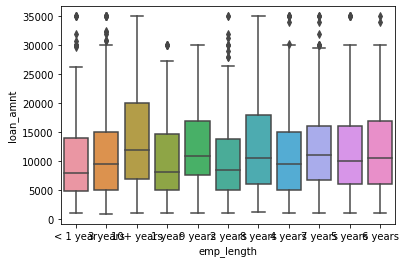

Boxplot of emp_length & funded_amnt


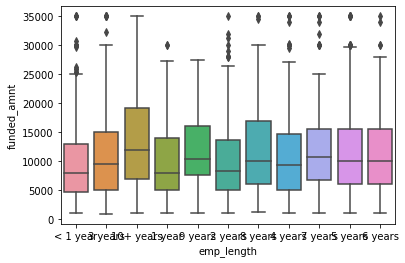

Boxplot of emp_length & funded_amnt_inv


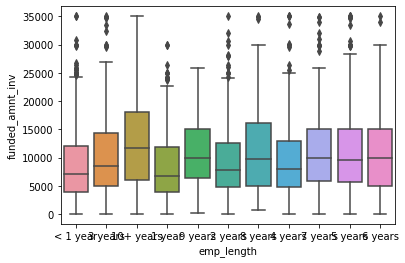

Boxplot of emp_length & int_rate


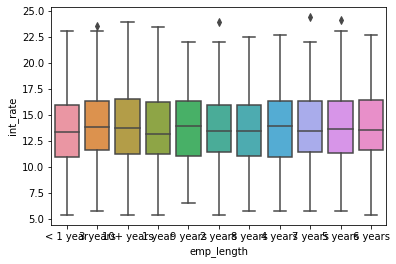

Boxplot of emp_length & installment


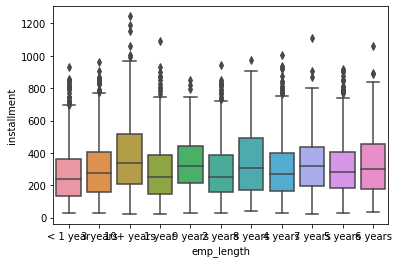

Boxplot of emp_length & annual_inc


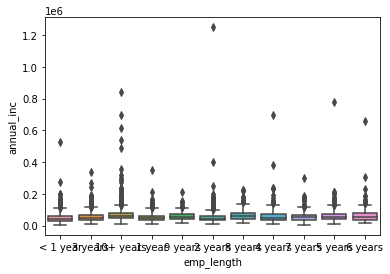

Boxplot of emp_length & dti


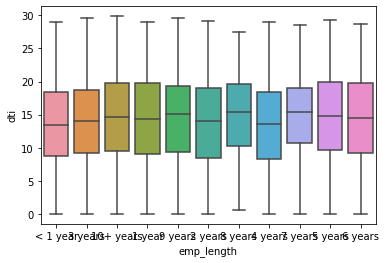

Boxplot of emp_length & delinq_2yrs


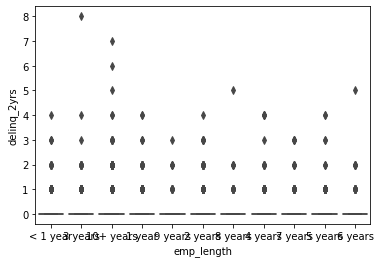

Boxplot of emp_length & inq_last_6mths


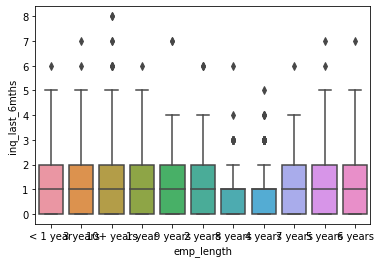

Boxplot of emp_length & open_acc


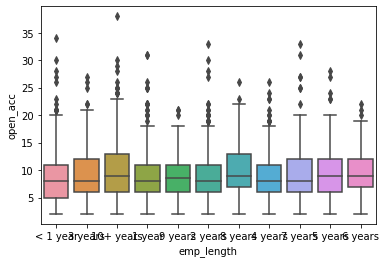

Boxplot of emp_length & pub_rec


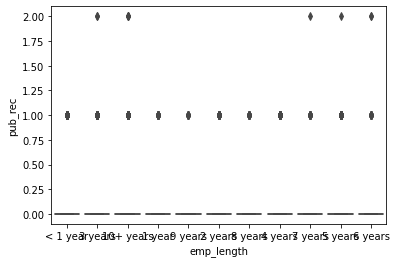

Boxplot of emp_length & revol_bal


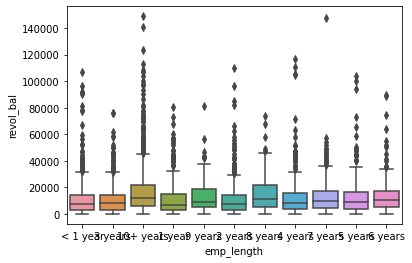

Boxplot of emp_length & revol_util


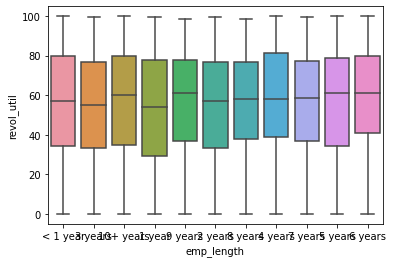

Boxplot of emp_length & total_acc


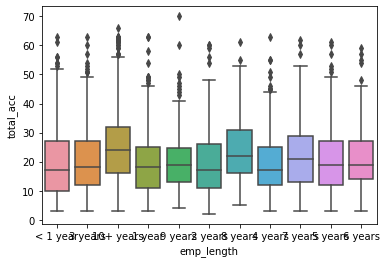

Boxplot of emp_length & out_prncp


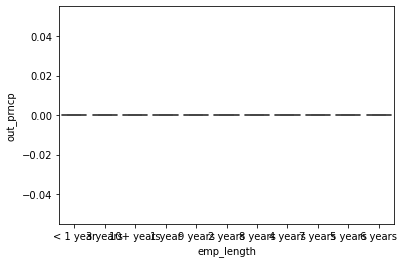

Boxplot of emp_length & out_prncp_inv


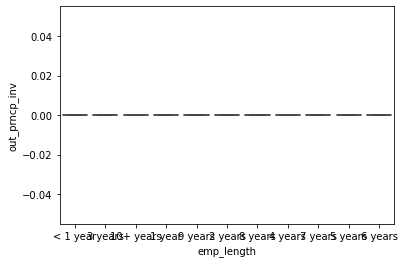

Boxplot of emp_length & total_pymnt


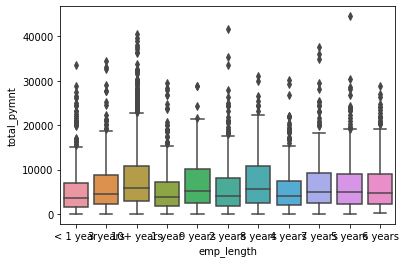

Boxplot of emp_length & total_pymnt_inv


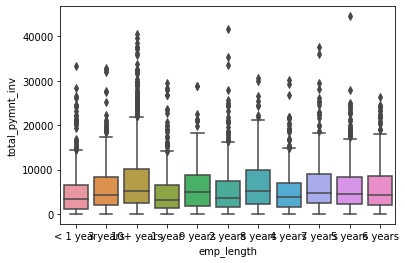

Boxplot of emp_length & total_rec_prncp


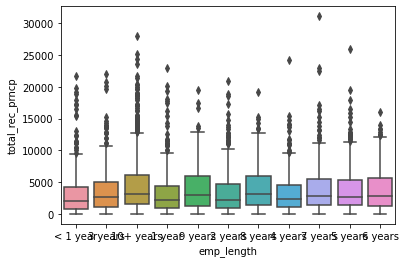

Boxplot of emp_length & total_rec_int


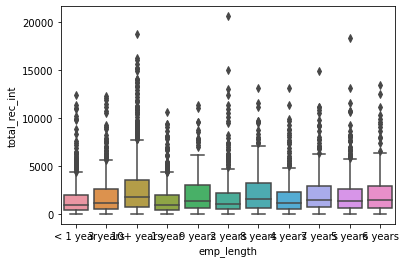

Boxplot of emp_length & total_rec_late_fee


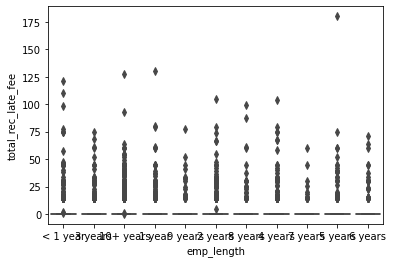

Boxplot of emp_length & recoveries


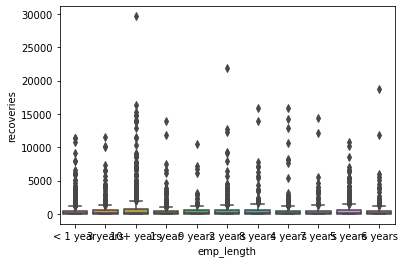

Boxplot of emp_length & collection_recovery_fee


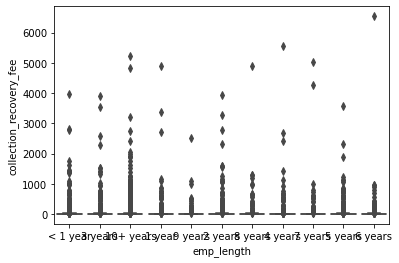

Boxplot of emp_length & last_pymnt_amnt


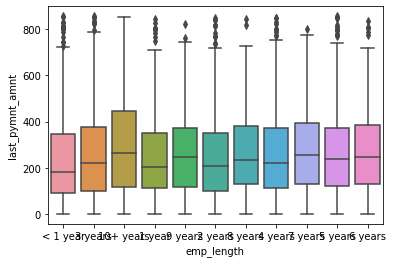

Boxplot of emp_length & monthly_inc


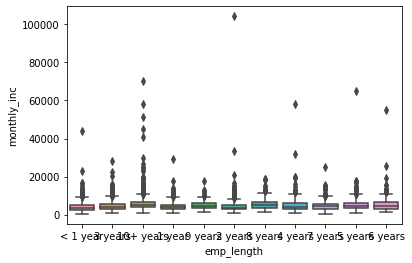

Boxplot of home_ownership & loan_amnt


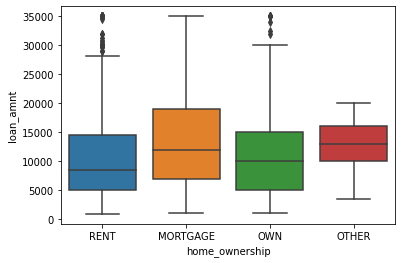

Boxplot of home_ownership & funded_amnt


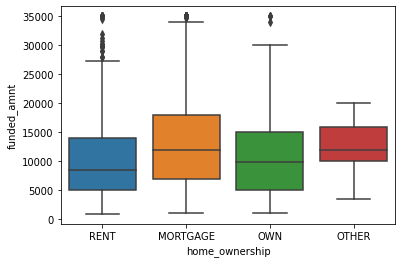

Boxplot of home_ownership & funded_amnt_inv


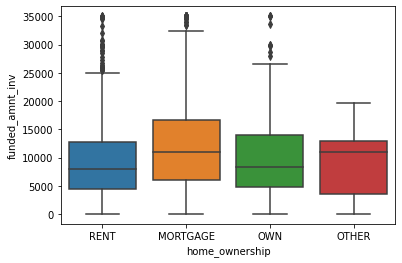

Boxplot of home_ownership & int_rate


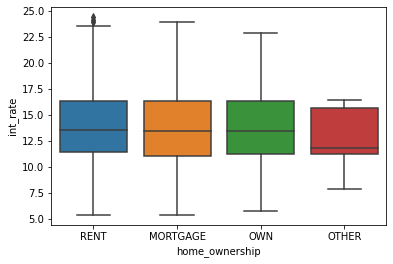

Boxplot of home_ownership & installment


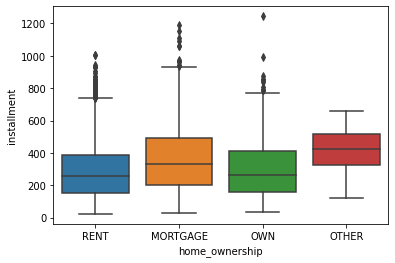

Boxplot of home_ownership & annual_inc


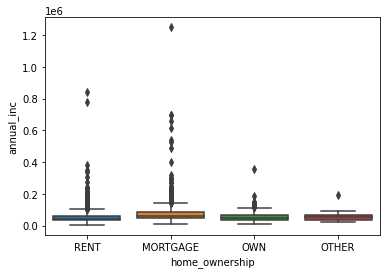

Boxplot of home_ownership & dti


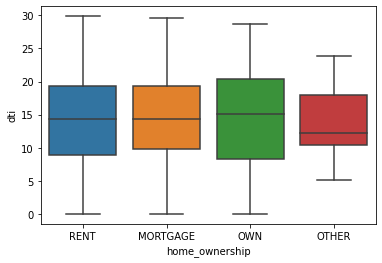

Boxplot of home_ownership & delinq_2yrs


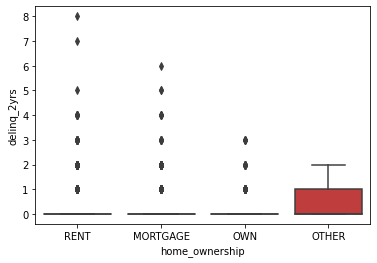

Boxplot of home_ownership & inq_last_6mths


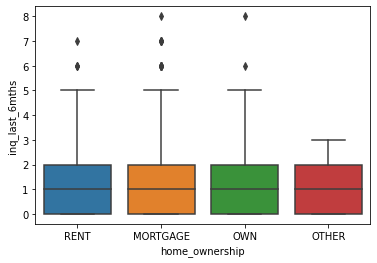

Boxplot of home_ownership & open_acc


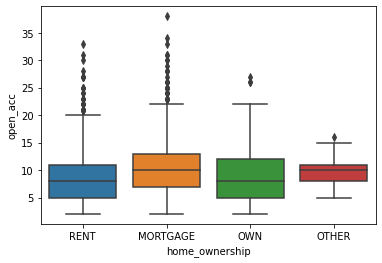

Boxplot of home_ownership & pub_rec


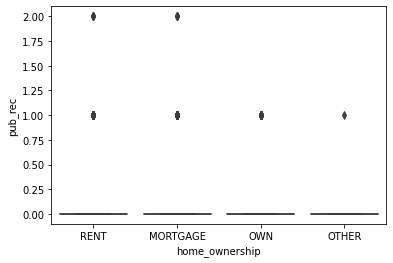

Boxplot of home_ownership & revol_bal


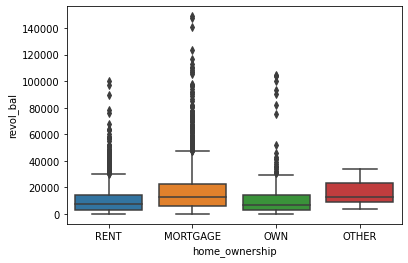

Boxplot of home_ownership & revol_util


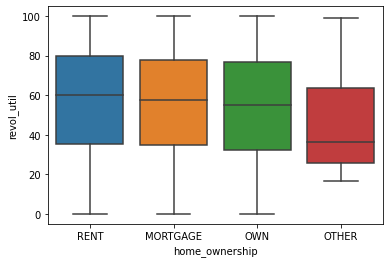

Boxplot of home_ownership & total_acc


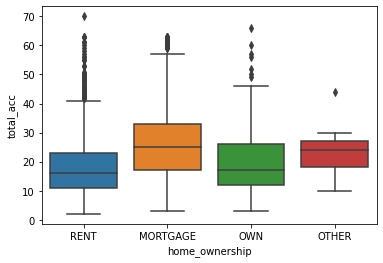

Boxplot of home_ownership & out_prncp


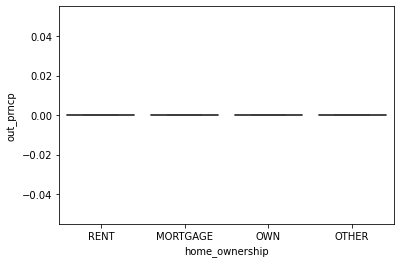

Boxplot of home_ownership & out_prncp_inv


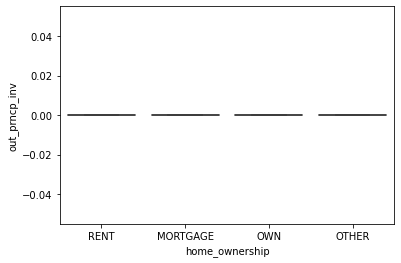

Boxplot of home_ownership & total_pymnt


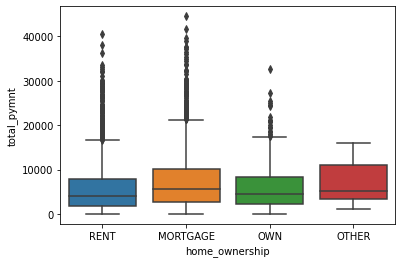

Boxplot of home_ownership & total_pymnt_inv


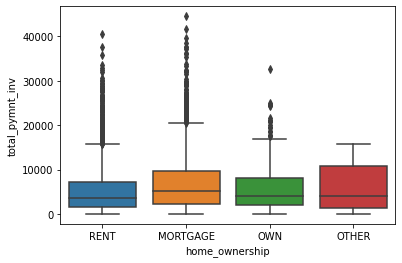

Boxplot of home_ownership & total_rec_prncp


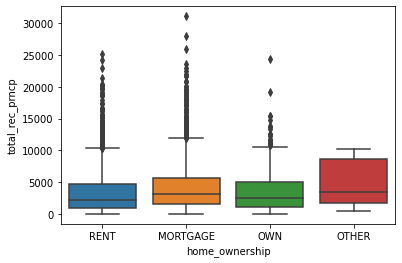

Boxplot of home_ownership & total_rec_int


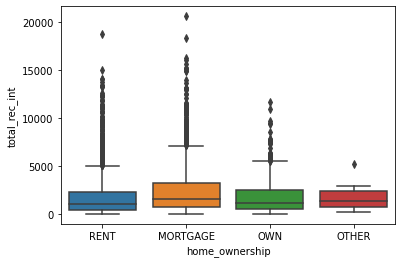

Boxplot of home_ownership & total_rec_late_fee


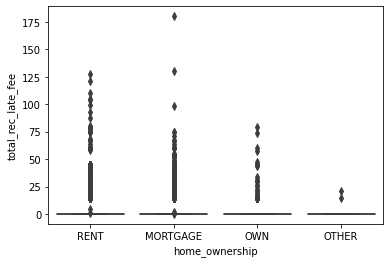

Boxplot of home_ownership & recoveries


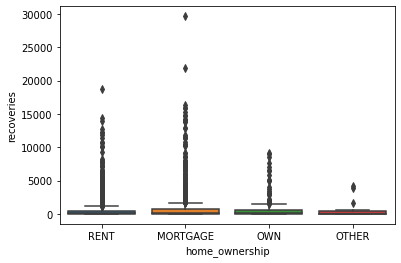

Boxplot of home_ownership & collection_recovery_fee


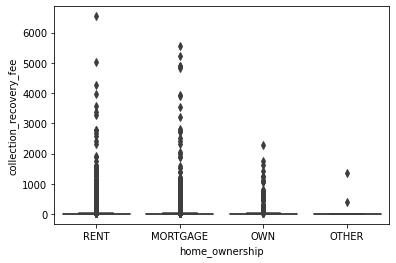

Boxplot of home_ownership & last_pymnt_amnt


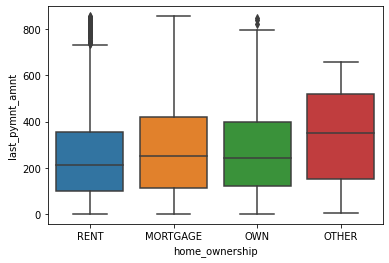

Boxplot of home_ownership & monthly_inc


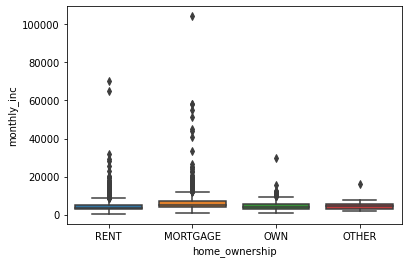

Boxplot of verification_status & loan_amnt


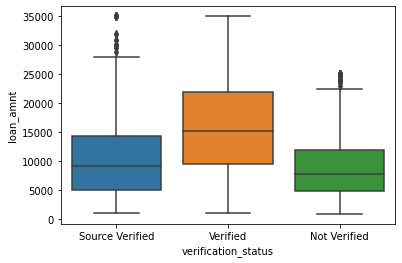

Boxplot of verification_status & funded_amnt


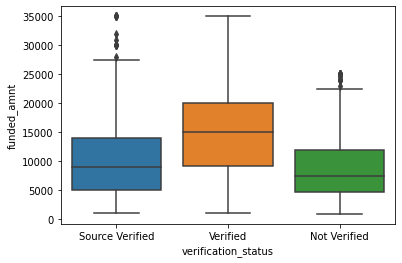

Boxplot of verification_status & funded_amnt_inv


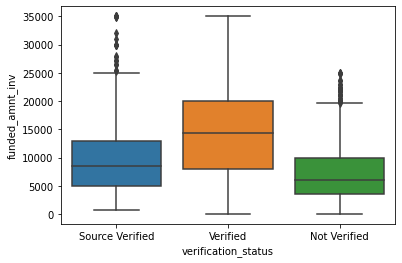

Boxplot of verification_status & int_rate


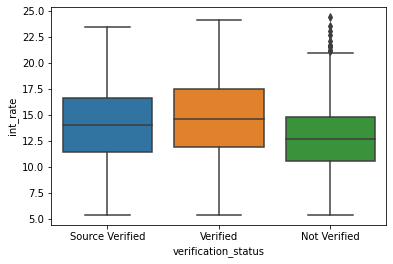

Boxplot of verification_status & installment


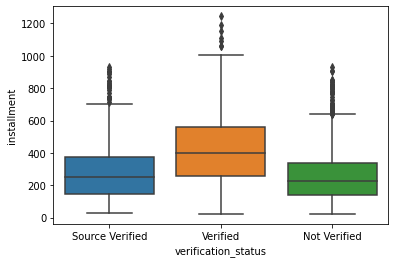

Boxplot of verification_status & annual_inc


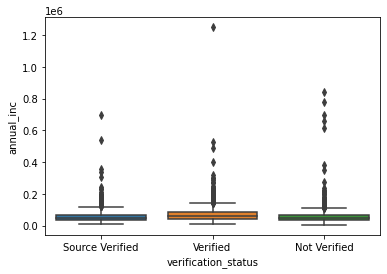

Boxplot of verification_status & dti


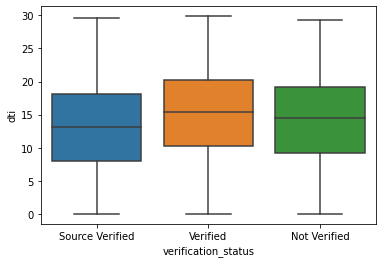

Boxplot of verification_status & delinq_2yrs


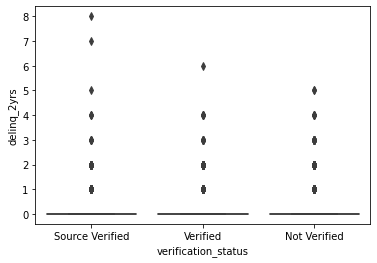

Boxplot of verification_status & inq_last_6mths


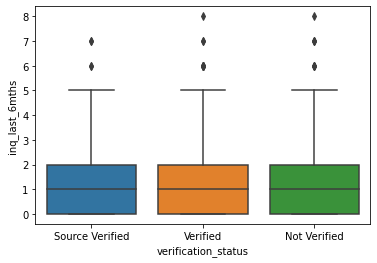

Boxplot of verification_status & open_acc


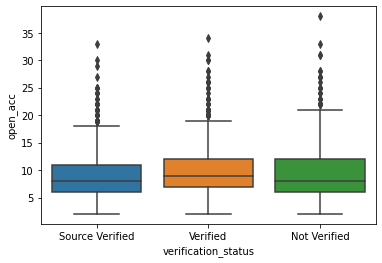

Boxplot of verification_status & pub_rec


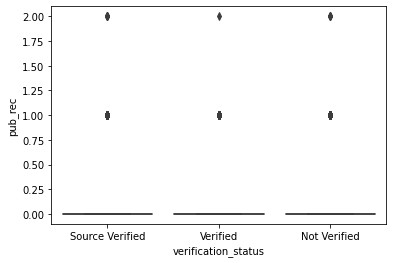

Boxplot of verification_status & revol_bal


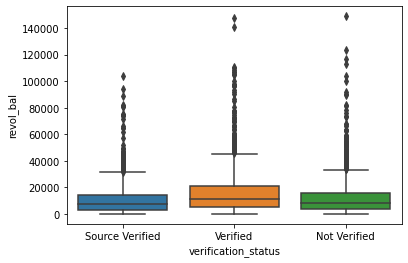

Boxplot of verification_status & revol_util


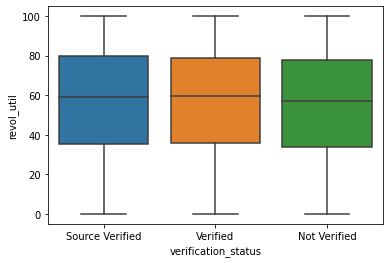

Boxplot of verification_status & total_acc


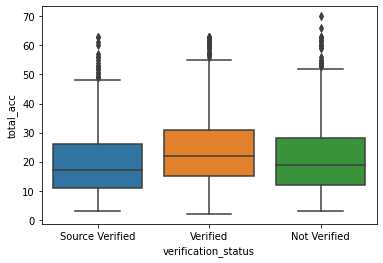

Boxplot of verification_status & out_prncp


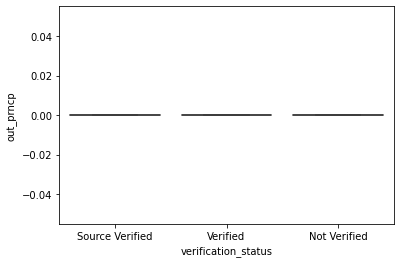

Boxplot of verification_status & out_prncp_inv


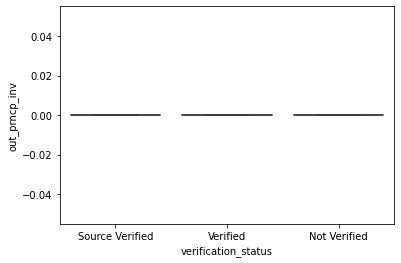

Boxplot of verification_status & total_pymnt


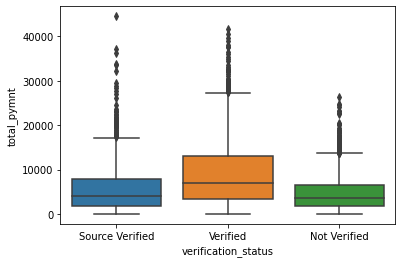

Boxplot of verification_status & total_pymnt_inv


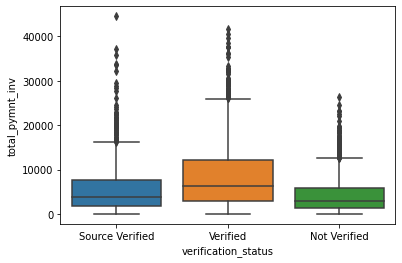

Boxplot of verification_status & total_rec_prncp


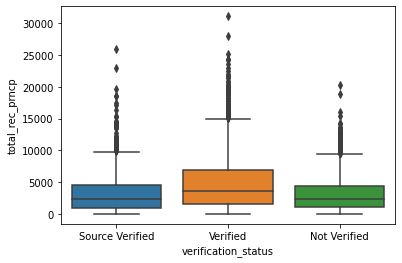

Boxplot of verification_status & total_rec_int


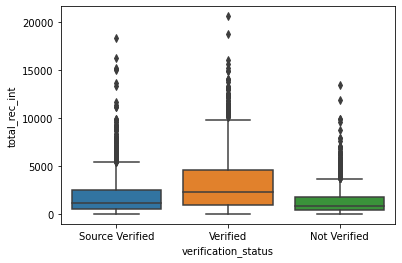

Boxplot of verification_status & total_rec_late_fee


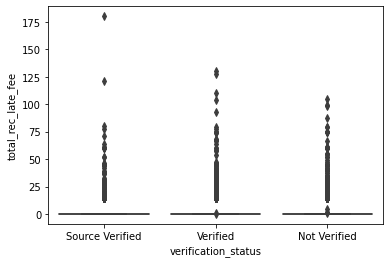

Boxplot of verification_status & recoveries


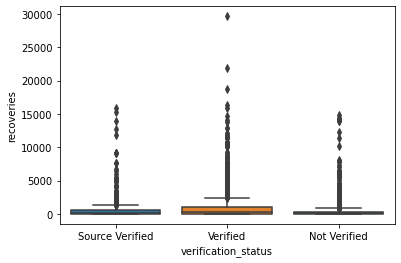

Boxplot of verification_status & collection_recovery_fee


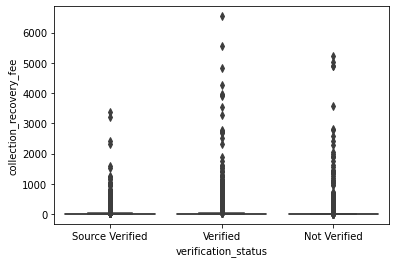

Boxplot of verification_status & last_pymnt_amnt


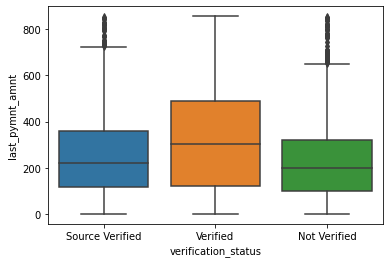

Boxplot of verification_status & monthly_inc


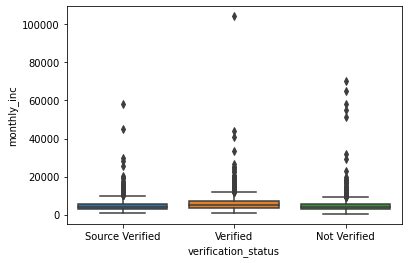

Boxplot of addr_state & loan_amnt


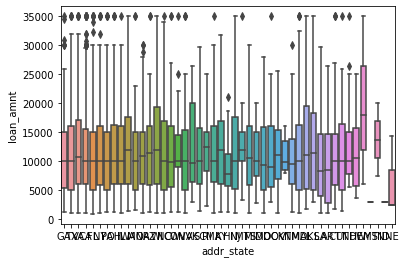

Boxplot of addr_state & funded_amnt


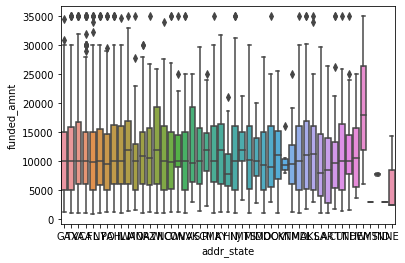

Boxplot of addr_state & funded_amnt_inv


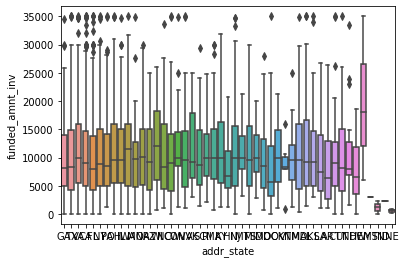

Boxplot of addr_state & int_rate


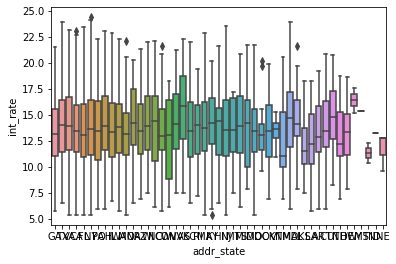

Boxplot of addr_state & installment


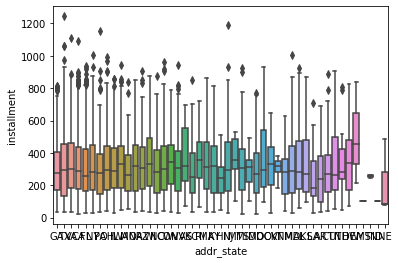

Boxplot of addr_state & annual_inc


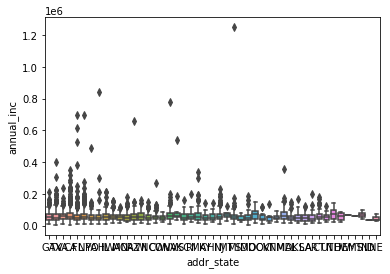

Boxplot of addr_state & dti


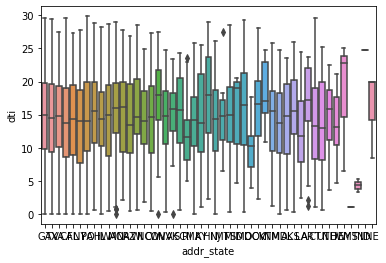

Boxplot of addr_state & delinq_2yrs


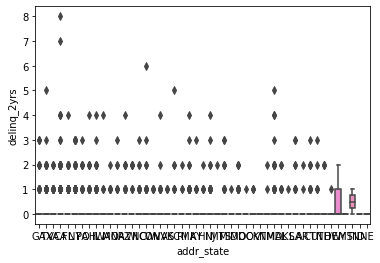

Boxplot of addr_state & inq_last_6mths


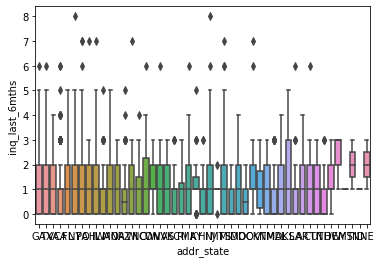

Boxplot of addr_state & open_acc


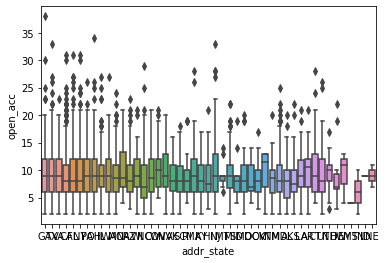

Boxplot of addr_state & pub_rec


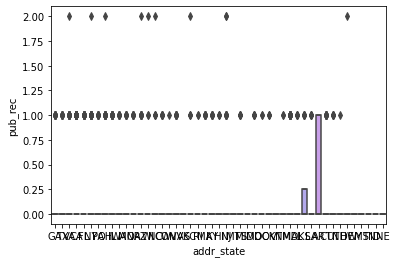

Boxplot of addr_state & revol_bal


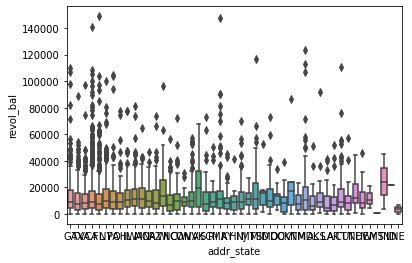

Boxplot of addr_state & revol_util


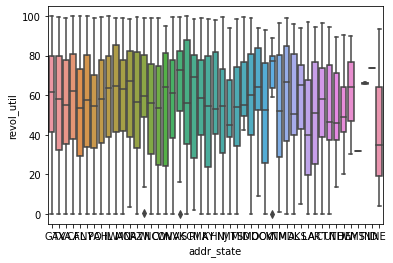

Boxplot of addr_state & total_acc


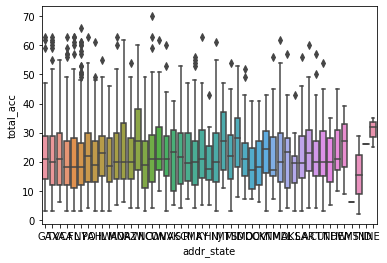

Boxplot of addr_state & out_prncp


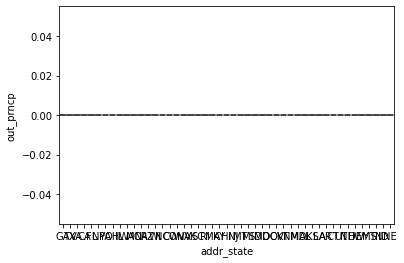

Boxplot of addr_state & out_prncp_inv


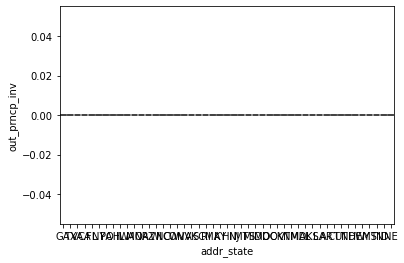

Boxplot of addr_state & total_pymnt


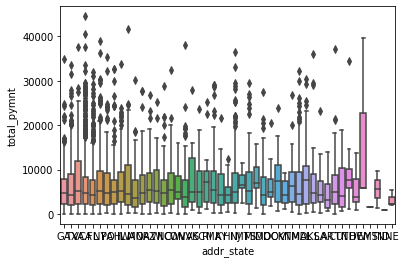

Boxplot of addr_state & total_pymnt_inv


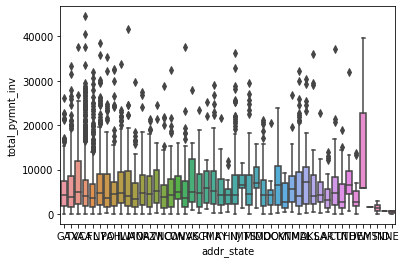

Boxplot of addr_state & total_rec_prncp


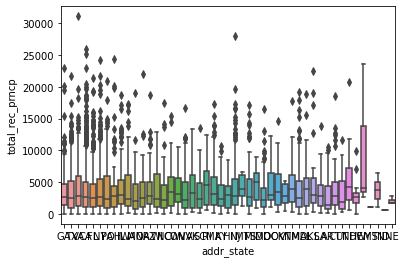

Boxplot of addr_state & total_rec_int


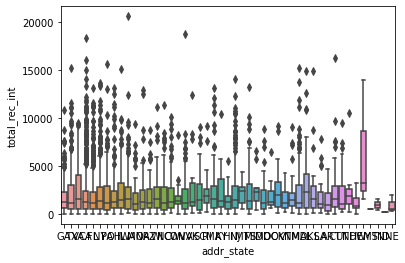

Boxplot of addr_state & total_rec_late_fee


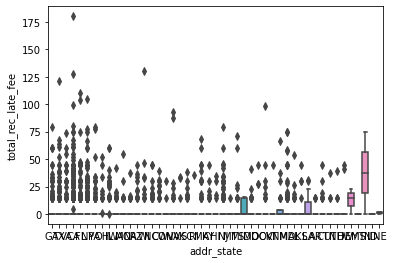

Boxplot of addr_state & recoveries


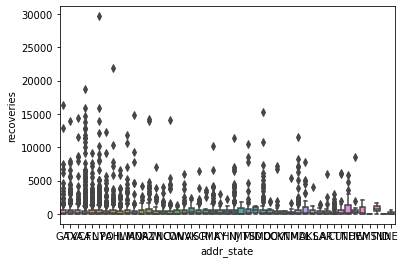

Boxplot of addr_state & collection_recovery_fee


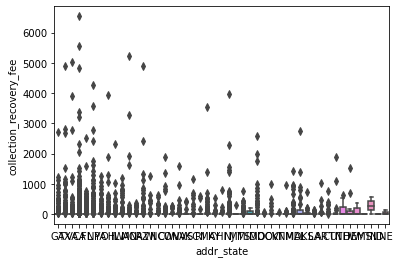

Boxplot of addr_state & last_pymnt_amnt


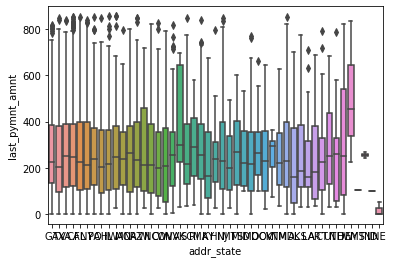

Boxplot of addr_state & monthly_inc


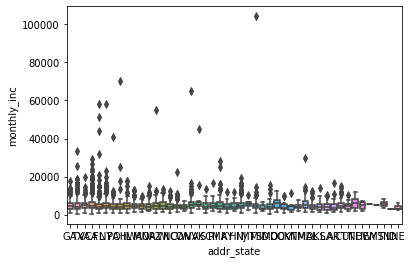

Boxplot of pub_rec_bankruptcies & loan_amnt


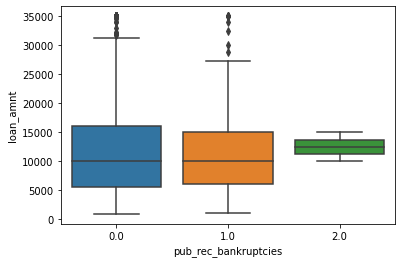

Boxplot of pub_rec_bankruptcies & funded_amnt


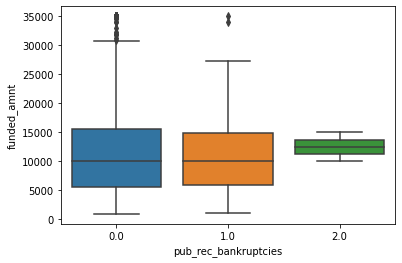

Boxplot of pub_rec_bankruptcies & funded_amnt_inv


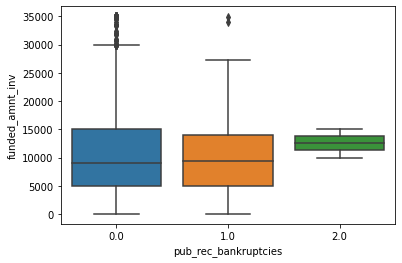

Boxplot of pub_rec_bankruptcies & int_rate


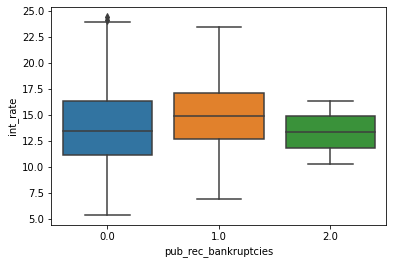

Boxplot of pub_rec_bankruptcies & installment


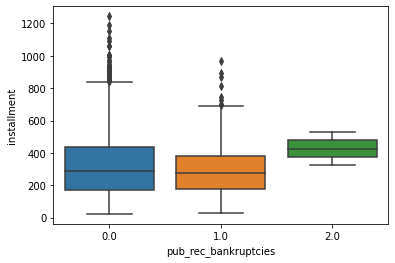

Boxplot of pub_rec_bankruptcies & annual_inc


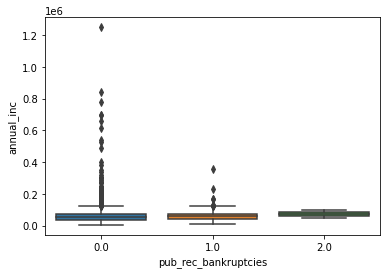

Boxplot of pub_rec_bankruptcies & dti


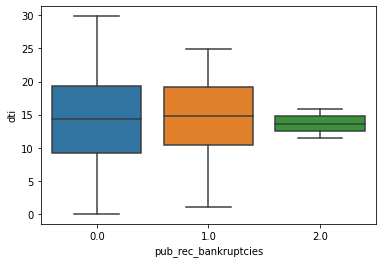

Boxplot of pub_rec_bankruptcies & delinq_2yrs


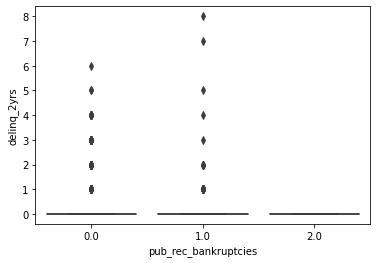

Boxplot of pub_rec_bankruptcies & inq_last_6mths


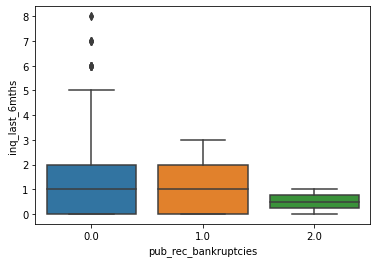

Boxplot of pub_rec_bankruptcies & open_acc


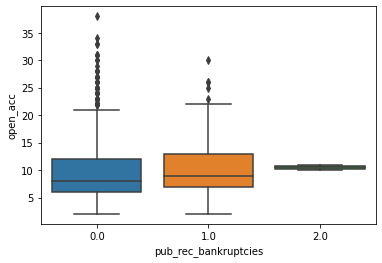

Boxplot of pub_rec_bankruptcies & pub_rec


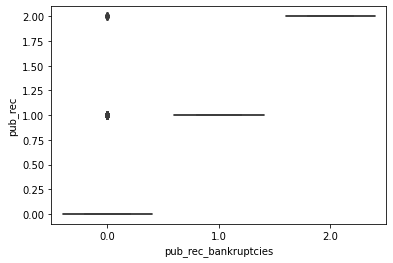

Boxplot of pub_rec_bankruptcies & revol_bal


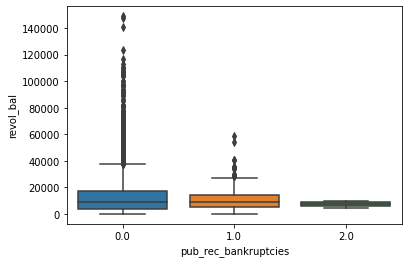

Boxplot of pub_rec_bankruptcies & revol_util


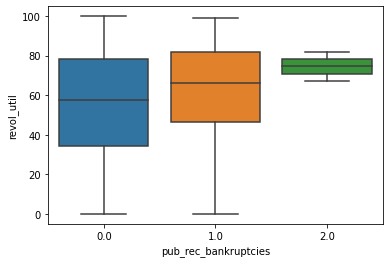

Boxplot of pub_rec_bankruptcies & total_acc


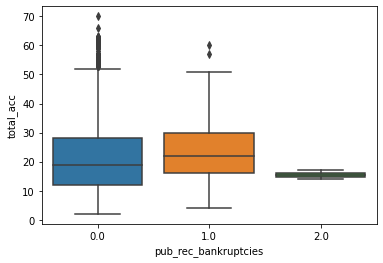

Boxplot of pub_rec_bankruptcies & out_prncp


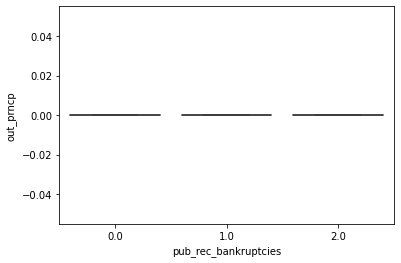

Boxplot of pub_rec_bankruptcies & out_prncp_inv


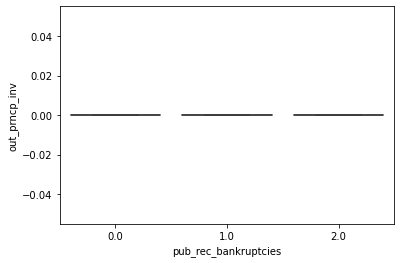

Boxplot of pub_rec_bankruptcies & total_pymnt


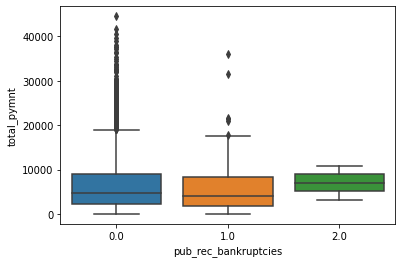

Boxplot of pub_rec_bankruptcies & total_pymnt_inv


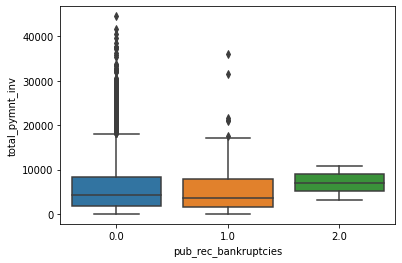

Boxplot of pub_rec_bankruptcies & total_rec_prncp


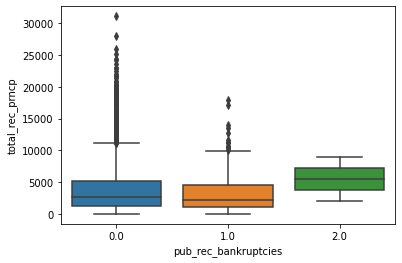

Boxplot of pub_rec_bankruptcies & total_rec_int


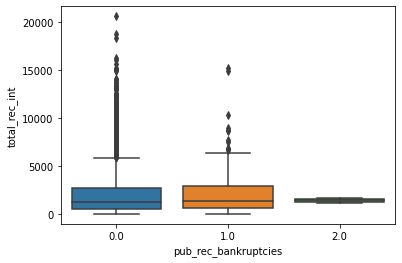

Boxplot of pub_rec_bankruptcies & total_rec_late_fee


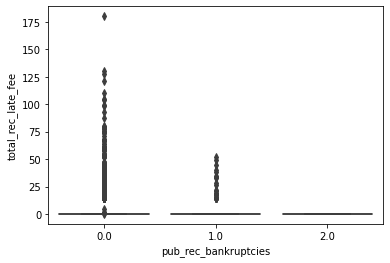

Boxplot of pub_rec_bankruptcies & recoveries


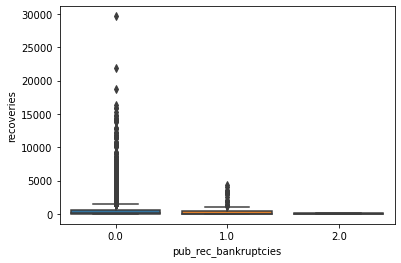

Boxplot of pub_rec_bankruptcies & collection_recovery_fee


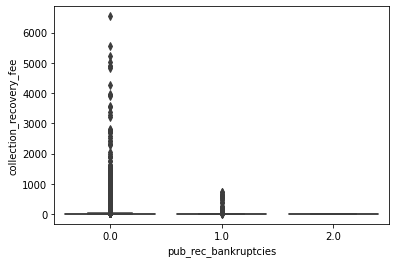

Boxplot of pub_rec_bankruptcies & last_pymnt_amnt


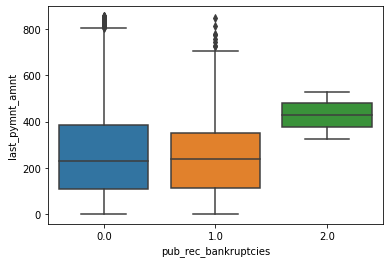

Boxplot of pub_rec_bankruptcies & monthly_inc


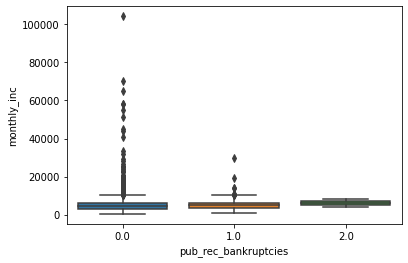

In [71]:
#Plotting box plots to see variations in continuous values as per changes in the categorical column
for i in catg_cols:
    for j in contn_cols:
        print("Boxplot of "+i+" & "+j)
        sns.boxplot(charged_off_data[i],charged_off_data[j])
        plt.show()

### Key Observations from above

1. The loan amount, funded amount, funded amount by investors, interest rate, installment, dti ratio tends to be higher for higher term (60 months) loans

2. For Grade F Loans, the loan amount is the highest wherease for Grade A Loans, it is the least. Moreover, for Grade G loans the interest rate is seen to be the highest whereas for Grade A Loans it is the lowest


3. The loan amount of applicants who have home ownership as Mortgage is higher as compared to other categories

4. The loan amount for the applicants whose verification status is verified is higher as compared to the applicants who are not verified. Moreover, the interest rate & installment for Not verified applicants is less 

5. Even the applicants for whom the Number of public record bankruptcies is 2, for them the interest rate is fairly less.

Boxplot of term & loan_amnt


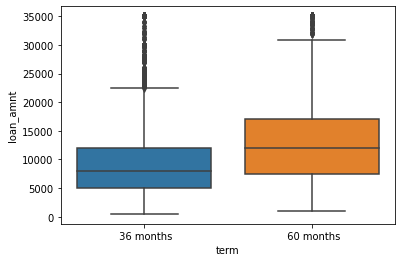

Boxplot of term & funded_amnt


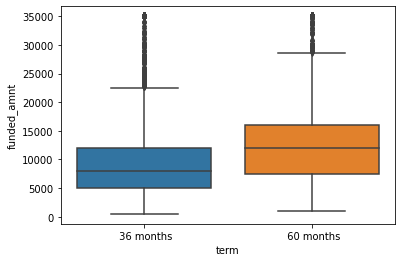

Boxplot of term & funded_amnt_inv


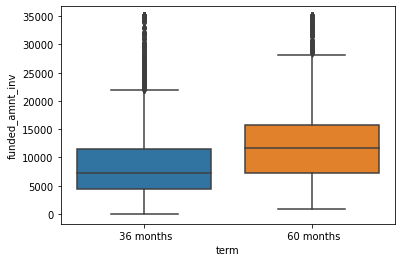

Boxplot of term & int_rate


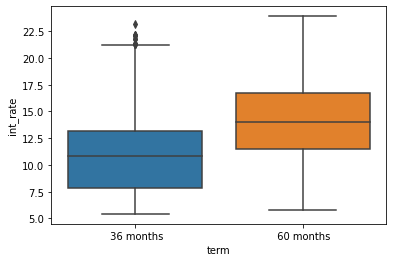

Boxplot of term & installment


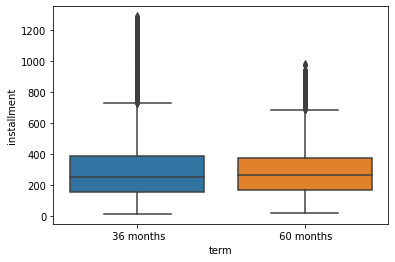

Boxplot of term & annual_inc


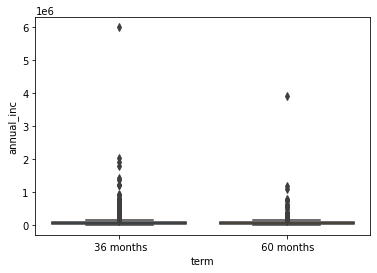

Boxplot of term & dti


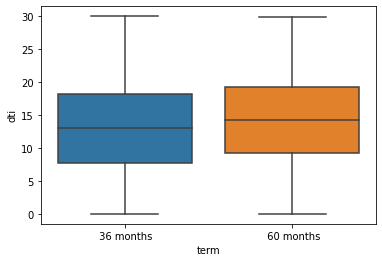

Boxplot of term & delinq_2yrs


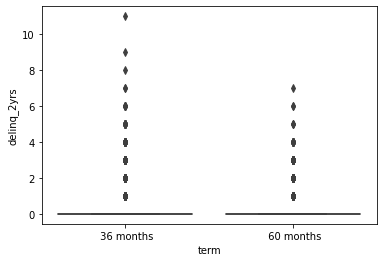

Boxplot of term & inq_last_6mths


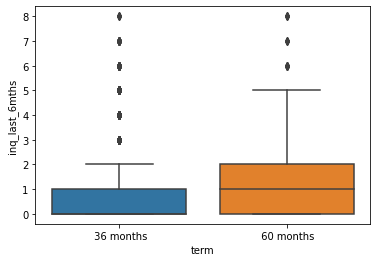

Boxplot of term & open_acc


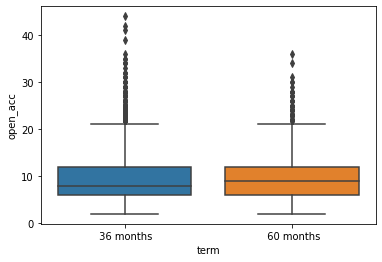

Boxplot of term & pub_rec


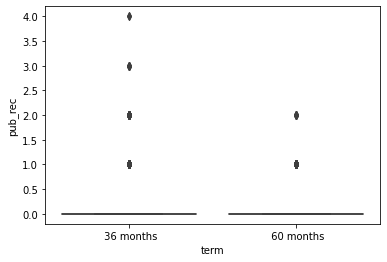

Boxplot of term & revol_bal


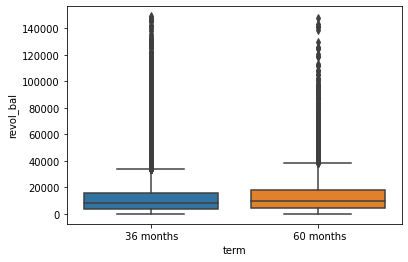

Boxplot of term & revol_util


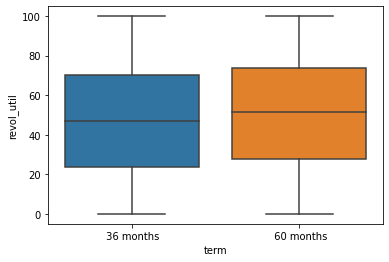

Boxplot of term & total_acc


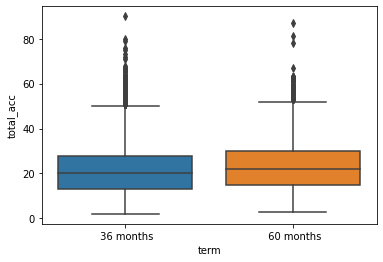

Boxplot of term & out_prncp


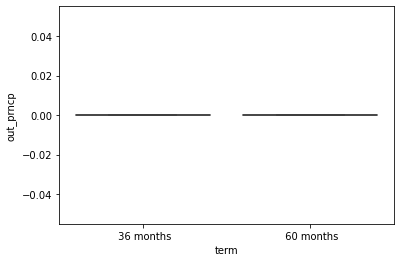

Boxplot of term & out_prncp_inv


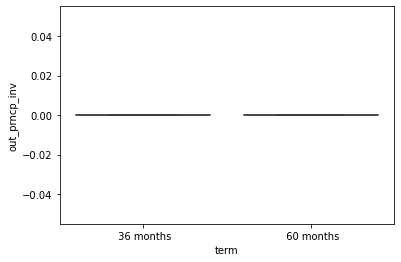

Boxplot of term & total_pymnt


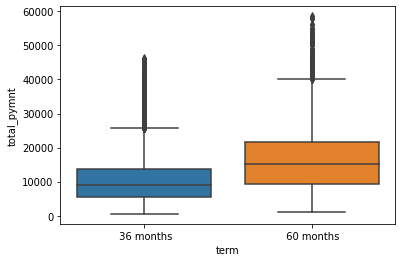

Boxplot of term & total_pymnt_inv


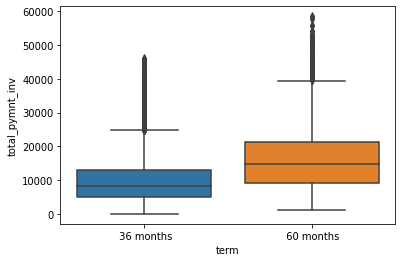

Boxplot of term & total_rec_prncp


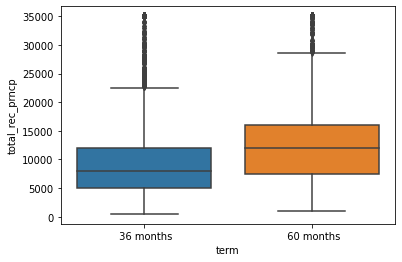

Boxplot of term & total_rec_int


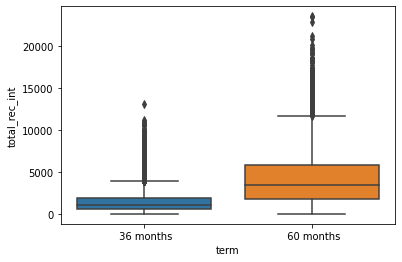

Boxplot of term & total_rec_late_fee


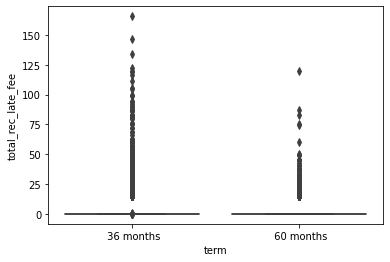

Boxplot of term & recoveries


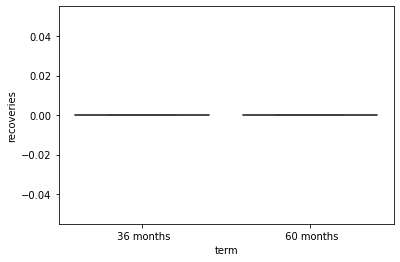

Boxplot of term & collection_recovery_fee


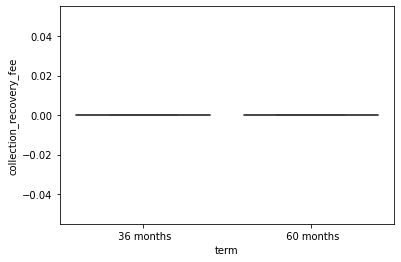

Boxplot of term & last_pymnt_amnt


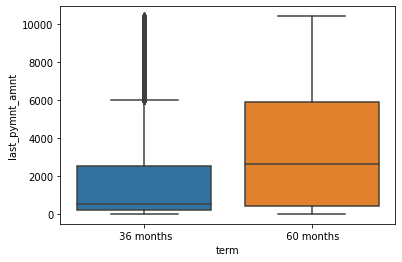

Boxplot of term & monthly_inc


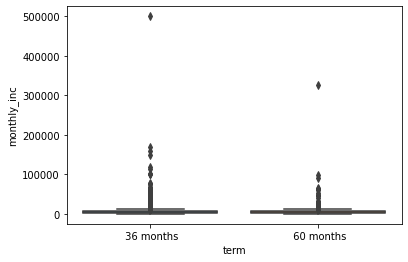

Boxplot of grade & loan_amnt


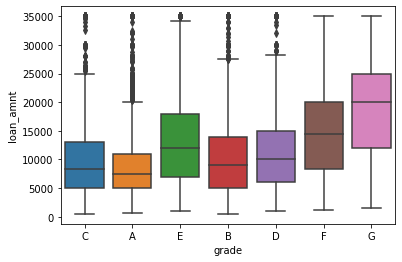

Boxplot of grade & funded_amnt


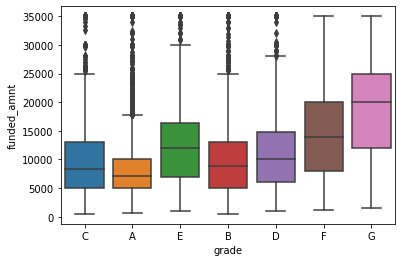

Boxplot of grade & funded_amnt_inv


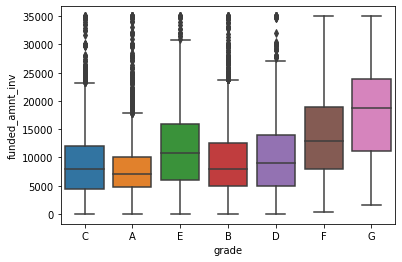

Boxplot of grade & int_rate


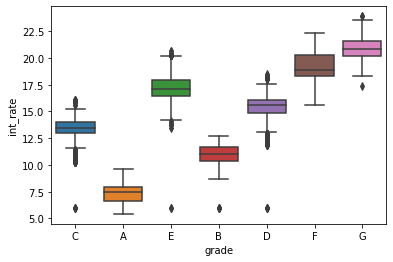

Boxplot of grade & installment


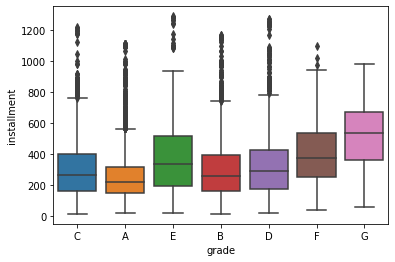

Boxplot of grade & annual_inc


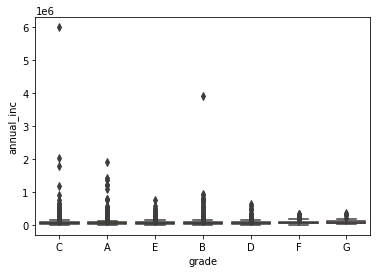

Boxplot of grade & dti


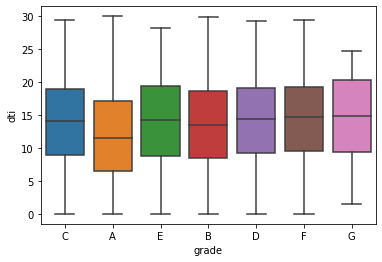

Boxplot of grade & delinq_2yrs


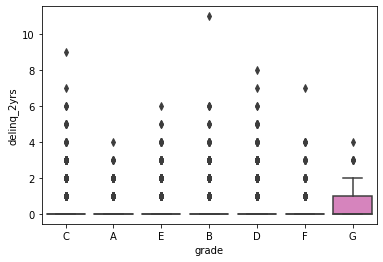

Boxplot of grade & inq_last_6mths


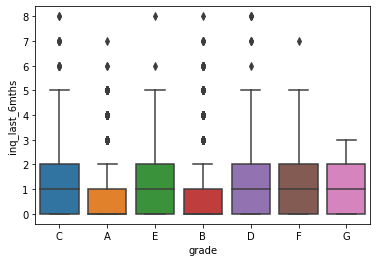

Boxplot of grade & open_acc


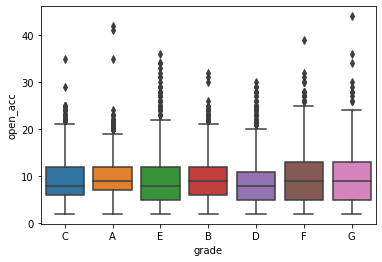

Boxplot of grade & pub_rec


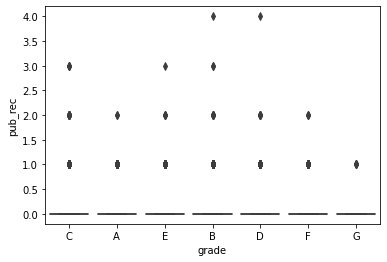

Boxplot of grade & revol_bal


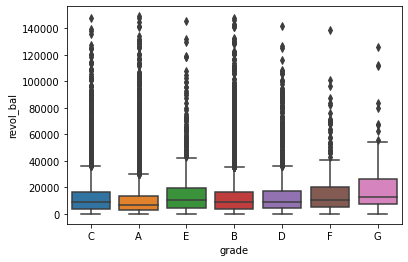

Boxplot of grade & revol_util


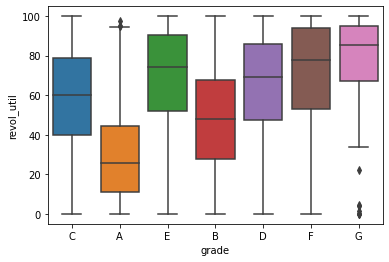

Boxplot of grade & total_acc


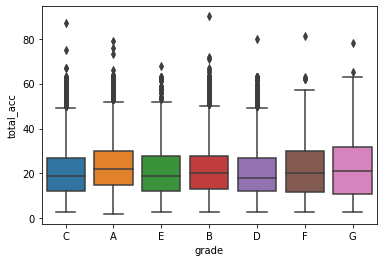

Boxplot of grade & out_prncp


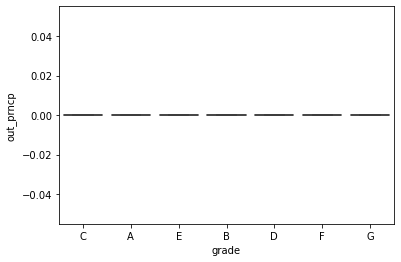

Boxplot of grade & out_prncp_inv


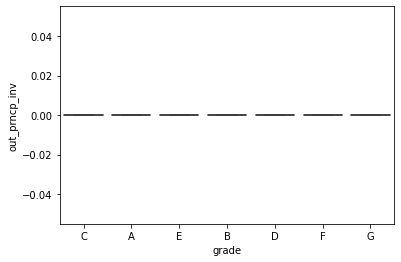

Boxplot of grade & total_pymnt


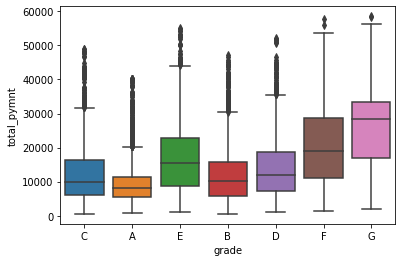

Boxplot of grade & total_pymnt_inv


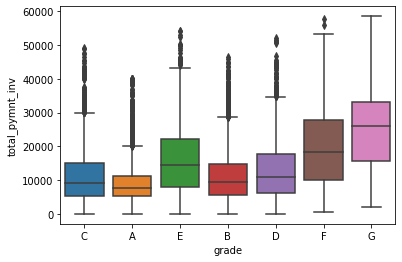

Boxplot of grade & total_rec_prncp


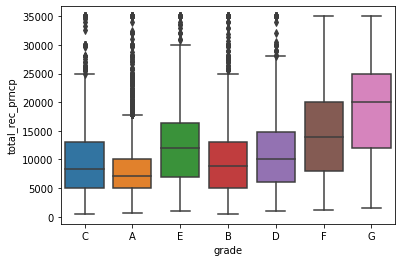

Boxplot of grade & total_rec_int


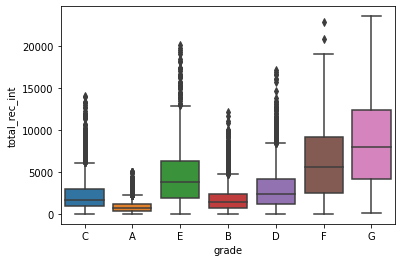

Boxplot of grade & total_rec_late_fee


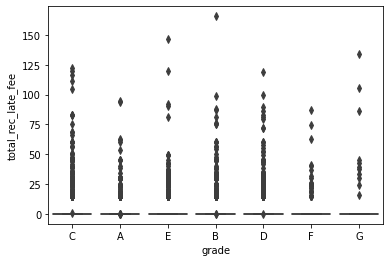

Boxplot of grade & recoveries


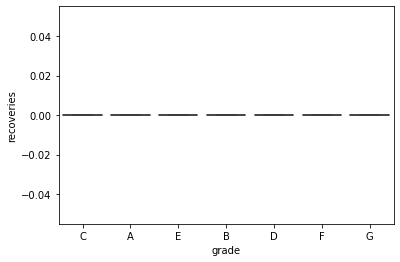

Boxplot of grade & collection_recovery_fee


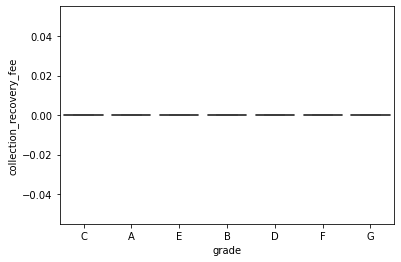

Boxplot of grade & last_pymnt_amnt


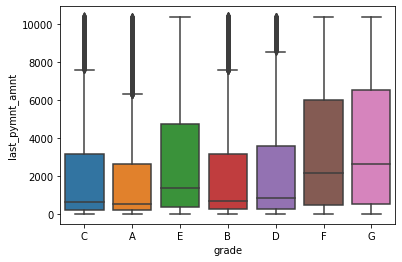

Boxplot of grade & monthly_inc


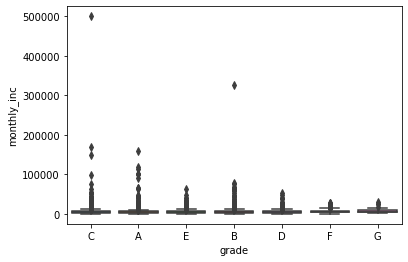

Boxplot of sub_grade & loan_amnt


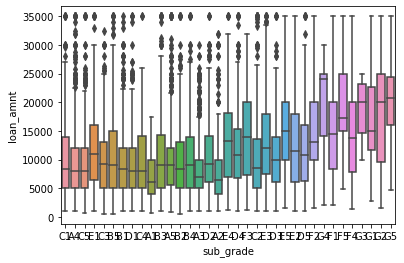

Boxplot of sub_grade & funded_amnt


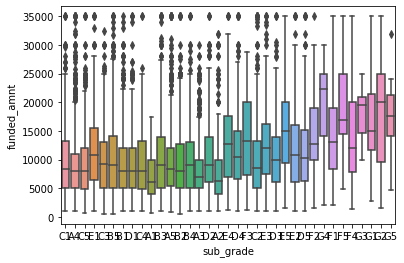

Boxplot of sub_grade & funded_amnt_inv


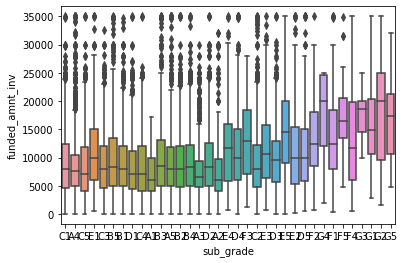

Boxplot of sub_grade & int_rate


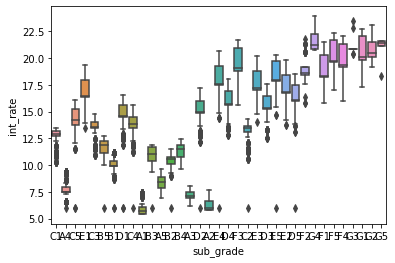

Boxplot of sub_grade & installment


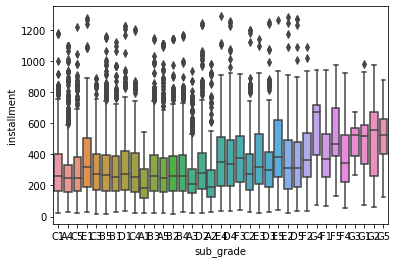

Boxplot of sub_grade & annual_inc


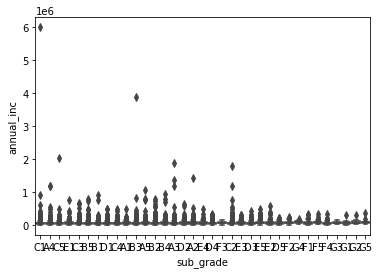

Boxplot of sub_grade & dti


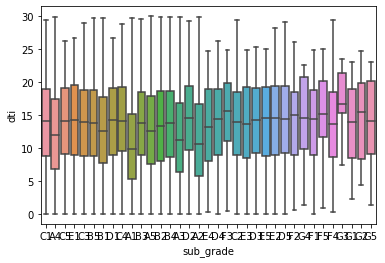

Boxplot of sub_grade & delinq_2yrs


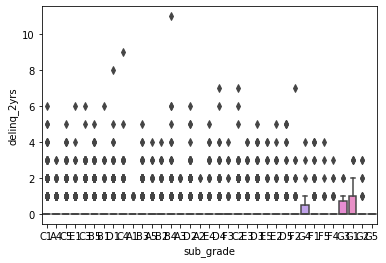

Boxplot of sub_grade & inq_last_6mths


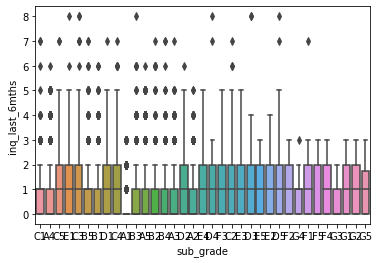

Boxplot of sub_grade & open_acc


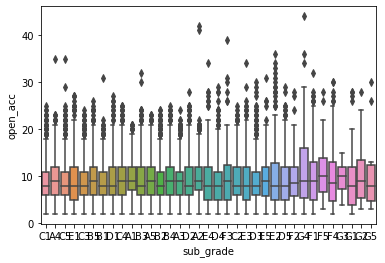

Boxplot of sub_grade & pub_rec


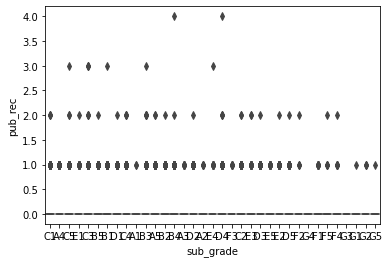

Boxplot of sub_grade & revol_bal


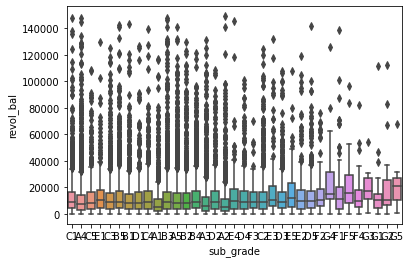

Boxplot of sub_grade & revol_util


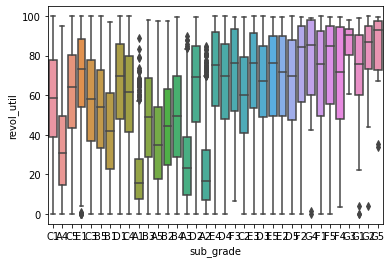

Boxplot of sub_grade & total_acc


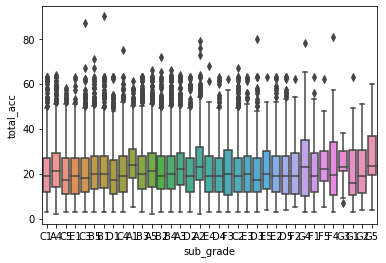

Boxplot of sub_grade & out_prncp


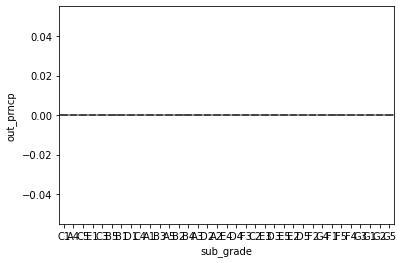

Boxplot of sub_grade & out_prncp_inv


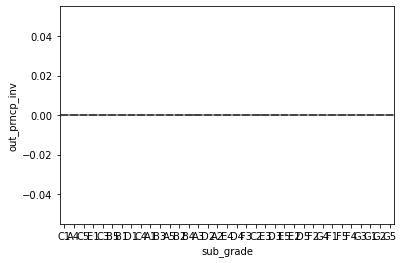

Boxplot of sub_grade & total_pymnt


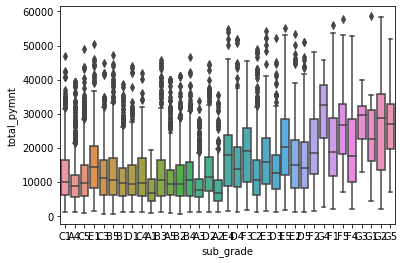

Boxplot of sub_grade & total_pymnt_inv


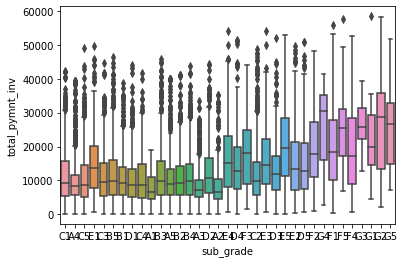

Boxplot of sub_grade & total_rec_prncp


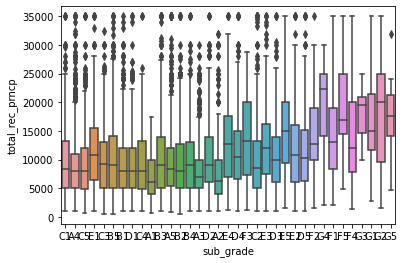

Boxplot of sub_grade & total_rec_int


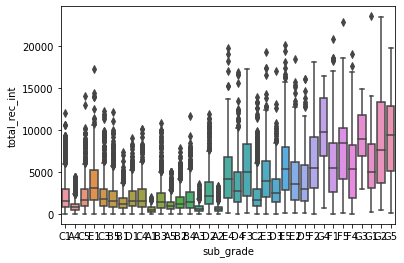

Boxplot of sub_grade & total_rec_late_fee


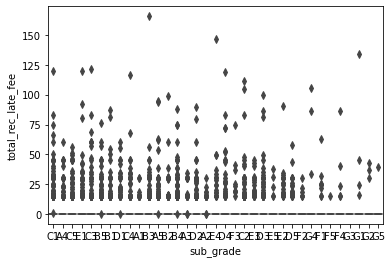

Boxplot of sub_grade & recoveries


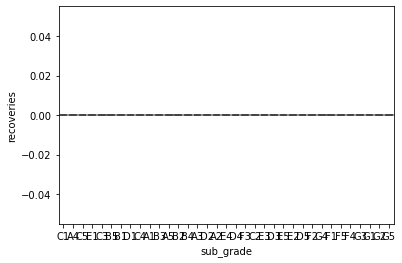

Boxplot of sub_grade & collection_recovery_fee


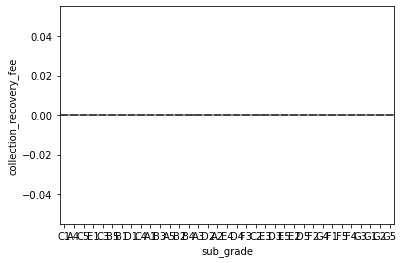

Boxplot of sub_grade & last_pymnt_amnt


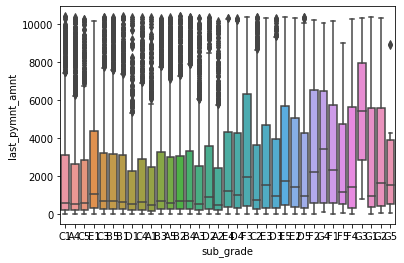

Boxplot of sub_grade & monthly_inc


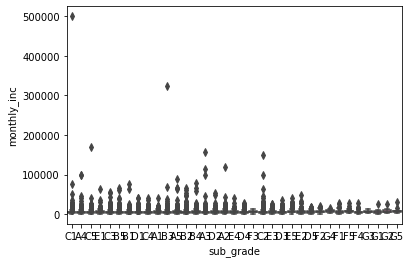

Boxplot of emp_length & loan_amnt


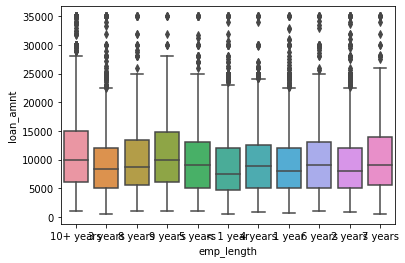

Boxplot of emp_length & funded_amnt


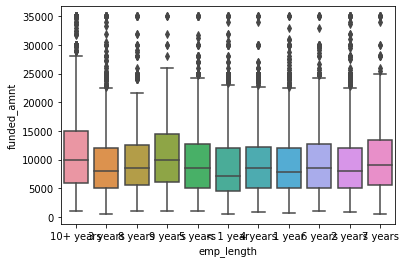

Boxplot of emp_length & funded_amnt_inv


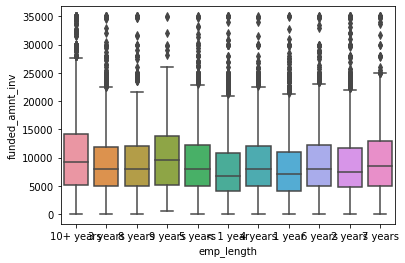

Boxplot of emp_length & int_rate


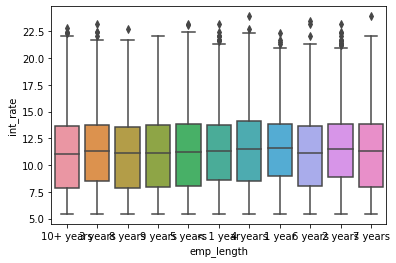

Boxplot of emp_length & installment


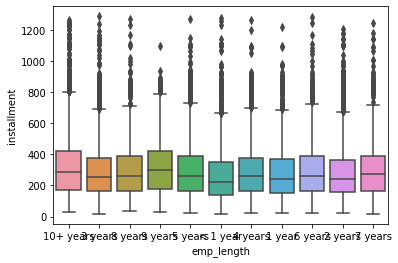

Boxplot of emp_length & annual_inc


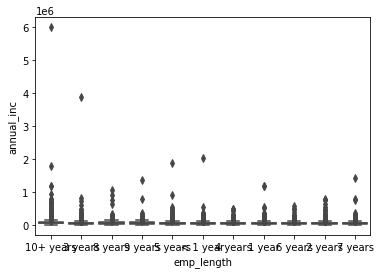

Boxplot of emp_length & dti


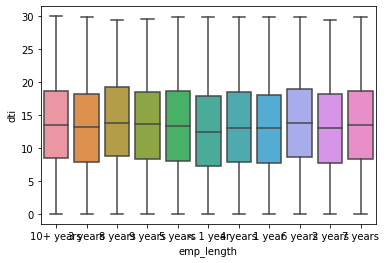

Boxplot of emp_length & delinq_2yrs


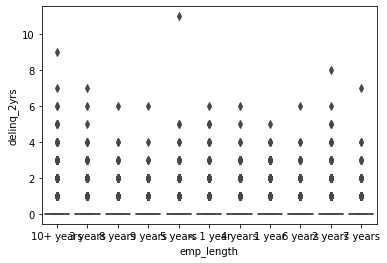

Boxplot of emp_length & inq_last_6mths


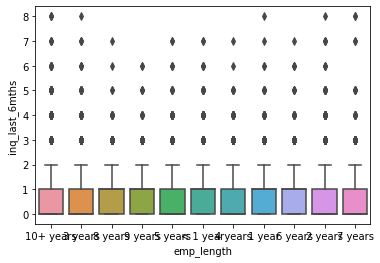

Boxplot of emp_length & open_acc


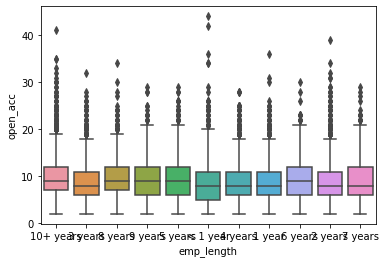

Boxplot of emp_length & pub_rec


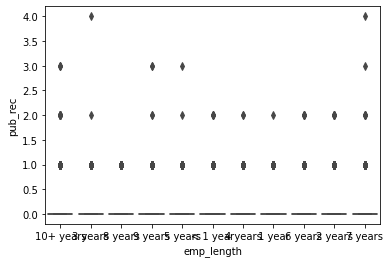

Boxplot of emp_length & revol_bal


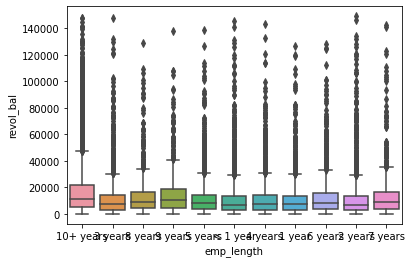

Boxplot of emp_length & revol_util


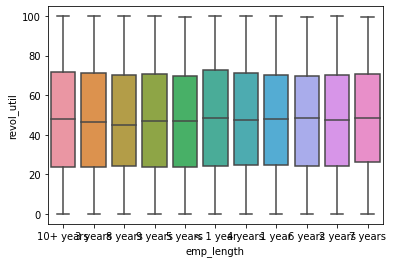

Boxplot of emp_length & total_acc


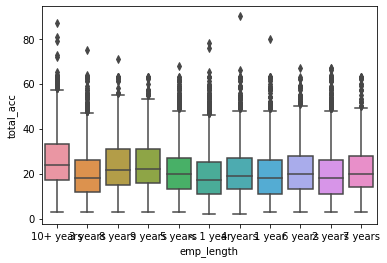

Boxplot of emp_length & out_prncp


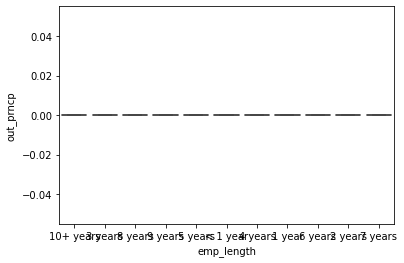

Boxplot of emp_length & out_prncp_inv


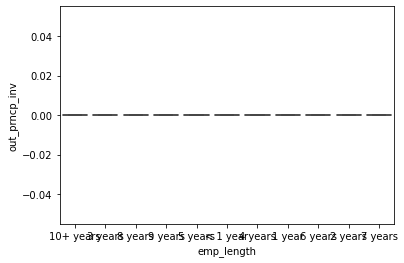

Boxplot of emp_length & total_pymnt


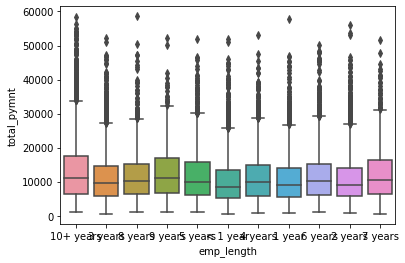

Boxplot of emp_length & total_pymnt_inv


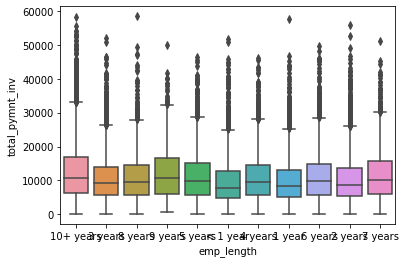

Boxplot of emp_length & total_rec_prncp


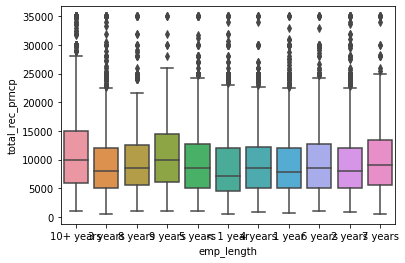

Boxplot of emp_length & total_rec_int


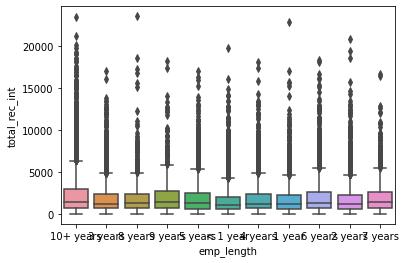

Boxplot of emp_length & total_rec_late_fee


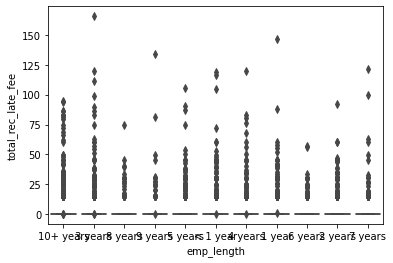

Boxplot of emp_length & recoveries


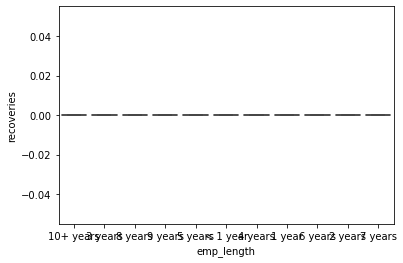

Boxplot of emp_length & collection_recovery_fee


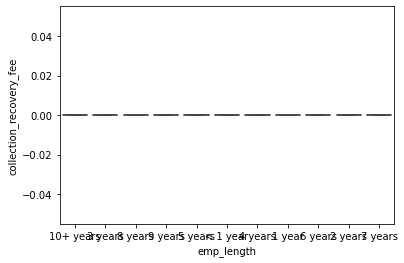

Boxplot of emp_length & last_pymnt_amnt


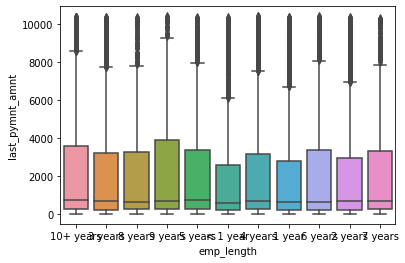

Boxplot of emp_length & monthly_inc


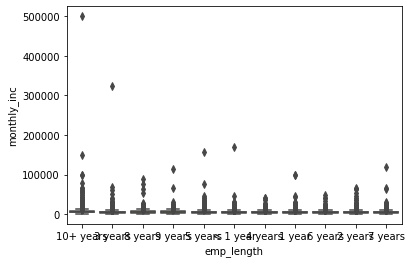

Boxplot of home_ownership & loan_amnt


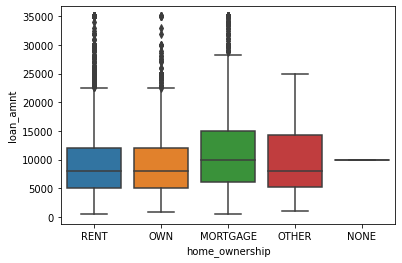

Boxplot of home_ownership & funded_amnt


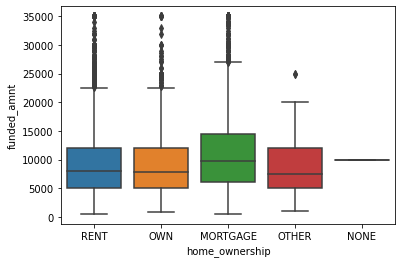

Boxplot of home_ownership & funded_amnt_inv


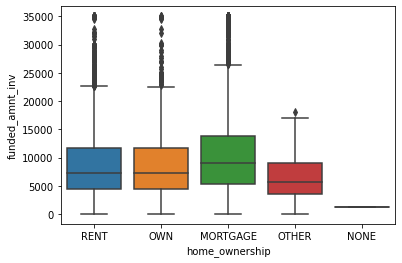

Boxplot of home_ownership & int_rate


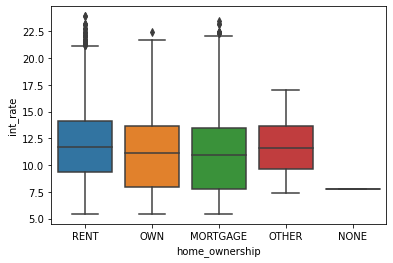

Boxplot of home_ownership & installment


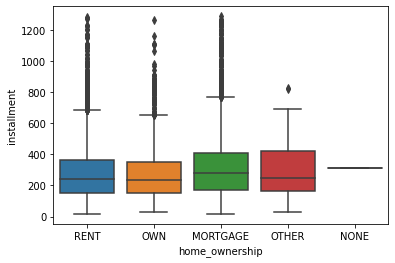

Boxplot of home_ownership & annual_inc


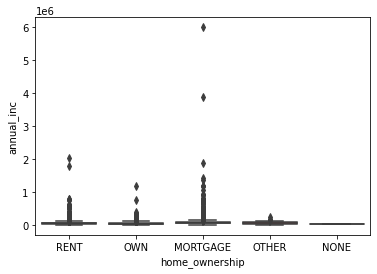

Boxplot of home_ownership & dti


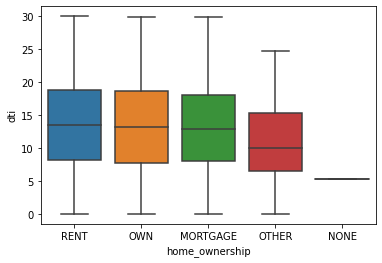

Boxplot of home_ownership & delinq_2yrs


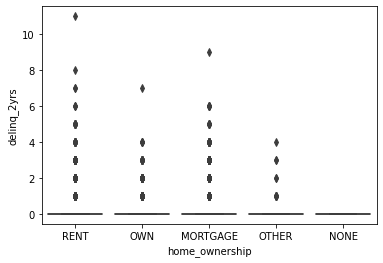

Boxplot of home_ownership & inq_last_6mths


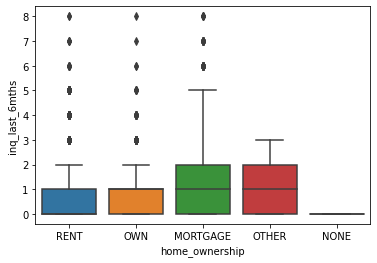

Boxplot of home_ownership & open_acc


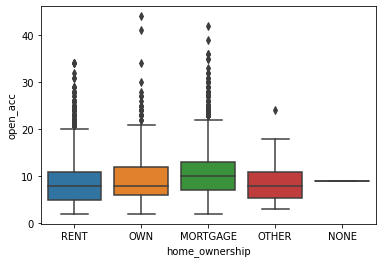

Boxplot of home_ownership & pub_rec


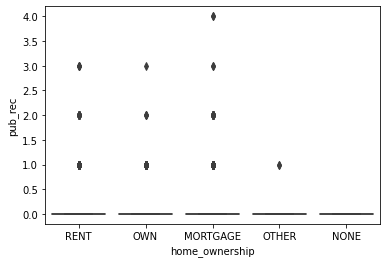

Boxplot of home_ownership & revol_bal


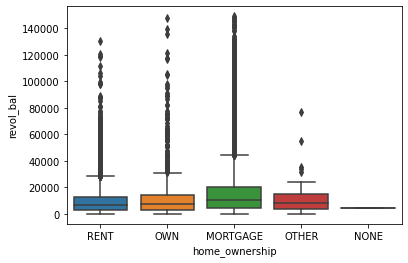

Boxplot of home_ownership & revol_util


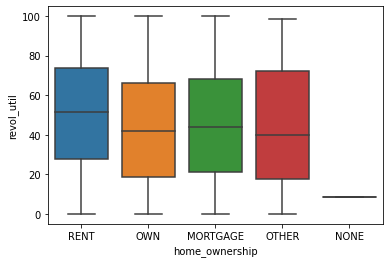

Boxplot of home_ownership & total_acc


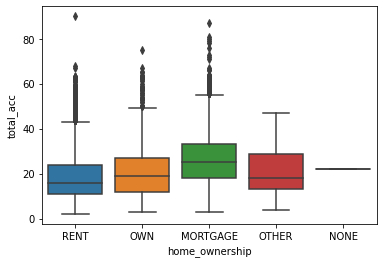

Boxplot of home_ownership & out_prncp


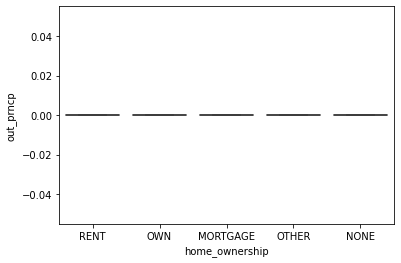

Boxplot of home_ownership & out_prncp_inv


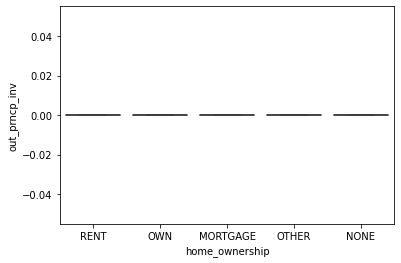

Boxplot of home_ownership & total_pymnt


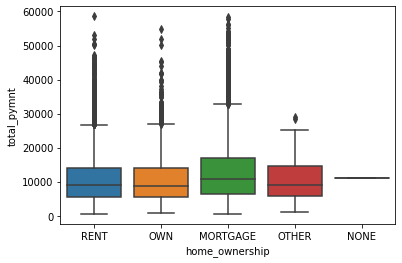

Boxplot of home_ownership & total_pymnt_inv


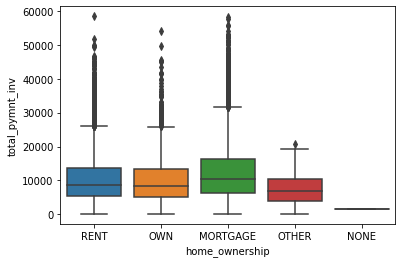

Boxplot of home_ownership & total_rec_prncp


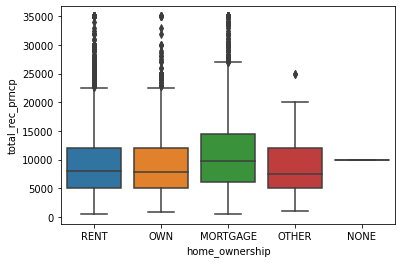

Boxplot of home_ownership & total_rec_int


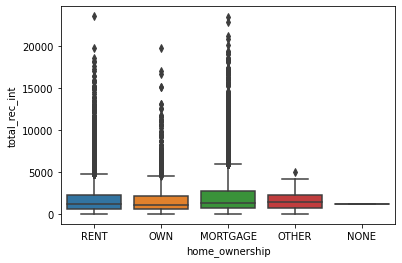

Boxplot of home_ownership & total_rec_late_fee


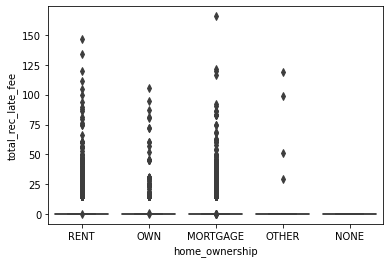

Boxplot of home_ownership & recoveries


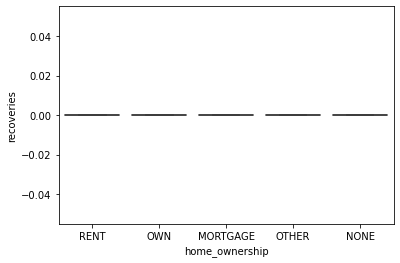

Boxplot of home_ownership & collection_recovery_fee


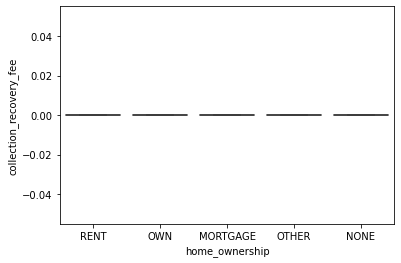

Boxplot of home_ownership & last_pymnt_amnt


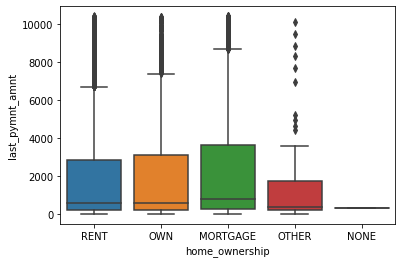

Boxplot of home_ownership & monthly_inc


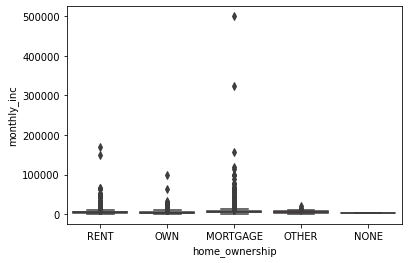

Boxplot of verification_status & loan_amnt


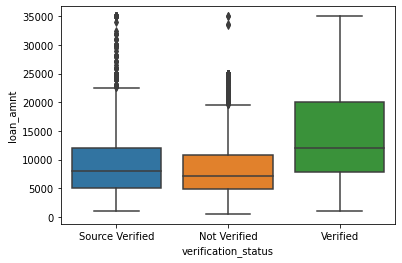

Boxplot of verification_status & funded_amnt


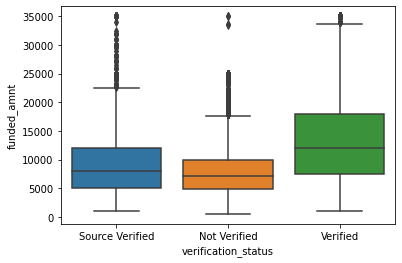

Boxplot of verification_status & funded_amnt_inv


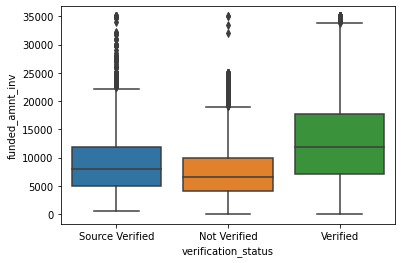

Boxplot of verification_status & int_rate


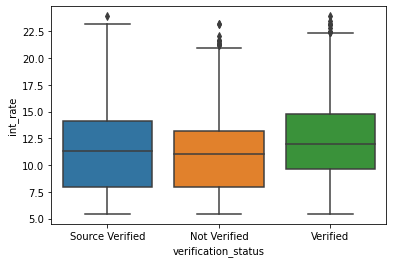

Boxplot of verification_status & installment


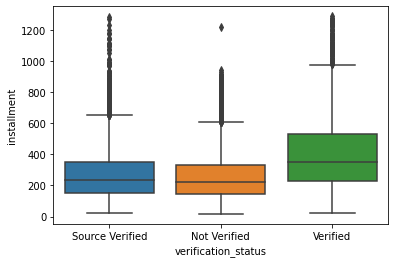

Boxplot of verification_status & annual_inc


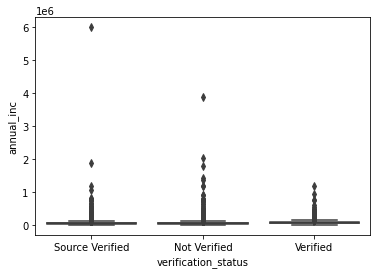

Boxplot of verification_status & dti


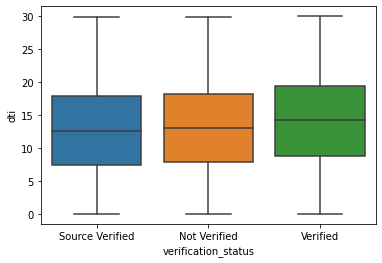

Boxplot of verification_status & delinq_2yrs


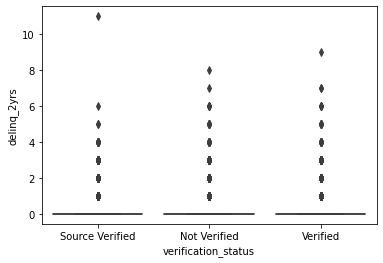

Boxplot of verification_status & inq_last_6mths


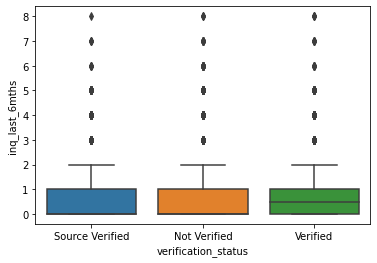

Boxplot of verification_status & open_acc


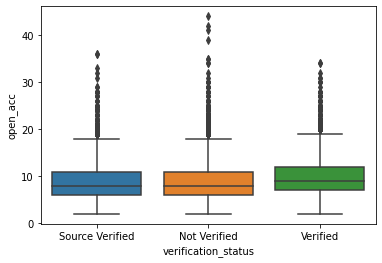

Boxplot of verification_status & pub_rec


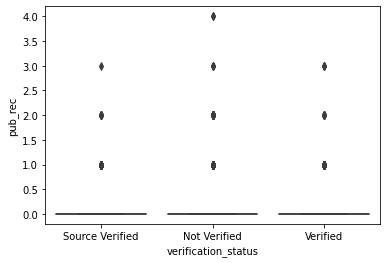

Boxplot of verification_status & revol_bal


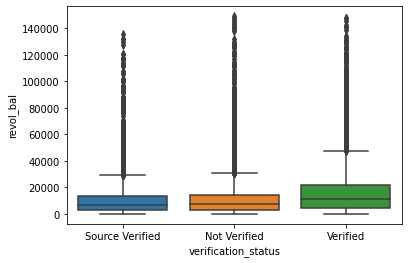

Boxplot of verification_status & revol_util


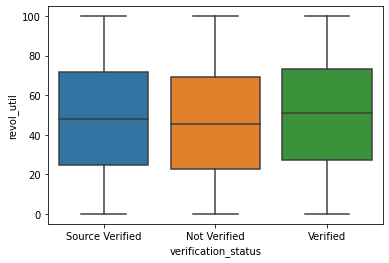

Boxplot of verification_status & total_acc


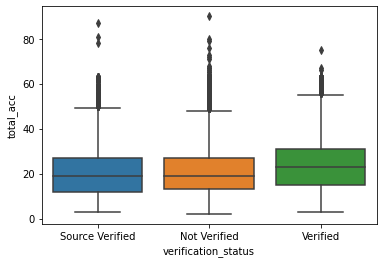

Boxplot of verification_status & out_prncp


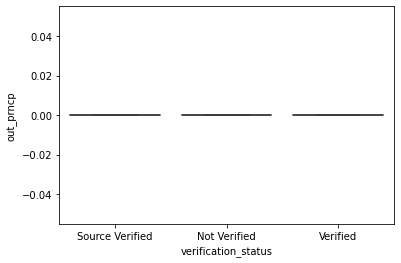

Boxplot of verification_status & out_prncp_inv


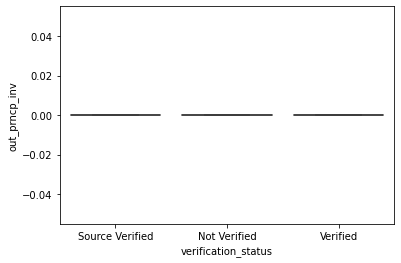

Boxplot of verification_status & total_pymnt


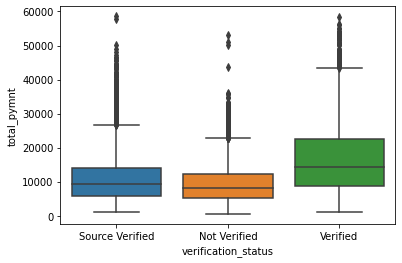

Boxplot of verification_status & total_pymnt_inv


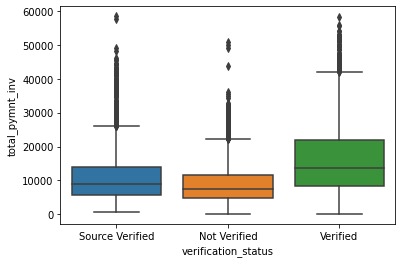

Boxplot of verification_status & total_rec_prncp


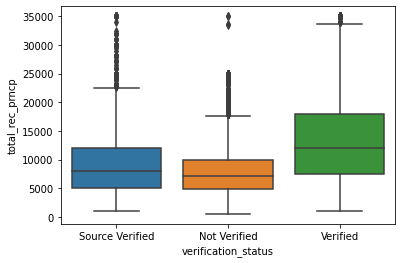

Boxplot of verification_status & total_rec_int


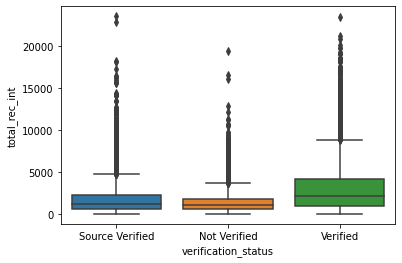

Boxplot of verification_status & total_rec_late_fee


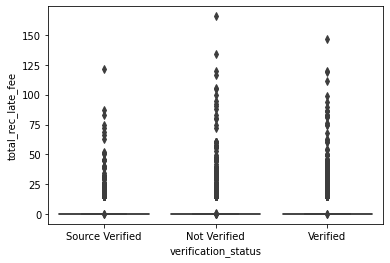

Boxplot of verification_status & recoveries


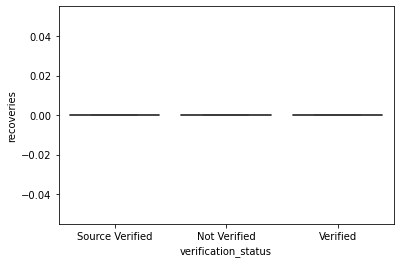

Boxplot of verification_status & collection_recovery_fee


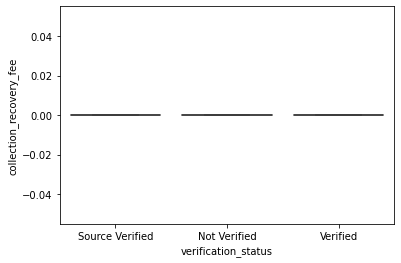

Boxplot of verification_status & last_pymnt_amnt


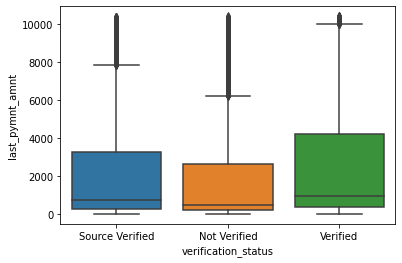

Boxplot of verification_status & monthly_inc


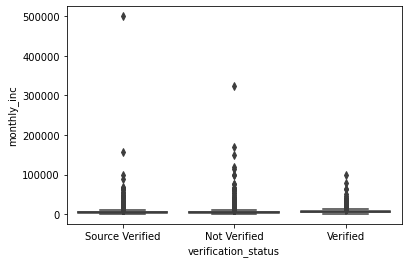

Boxplot of addr_state & loan_amnt


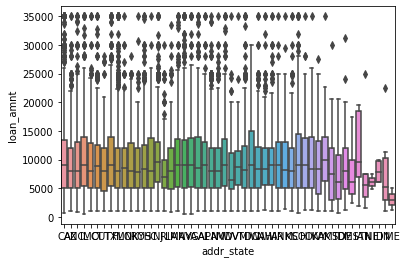

Boxplot of addr_state & funded_amnt


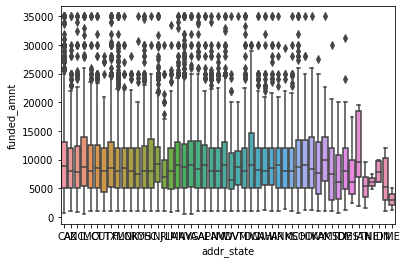

Boxplot of addr_state & funded_amnt_inv


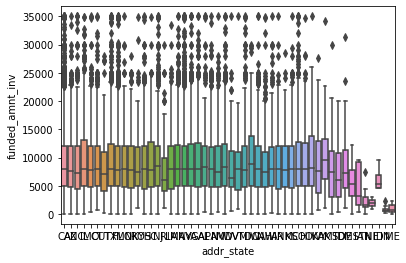

Boxplot of addr_state & int_rate


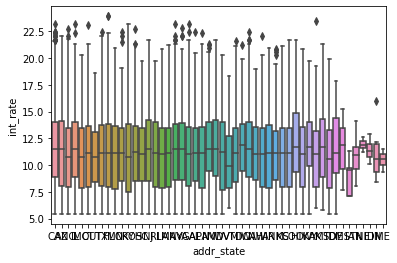

Boxplot of addr_state & installment


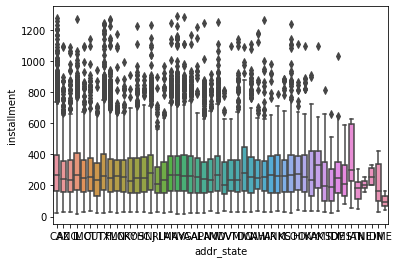

Boxplot of addr_state & annual_inc


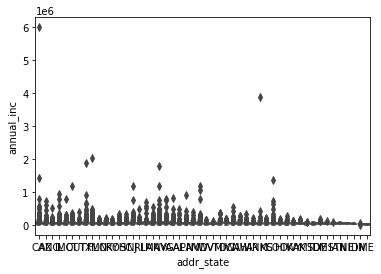

Boxplot of addr_state & dti


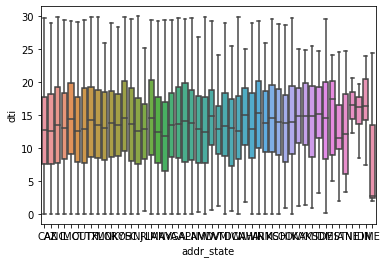

Boxplot of addr_state & delinq_2yrs


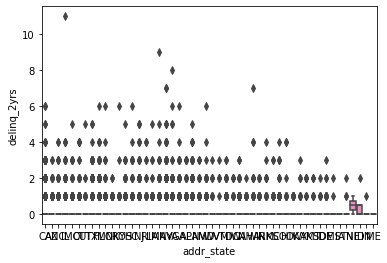

Boxplot of addr_state & inq_last_6mths


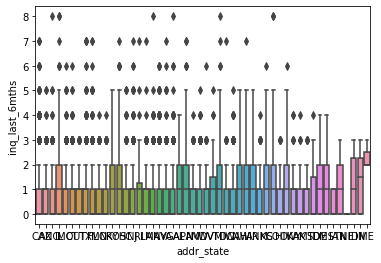

Boxplot of addr_state & open_acc


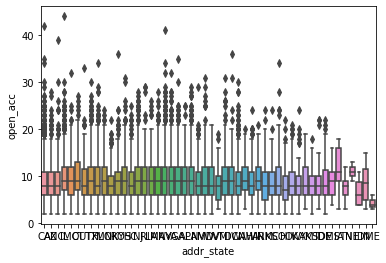

Boxplot of addr_state & pub_rec


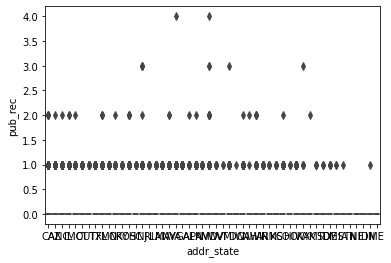

Boxplot of addr_state & revol_bal


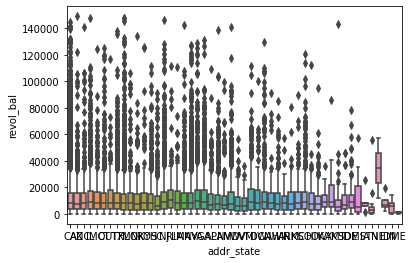

Boxplot of addr_state & revol_util


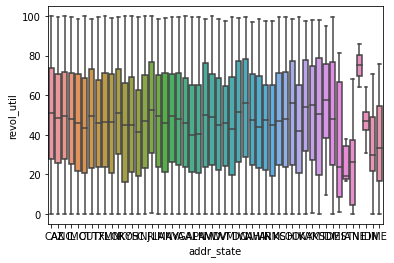

Boxplot of addr_state & total_acc


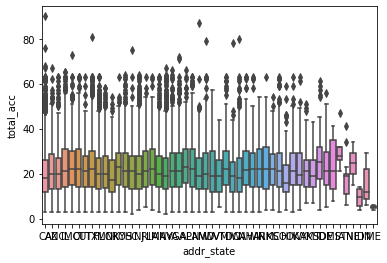

Boxplot of addr_state & out_prncp


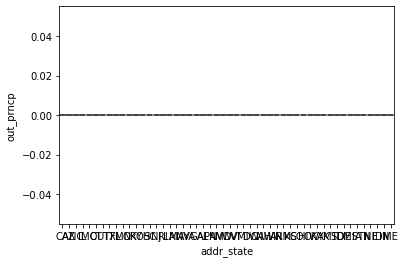

Boxplot of addr_state & out_prncp_inv


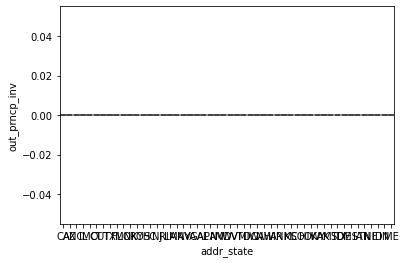

Boxplot of addr_state & total_pymnt


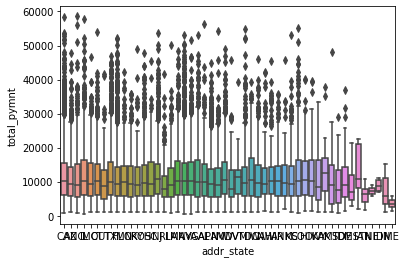

Boxplot of addr_state & total_pymnt_inv


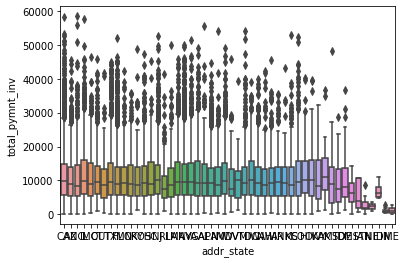

Boxplot of addr_state & total_rec_prncp


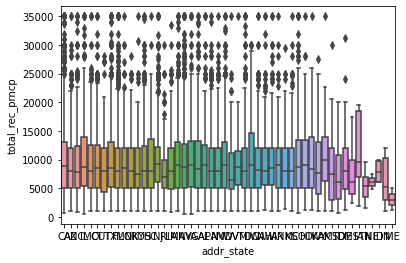

Boxplot of addr_state & total_rec_int


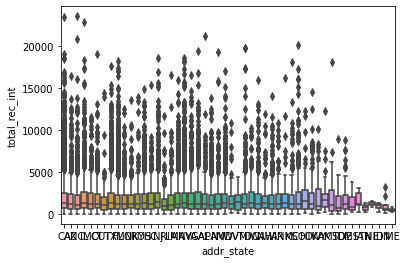

Boxplot of addr_state & total_rec_late_fee


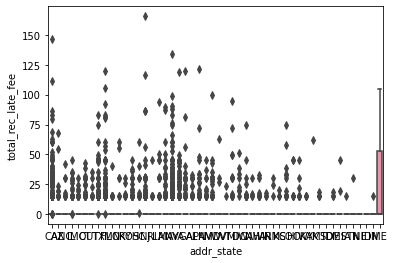

Boxplot of addr_state & recoveries


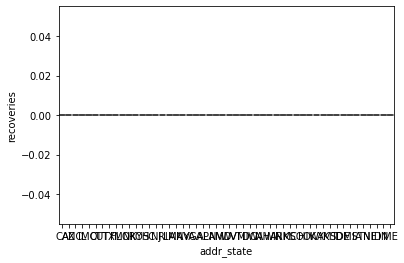

Boxplot of addr_state & collection_recovery_fee


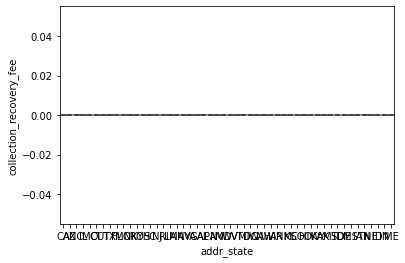

Boxplot of addr_state & last_pymnt_amnt


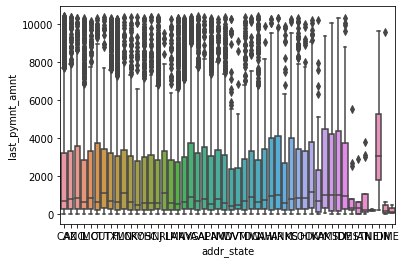

Boxplot of addr_state & monthly_inc


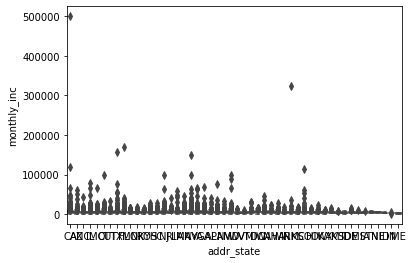

Boxplot of pub_rec_bankruptcies & loan_amnt


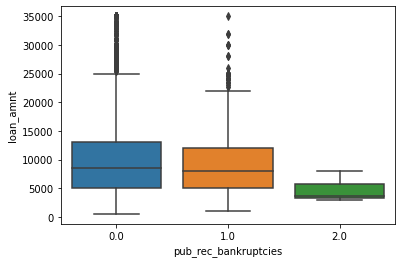

Boxplot of pub_rec_bankruptcies & funded_amnt


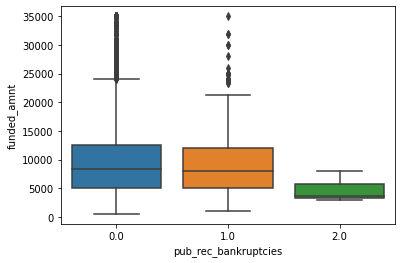

Boxplot of pub_rec_bankruptcies & funded_amnt_inv


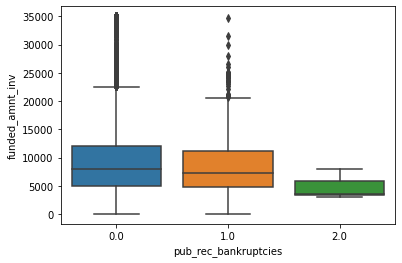

Boxplot of pub_rec_bankruptcies & int_rate


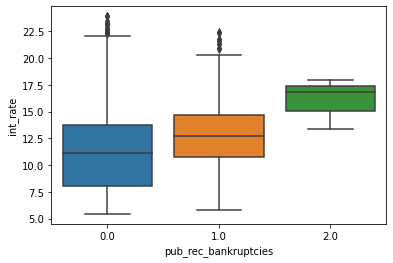

Boxplot of pub_rec_bankruptcies & installment


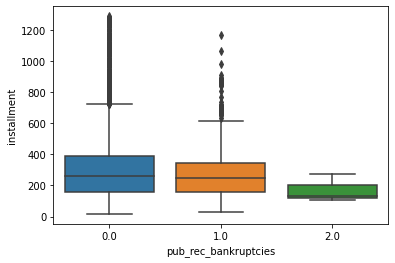

Boxplot of pub_rec_bankruptcies & annual_inc


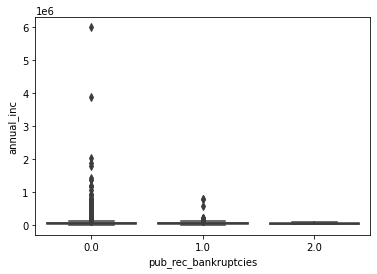

Boxplot of pub_rec_bankruptcies & dti


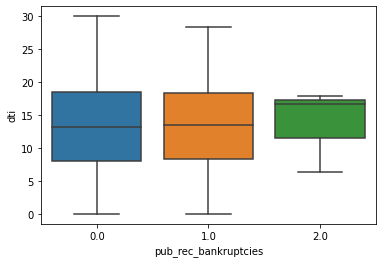

Boxplot of pub_rec_bankruptcies & delinq_2yrs


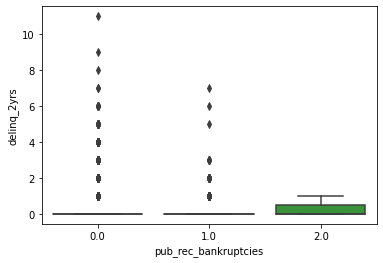

Boxplot of pub_rec_bankruptcies & inq_last_6mths


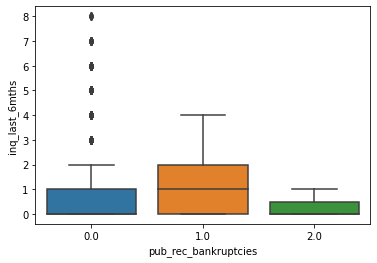

Boxplot of pub_rec_bankruptcies & open_acc


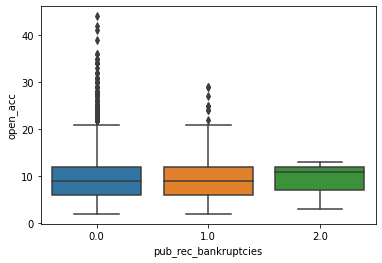

Boxplot of pub_rec_bankruptcies & pub_rec


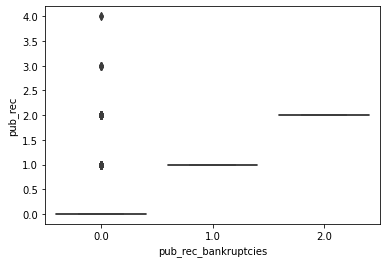

Boxplot of pub_rec_bankruptcies & revol_bal


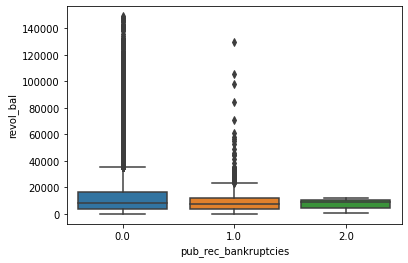

Boxplot of pub_rec_bankruptcies & revol_util


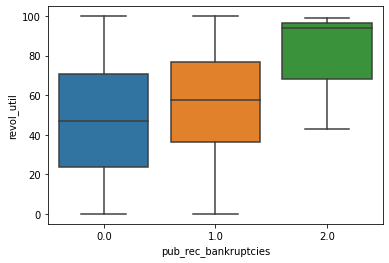

Boxplot of pub_rec_bankruptcies & total_acc


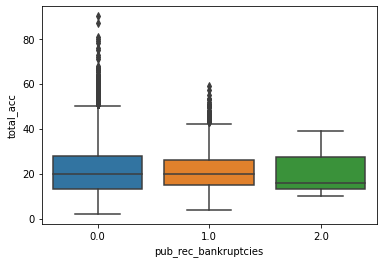

Boxplot of pub_rec_bankruptcies & out_prncp


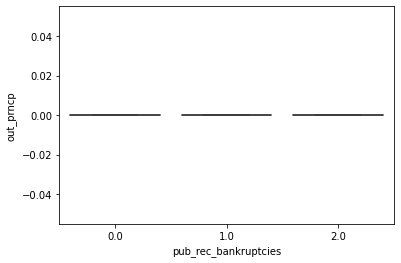

Boxplot of pub_rec_bankruptcies & out_prncp_inv


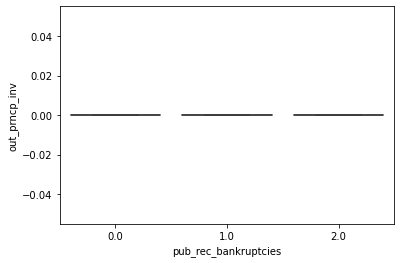

Boxplot of pub_rec_bankruptcies & total_pymnt


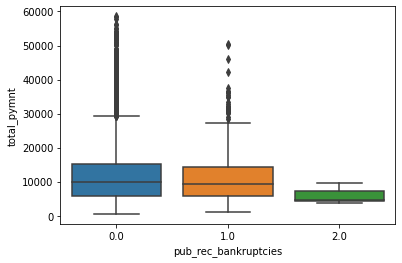

Boxplot of pub_rec_bankruptcies & total_pymnt_inv


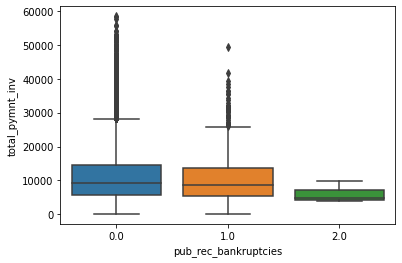

Boxplot of pub_rec_bankruptcies & total_rec_prncp


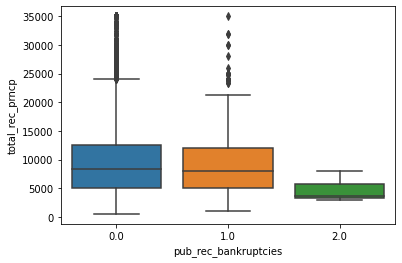

Boxplot of pub_rec_bankruptcies & total_rec_int


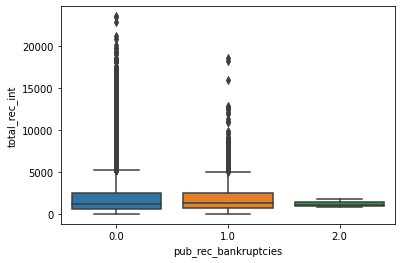

Boxplot of pub_rec_bankruptcies & total_rec_late_fee


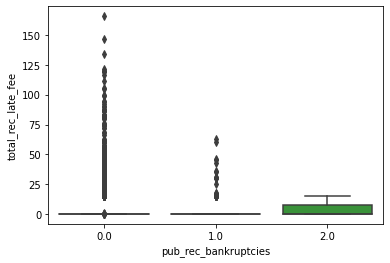

Boxplot of pub_rec_bankruptcies & recoveries


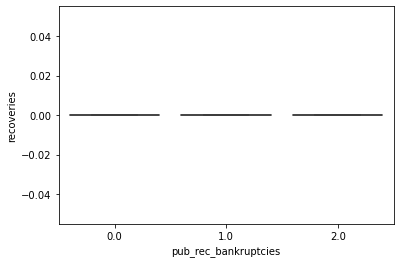

Boxplot of pub_rec_bankruptcies & collection_recovery_fee


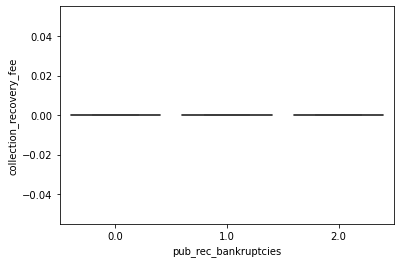

Boxplot of pub_rec_bankruptcies & last_pymnt_amnt


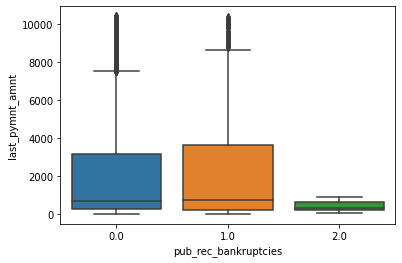

Boxplot of pub_rec_bankruptcies & monthly_inc


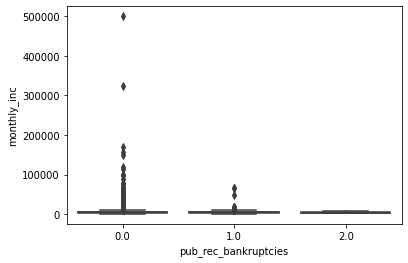

In [72]:
for i in catg_cols:
    for j in contn_cols:
        print("Boxplot of "+i+" & "+j)
        sns.boxplot(fully_paid_data[i],fully_paid_data[j])
        plt.show()

### Key Observations from above

1. The loan amount, funded amount, funded amount by investors, interest rate, installment, dti ratio tends to be higher for higher term (60 months) loans

2. For Grade G Loans, the loan amount is the highest wherease for Grade A Loans, it is the least. Moreover, for Grade G loans the interest rate is seen to be the highest whereas for Grade A Loans it is the lowest


3. The loan amount of applicants who have home ownership as Mortgage is higher as compared to other categories

4. The loan amount for the applicants whose verification status is verified is higher as compared to the applicants who are not verified. Moreover, the interest rate & installment for Not verified applicants is less 

5. The applicants for whom the Number of public record bankruptcies is 2, for them the interest rate is fairly high.

## Summary of Analysis

<b> Considering the analysis that was done, following were the main findings which can help the company in curtailing the risks associated with issuing the loans :</b>

- For the applicants for which the number of public record bankruptcies is 2 or more, the interest rate of the loan should be kept as high to limit the loss from the risk of defaulting, as it was observed that for charged off applicants, the interest rate was less wherease for the applicants who fully paid the loans, it was high.



- The mean dti ratio value was less for the applicants who fully paid the loan as compared to the ones who didn't. Hence, to limit the risk of issuing the loans to the defaultors, the bank can benchmark it against the mean value of the dti for applicants who fully paid the loan and accordingly issue the loans to the applicants who meet that benchmark value.


- The interest rate for charged off applicants whose income verification status is not verified is fairly less as compared to the verified ones. The bank can increase the interest rate for the applicants whose income verification status is not verified to curtail the risks of loss.


- The median value for Total Credit Revolving balance was observed to be fairly high for applicants that had charged off as compared to the applicants that didn't. Hence, to limit the risk, the bank can benchmark it against the median value of the Total Credit Revolving balance for applicants who fully paid the loan and accordingly issue the loans to the applicants who meet that benchmark value.


- It was noticed that there is a good difference between the average monthly income of the applicants that  charged off and the ones that had fully paid the loan amount. The bank can becnhmark this parameter value against the mean monthly income value of applicants who fully paid the loan and accordingly issue the loans to the applicants who meet that benchmark value.
